# WorldQuant University
## MscFE690 Capstone Project
### Student Group 7119

Abhijeet Aanand

Amparo Garcia Garcia

*NOTE.- Plotly graphs are interactive but unfortunately for conversion to pdf they are not the best option and sometimes the graph will appear as a blank space, therefore there is also the correspondant variant with matplotlib and seaborn.*

# Packages needed

In [202]:
!pip install riskfolio-lib

In [203]:
#Libraries we will need for the capstone project
import pandas as pd
import yfinance as yf
import numpy as np
import plotly.express as px
import seaborn as sn
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
import numpy as np
import matplotlib.pyplot as plt
import plotly.express as px
import plotly.offline as pyo
import plotly.io as pio
import cvxpy as cvx
import numpy as np
from scipy.optimize import nnls

pio.renderers.default = "notebook"

In [204]:
# List of some of the most important world stock indexes
#stock_indexes = pd.read_html('https://finance.yahoo.com/world-indices')[0]
#print('Shape of dataframe of stock indexes: ', stock_indexes.shape)
#Most traded stocks worldwide
#stock_indexes.sort_values(by="Volume", ascending=False).head()
#Most expensive indexes
#stock_indexes.sort_values(by="Last Price", ascending=False).head()

# World Wide Indexes

In [205]:
#Define some indexes from each continent
continents=['Africa', 'America', 'Asia', 'Europe', 'Oceania']
tickers_af=['^ZADOW', '^NQMAEURN'] #Dow Jones South Africa, Nasdaq Morocco EUR NTR
tickers_am=['^BVSP', '^DJI', '^IXIC', '^GSPC', '^MXX'] #Bovespa (Brasil), Dow Jones (USA), Nasdaq (USA), IPC Mexico
tickers_as=['^HSI', '^NSEI', '^N225'] #Hang Seng Index (China), Nifty 50 (India), Nikkei 255 (Japan)
tickers_eu=['^FCHI', '^GDAXI', '^IBEX', '^STOXX50E', '^FTSE'] #CAC 40 (France), DAX 30 (Germany), IBEX 35 (Spain), EuroStoxx 50 (Whole Euro Zone), FTSE 100 (UK)
tickers_oc=['^AXJO'] #S&P/ASX 200 (Australia)
start_date='2018-01-01'
end_date='2023-12-31'

In [206]:
def extract_data(tickers, start_date, end_date):
  #Inputs:
  # 1. tickers -> List of stocks tickers that are interesting for our index
  # 2. start_date -> Start date considered for the evolution of the index
  # 3. end_date -> Last date considered for the evolution of the index
  #Output:
  #It reuturns a list of three dataframes:
  # lista_df which is a list with all individual datasets for each stock
  # df_all which is an unique dataframe with one column for the adjusted price of each stock
  #df_returns_all which is an unique dataframe with one column for the returns of each stock
  df_all=pd.DataFrame()
  df_returns_all=pd.DataFrame()
  lista_df=[]
  for ticker in tickers:
    df=yf.download(ticker, start=start_date, end=end_date)
    df=df[['Adj Close', 'Volume']]
    lista_df.append(df)
    df_all[f'{ticker}']=df['Adj Close']
    df_returns_all[f'{ticker}']=np.log(df["Adj Close"] / df["Adj Close"].shift(1))

  return [lista_df, df_all, df_returns_all]

In [207]:
#Extract dataframes from different indices throughout the time
df_africa, df_af, df_ret_af=extract_data(tickers_af, start_date, end_date)
df_america, df_am, df_ret_am=extract_data(tickers_am, start_date, end_date)
df_asia, df_as, df_ret_as=extract_data(tickers_as, start_date, end_date)
df_europe, df_eu, df_ret_eu=extract_data(tickers_eu, start_date, end_date)
df_oceania, df_oc, df_ret_oc=extract_data(tickers_oc, start_date, end_date)
df_continents=[df_af, df_am, df_as, df_eu, df_oc]
df_returns_continents=[df_ret_af, df_ret_am, df_ret_as, df_ret_eu, df_ret_oc] #One dataframe as the join of all dataframes for different countries

[*********************100%***********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['^ZADOW']: YFPricesMissingError('$%ticker%: possibly delisted; no price data found  (1d 2018-01-01 -> 2023-12-31)')
[*********************100%***********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['^NQMAEURN']: YFPricesMissingError('$%ticker%: possibly delisted; no price data found  (1d 2018-01-01 -> 2023-12-31)')
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%****************

Statistics for Africa


,^ZADOW,^NQMAEURN
count,0.0,0.0
mean,NaN,NaN
std,NaN,NaN
min,NaN,NaN
25%,NaN,NaN
50%,NaN,NaN
75%,NaN,NaN
max,NaN,NaN


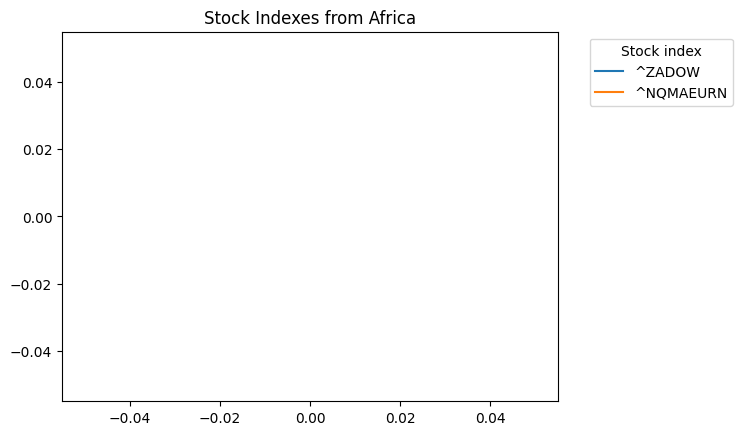

Statistics for America


,^BVSP,^DJI,^IXIC,^GSPC,^MXX
count,1486.000000,1448.000000,1448.000000,1448.000000,1455.000000
mean,103656.431359,29904.494079,10862.477749,3590.001816,47040.513364
std,14316.872524,4161.868370,2754.495955,690.505916,5366.535885
min,63570.000000,18591.929688,6332.990234,2237.399902,32964.218750
25%,95394.000000,25998.157227,7971.292603,2888.770020,43385.755859
50%,105530.500000,30046.304688,11146.259766,3688.635010,47884.628906
75%,114815.500000,33917.252930,13454.115234,4204.595093,51310.720703
max,134194.000000,37710.101562,16057.440430,4796.560059,57745.789062


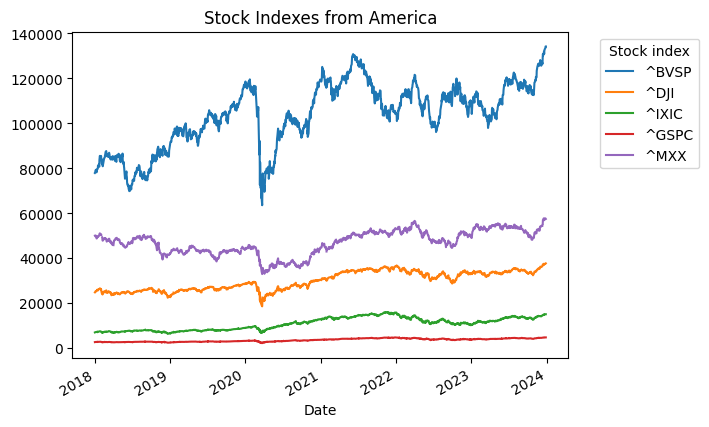

Statistics for Asia


,^HSI,^NSEI,^N225
count,1476.000000,1406.000000,1383.000000
mean,24714.723686,14244.860500,25608.416373
std,4141.279110,3400.624963,3831.726407
min,14687.019531,7610.250000,16552.830078
25%,20990.647949,11074.062744,22270.130859
50%,25558.565430,13902.899902,26170.300781
75%,28108.877441,17515.288086,28447.955078
max,33154.121094,21778.699219,33753.328125


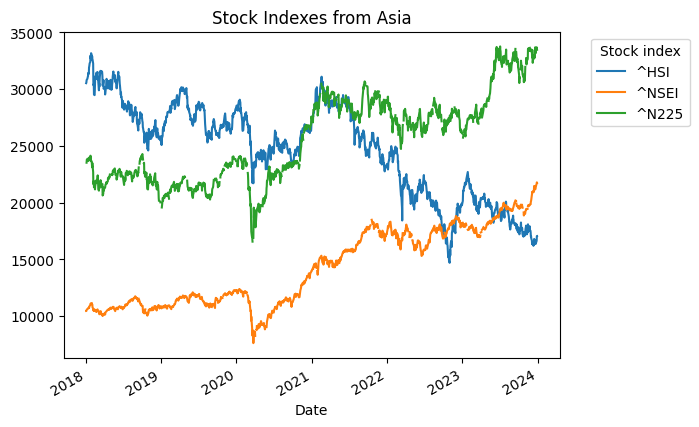

Statistics for Europe


,^FCHI,^GDAXI,^IBEX,^STOXX50E,^FTSE
count,1537.000000,1523.000000,1535.000000,1509.000000,1510.000000
mean,5988.280634,13587.317331,8779.078625,3692.238741,7147.872915
std,851.428385,1663.337689,867.381635,421.504538,536.796755
min,3754.840088,8441.709961,6107.200195,2385.820068,4993.899902
25%,5344.640137,12346.544922,8311.750000,3385.379883,7001.699951
50%,5889.700195,13253.740234,8966.200195,3611.080078,7277.700195
75%,6679.089844,15244.794922,9360.100098,4091.709961,7513.299927
max,7596.910156,16794.429688,10609.500000,4549.439941,8014.299805


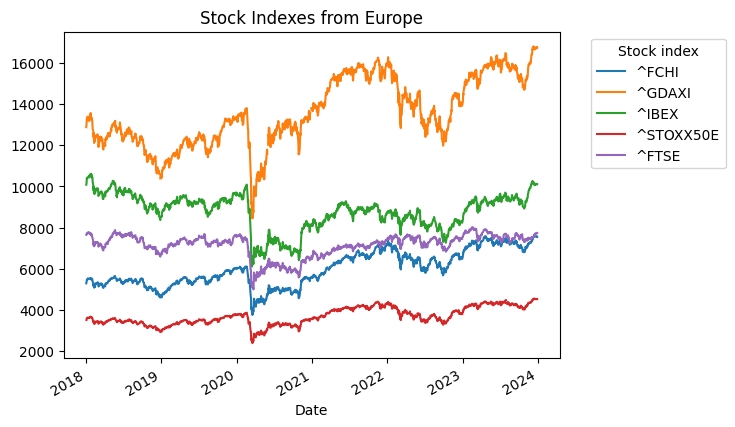

Statistics for Oceania


,^AXJO
count,1517.000000
mean,6662.082600
std,596.893016
min,4546.000000
25%,6155.600098
50%,6745.399902
75%,7175.799805
max,7628.899902


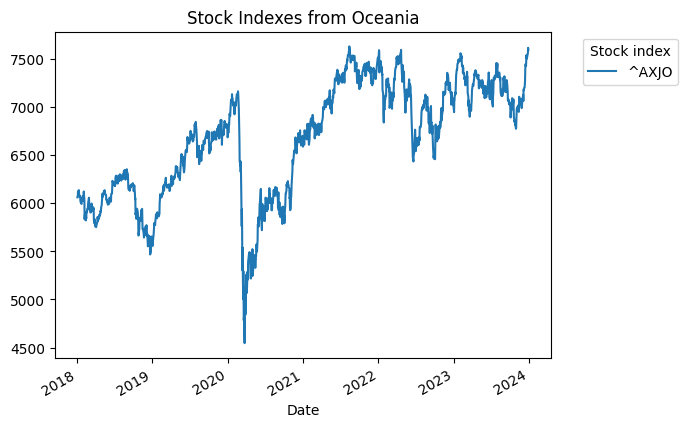

In [208]:
#Plot the evolution of indexes thorughout the time regarding its continent
for i in range(len(continents)):
  print(f'Statistics for {continents[i]}')
  display(df_continents[i].describe())
  #display(px.line(df_continents[i], title=f'Stock Indexes from {continents[i]}'))
  (df_continents[i]).plot()
  plt.title(f'Stock Indexes from {continents[i]}')
  plt.legend(title='Stock index', bbox_to_anchor=(1.05, 1), loc='upper left')
  plt.show()


In [209]:
df_all_continents=pd.concat([df_af, df_am, df_as, df_eu, df_oc])
df_all_continents.head()

,^ZADOW,^NQMAEURN,^BVSP,^DJI,^IXIC,^GSPC,^MXX,^HSI,^NSEI,^N225,^FCHI,^GDAXI,^IBEX,^STOXX50E,^FTSE,^AXJO
2018-01-02 00:00:00+00:00,NaN,NaN,77891.0,24824.009766,7006.899902,2695.810059,50033.949219,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2018-01-03 00:00:00+00:00,NaN,NaN,77995.0,24922.679688,7065.529785,2713.060059,49782.230469,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2018-01-04 00:00:00+00:00,NaN,NaN,78647.0,25075.130859,7077.910156,2723.989990,49744.621094,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2018-01-05 00:00:00+00:00,NaN,NaN,79071.0,25295.869141,7136.560059,2743.149902,49887.738281,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2018-01-08 00:00:00+00:00,NaN,NaN,79379.0,25283.000000,7157.390137,2747.709961,49995.570312,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


<Figure size 10000x1000 with 0 Axes>

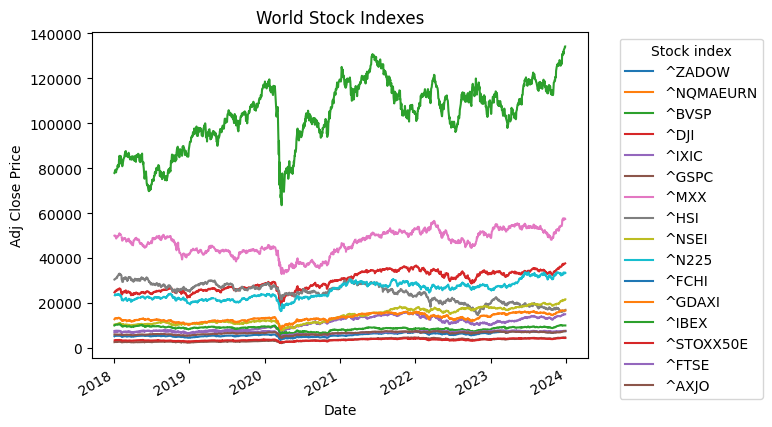

In [210]:
#px.line(df_all_continents, title=f'World Stock Indexes')
plt.figure(figsize=(100,10))
df_all_continents.plot()
plt.legend(title='Stock index', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.title('World Stock Indexes')
plt.xlabel('Date')
plt.ylabel('Adj Close Price')
plt.show();

As it is shown in the graphs above, BOVESPA and NSEI are chosen because they are from BRICS countries so it will be interesting to analyze them regarding for example GDAXI (Germany) and IBEX (Spain). From USA Dow Jones (DJI) will be our choice.

From Africa and Australia none are chosen as there are not so many data available of them.

# GDAXI Index (Germany)

In [211]:
# DAX 30 is the index of Germany. For this project it will be analyzed from 1st of January 2022 until 31st of December 2023.
start_date='2022-01-01'
end_date='2023-12-31'
gdaxi_stocks=['BAYN.DE' , 'VNA.DE' , 'ENR.DE' , 'SHL.DE' , 'RWE.DE' , 'SY1.DE' , '1COV.DE' , 'ADS.DE' , 'MRK.DE' , 'MTX.DE' , 'EOAN.DE' , 'BEI.DE' , 'DTE.DE' , 'HEI.DE' , 'ALV.DE' , 'P911.DE' , 'DB1.DE' , 'DHL.DE' , 'ZAL.DE' , 'FRE.DE' , 'DBK.DE' , 'HNR1.DE' , 'DTG.DE' , 'SIE.DE' , 'AIR.DE' , 'BMW.DE' , 'BAS.DE' , 'VOW3.DE' , 'CON.DE' , 'IFX.DE']

def get_correlations(market_index, continent, stocks, start_date, end_date):
  #Function that plots the correlation matrix of adjusted prices and returns of the stocks
  #Inputs:
  # 1. market_index -> stock of the index studied
  # 2. continent -> Continent of the country where the index belongs
  # 3. stocks -> List of stocks that are components of the index
  # 4. start_date -> Start date considered for the evolution of the index
  # 5. end_date -> Last date considered for the evolution of the index
  #Outputs:
  #1. Correlation matrix of the adjusted prices of stocks and their index
  #2. Correlation matrix of the returns of stocks and their index
  #Several plots of the correlation matrixes

  df1, df2, df3=extract_data(stocks, start_date, end_date);
  df2.fillna(0,inplace=True) #Adjusted close prices dataframe
  if continent=='EU':
    df2.loc[:,f'{market_index}']=df_eu[f'^{market_index}']
  elif continent=='AM':
    df2.loc[:,f'{market_index}']=df_am[f'^{market_index}']
  elif continent=='AF':
    df2.loc[:,f'{market_index}']=df_af[f'^{market_index}']
  elif continent=='AS':
    df2.loc[:,f'{market_index}']=df_as[f'^{market_index}']
  elif continent=='OC':
    df2.loc[:,f'{market_index}']=df_oc[f'^{market_index}']
  else:
    print('Not a valid continent')
  #display(px.line(df2.drop(f'{market_index}', axis=1), title=f'{market_index} market index components'))
  plt.figure(figsize=(100,10))
  (df2.drop(f'{market_index}', axis=1)).plot()
  plt.title(f'{market_index} market index components')
  plt.legend(title='Stock index', bbox_to_anchor=(1.05, 1), loc='upper left', ncol=2)
  plt.show()



  #display(px.line(df2[f'{market_index}'], title=f'{market_index} market index'))

  (df2[f'{market_index}']).plot()
  plt.title(f'{market_index} market index ')
  plt.legend(title='Stock index', bbox_to_anchor=(1.05, 1), loc='upper left')
  plt.show()


  #display(px.imshow(round(df2.corr(),3), text_auto=True, aspect="auto", title='Correlation of Adjusted Prices'))
  fig, ax = plt.subplots(figsize=(30, 15))

  sn.heatmap(round(df2.corr(),3), annot=True) #Plot correlation between adjusted close prices
  fig.set_tight_layout(True)
  plt.title('Correlation of Adjusted Prices')
  plt.show()
  #Now we will do the same with the returns
  df4 = df2.pct_change() #Returns dataframe
  df4 = df4[1:]
  #display(px.imshow(round(df4.corr(),3), text_auto=True, aspect="auto", title='Correlation of Returns'))

  fig, ax = plt.subplots(figsize=(30, 15))

  sn.heatmap(round(df4.corr(),3), annot=True) #Plot correlation between returns
  fig.set_tight_layout(True)
  plt.title('Correlation of Returns')
  plt.show()

  return [df2, df4]

[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%********

<Figure size 10000x1000 with 0 Axes>

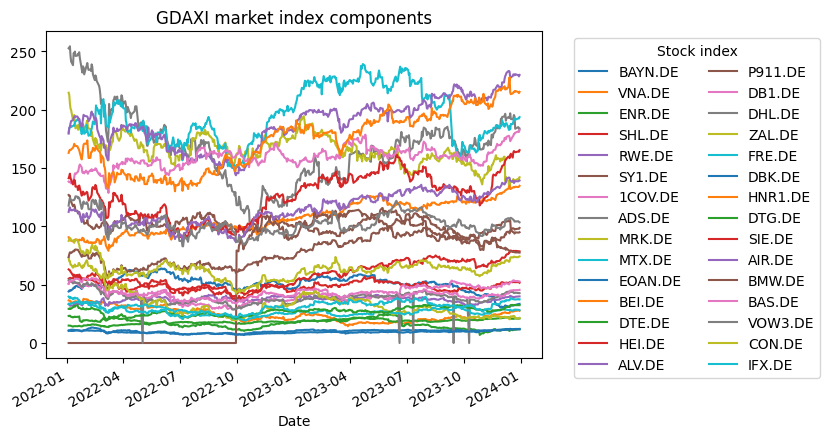

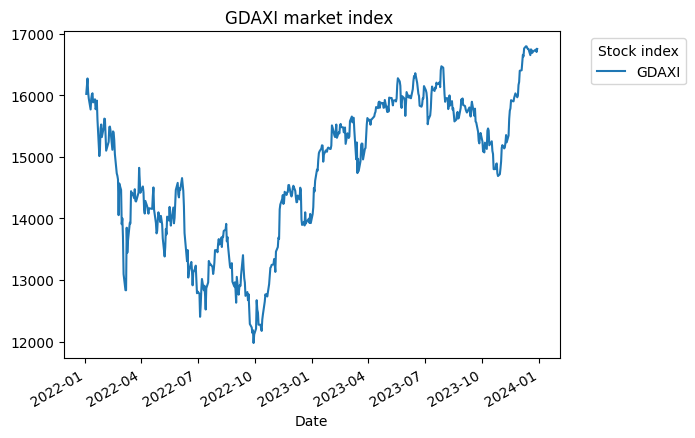

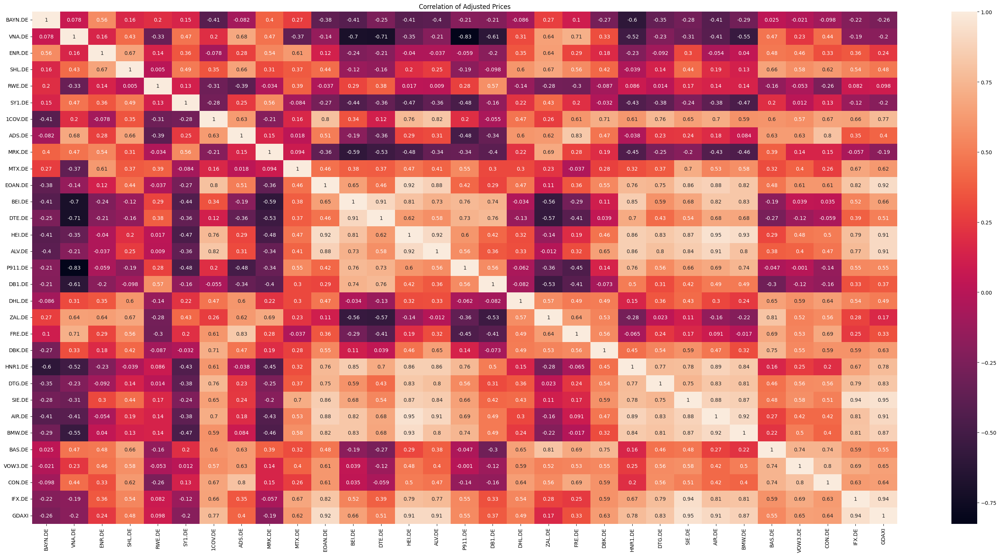

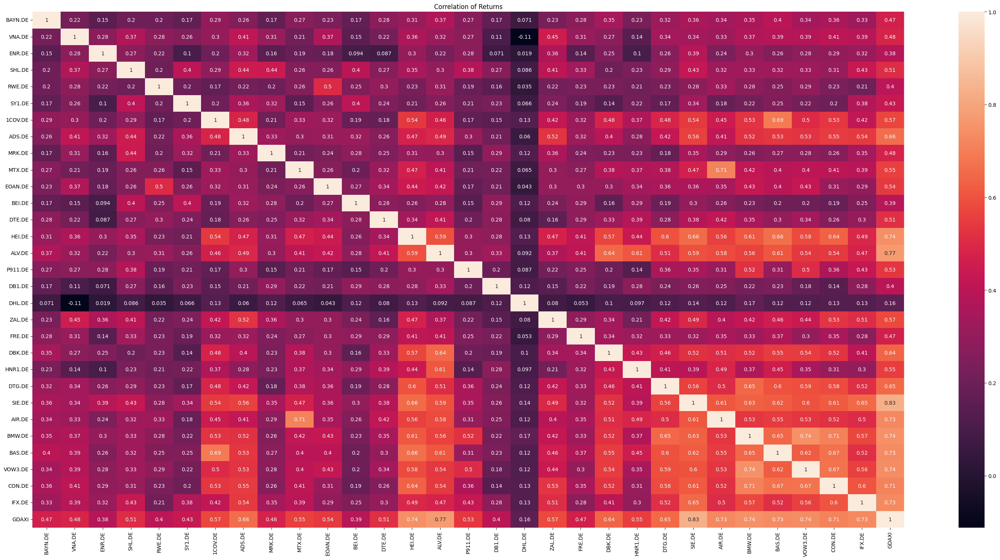

In [212]:
df_gdaxi, df_gdaxi_returns= get_correlations('GDAXI', 'EU', gdaxi_stocks, start_date, end_date)


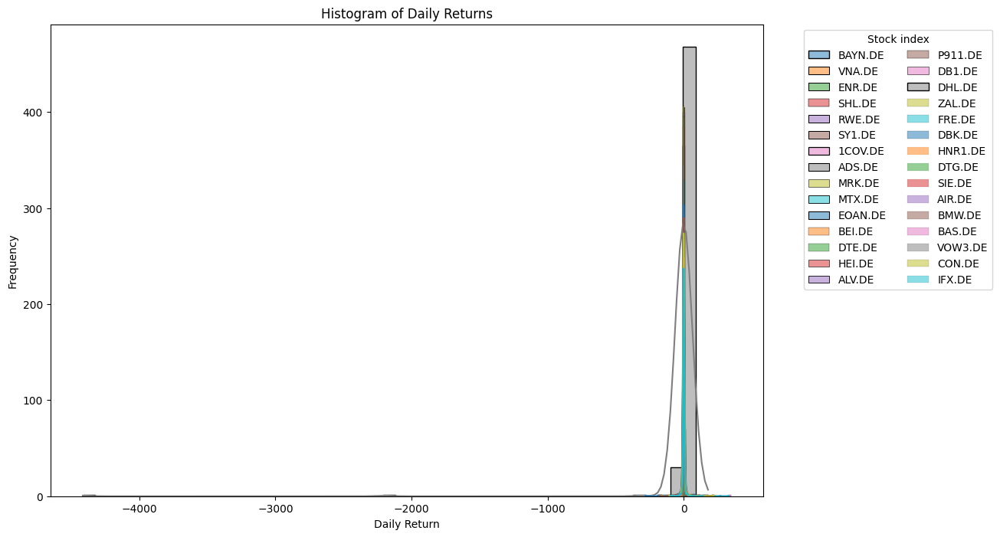

In [213]:
plt.figure(figsize=(12, 8))
for symbol in gdaxi_stocks:
    returns = df_gdaxi_returns[symbol].pct_change().dropna()
    sn.histplot(returns, bins=50, kde=True, label=symbol)
plt.title('Histogram of Daily Returns')
plt.legend(title='Stock index', bbox_to_anchor=(1.05, 1), loc='upper left', ncol=2)
plt.xlabel('Daily Return')
plt.ylabel('Frequency')
plt.show()

## Replication methods

### 1st Method: Riskfolio-Lib

First, we tried an already programmed portfolio as the easiest and fastest way.

In [214]:
import riskfolio as rp
import warnings
warnings.filterwarnings("ignore")

In [215]:
#Function to apply riskfolio with inputs of stocks, the index to replicate, the dates of start and ending
def get_data_rp(stocks, index, start_date, end_date):
  #Function that replicates the index with riskfolio library
  #Inputs:
  # 1. stocks -> Lists of stocks that are components of the index
  # 2. index -> Market index replicated
  # 3. start_date -> Start date considered for the evolution of the index
  # 4. end_date -> Last date considered for the evolution of the index
  #Outputs:
  #1. w : Vector of weights of each stock according the riskfolio
  #2. frontier: Frontier  of each stock in the replicated index according the riskfolio
  #3. port: Optimized portfolio
  stocks_dax=stocks
  stocks_dax.append(index)
  data = yf.download(stocks_dax, start=start_date, end=end_date)
  data = data.loc[:, ("Adj Close", slice(None))]
  data.columns = stocks_dax
  returns = data.pct_change()
  returns=returns[1:]
  returns.fillna(0, inplace=True)
  bench_returns = returns.pop(index).to_frame()
  port = rp.Portfolio(returns=returns)
  port.assets_stats(method_mu="hist", method_cov="hist")
  port.kindbench = False
  port.benchindex = bench_returns
  port.allowTE = True
  port.TE = 0.008
  w = port.optimization(model="Classic", rm="CVaR", obj="Sharpe", rf=0, l=0, hist=True)
  frontier = port.efficient_frontier(model="Classic", rm="CVaR",points=100,rf=0,hist=True)

  return [w, frontier, port]

In [216]:
gdaxi_stocks=['BAYN.DE' , 'VNA.DE' , 'ENR.DE' , 'SHL.DE' , 'RWE.DE' , 'SY1.DE' , '1COV.DE' , 'ADS.DE' , 'MRK.DE' , 'MTX.DE' , 'EOAN.DE' , 'BEI.DE' , 'DTE.DE' , 'HEI.DE' , 'ALV.DE' , 'P911.DE' , 'DB1.DE' , 'DHL.DE' , 'ZAL.DE' , 'FRE.DE' , 'DBK.DE' , 'HNR1.DE' , 'DTG.DE' , 'SIE.DE' , 'AIR.DE' , 'BMW.DE' , 'BAS.DE' , 'VOW3.DE' , 'CON.DE' , 'IFX.DE']
w, frontier, port=get_data_rp(gdaxi_stocks, '^GDAXI', start_date, end_date)

[*********************100%***********************]  31 of 31 completed


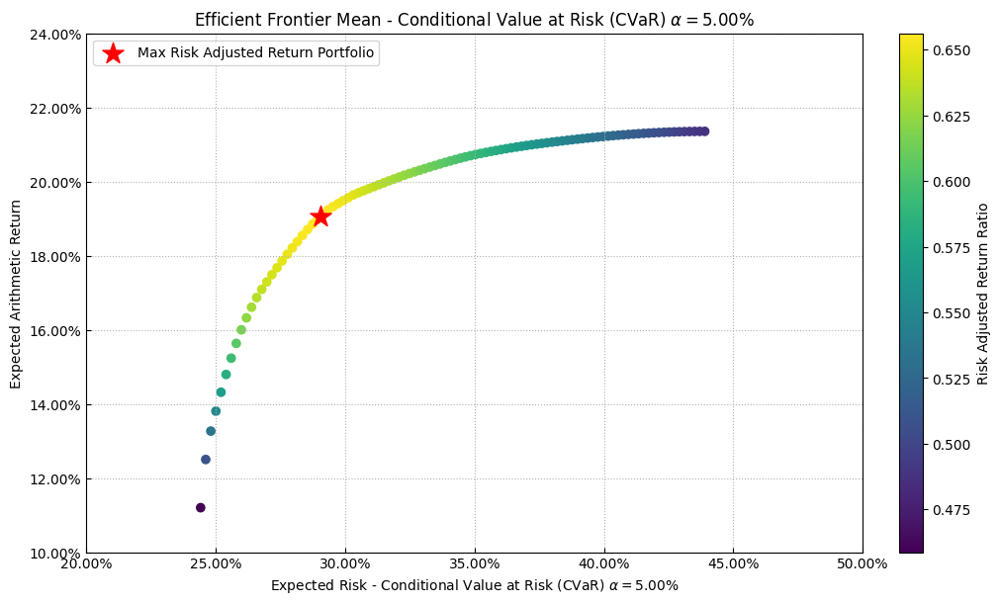

In [217]:
g1 = rp.plot_frontier(w_frontier=frontier,mu=port.mu,cov=port.cov,returns=port.returns,rm="CVaR",rf=0,cmap="viridis",w=w,label="Max Risk Adjusted Return Portfolio",marker="*")

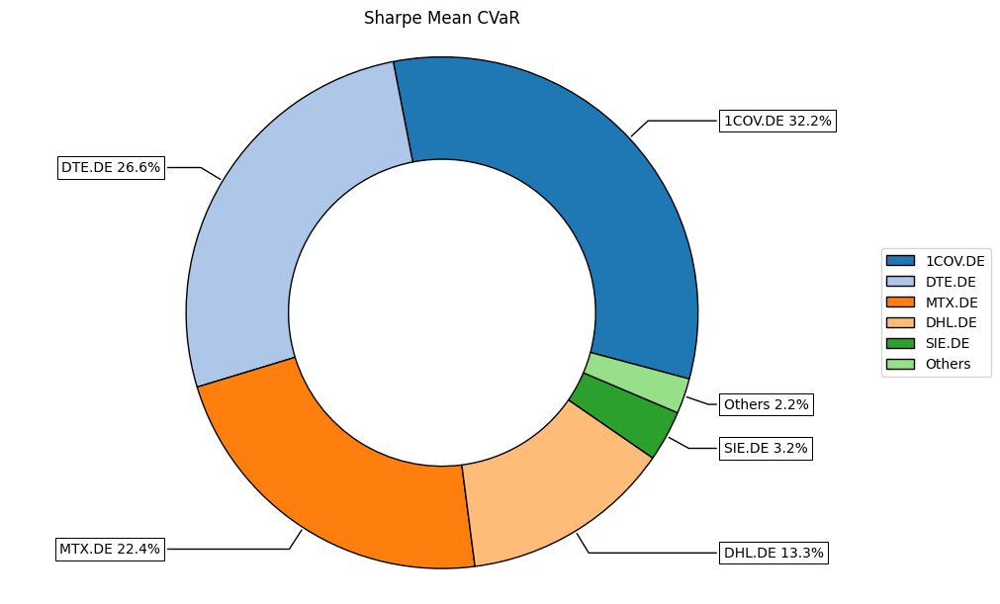

In [218]:
g2=rp.plot_pie(w=w,title="Sharpe Mean CVaR",others=0.05,nrow=25,cmap="tab20",height=6,width=10);


In [219]:
df_gdaxi_rp=pd.DataFrame(df_gdaxi_returns.iloc[:, :-1].mul(list(w['weights']), axis=1).sum(axis=1))
df_gdaxi_rp.rename(columns={0:'GDAXI_Replicated_Riskfolio'}, inplace=True)
weights_riskfolio=list(w['weights'])
df_gdaxi_rp.head()

,GDAXI_Replicated_Riskfolio
Date,
2022-01-04 00:00:00+00:00,0.011769
2022-01-05 00:00:00+00:00,0.008885
2022-01-06 00:00:00+00:00,-0.004316
2022-01-07 00:00:00+00:00,-0.004212
2022-01-10 00:00:00+00:00,-0.023083


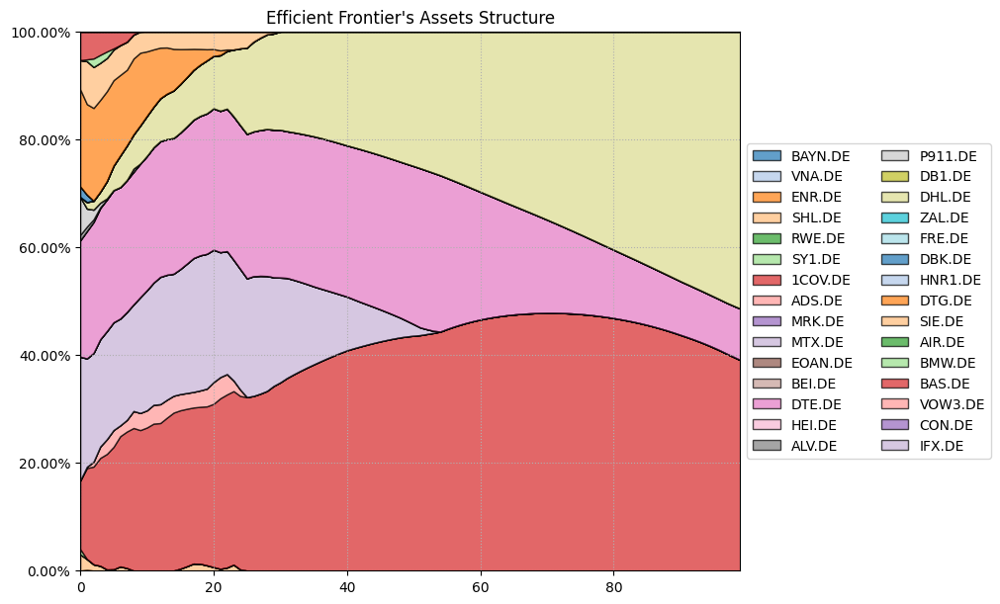

In [220]:
g3 = rp.plot_frontier_area(w_frontier=frontier, ax=None)

### 2nd Method: Give weights with Principal Component Analysis

Principal components is a method that is often used for calculating importances of some variables regarding the index

[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%********

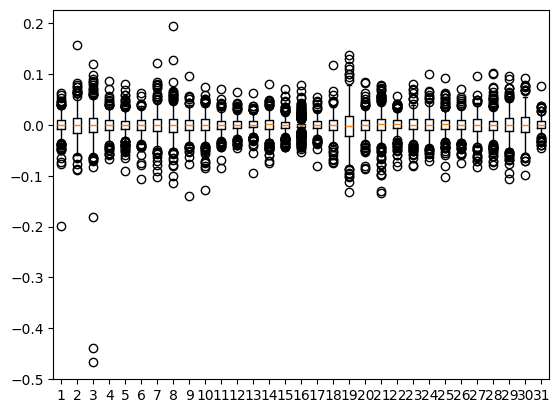

In [221]:
gdaxi_stocks=['BAYN.DE', 'VNA.DE', 'ENR.DE', 'SHL.DE', 'RWE.DE', 'SY1.DE', '1COV.DE', 'ADS.DE', 'MRK.DE', 'MTX.DE', 'EOAN.DE', 'BEI.DE', 'DTE.DE', 'HEI.DE', 'ALV.DE', 'P911.DE', 'DB1.DE', 'DHL.DE', 'ZAL.DE', 'FRE.DE', 'DBK.DE', 'HNR1.DE', 'DTG.DE', 'SIE.DE', 'AIR.DE', 'BMW.DE', 'BAS.DE', 'VOW3.DE', 'CON.DE', 'IFX.DE', '^GDAXI']
num_stocks=len(gdaxi_stocks)
lista_df, df_gdaxi, df_gdaxi_returns=extract_data(gdaxi_stocks, start_date, end_date )
df_gdaxi_returns=df_gdaxi_returns.iloc[1:, :]
df_gdaxi_returns.fillna(0, inplace=True)
#px.box(df_gdaxi_returns)
plt.boxplot(df_gdaxi_returns)
plt.show()

There are some outliers in the stocks data.

In [222]:
scaler=StandardScaler()
df_gdaxi_returns.iloc[:, :-1]=df_gdaxi_returns.iloc[:, :-1].replace(np.inf, np.nan)
df_gdaxi_returns.iloc[:, :-1]=df_gdaxi_returns.iloc[:, :-1].replace(-np.inf, np.nan)
df_gdaxi_returns.iloc[:, :-1]=df_gdaxi_returns.iloc[:, :-1].fillna(0)
pca = PCA(random_state=42)
pca.fit(df_gdaxi_returns.iloc[:, :-1])

# Calcular la varianza explicada y los pesos
variance = pca.explained_variance_ratio_
pesos = pca.components_.T @ variance
weights_pca=pesos
len(pesos)

30

In [223]:
df_gdaxi_returns_replicated=df_gdaxi_returns.copy()
for i in range(len(pesos)):
  df_gdaxi_returns_replicated.iloc[:, i]=df_gdaxi_returns_replicated.iloc[:, i]*pesos[i]
df_gdaxi_returns_replicated['GDAXI_REP_PCA']=df_gdaxi_returns_replicated.iloc[:,:-1].sum(axis=1)
df_gdaxi_returns_replicated=df_gdaxi_returns_replicated[['GDAXI_REP_PCA', '^GDAXI']]
df_gdaxi_returns_replicated.head()

,GDAXI_REP_PCA,^GDAXI
Date,,
2022-01-04 00:00:00+00:00,0.005993,0.008198
2022-01-05 00:00:00+00:00,0.012534,0.007349
2022-01-06 00:00:00+00:00,-0.029174,-0.013595
2022-01-07 00:00:00+00:00,-0.008866,-0.006518
2022-01-10 00:00:00+00:00,-0.023113,-0.011317


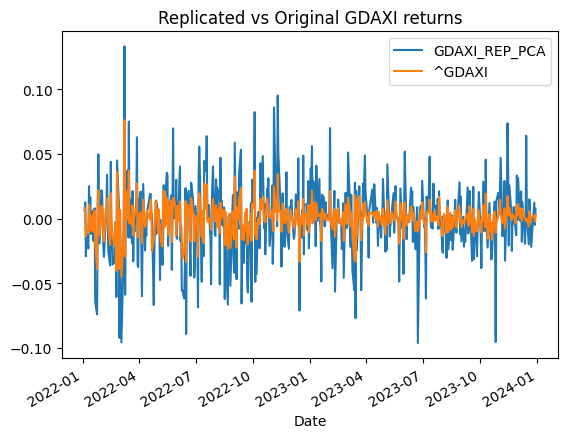

In [224]:
#px.line(df_gdaxi_returns_replicated)
df_gdaxi_returns_replicated.plot()
plt.title("Replicated vs Original GDAXI returns")
plt.show();

In [225]:
pesos

array([ 0.04320659,  0.10164029,  0.18296982,  0.06352297,  0.03535347,
        0.03094058,  0.08219363,  0.13261129,  0.02354255, -0.00305484,
        0.02720486,  0.02775781,  0.00355739,  0.05637788,  0.03521358,
        0.03724167,  0.01262688,  0.04199569,  0.2017871 ,  0.04941766,
        0.0784336 , -0.00272162,  0.0590551 ,  0.05500828,  0.03098003,
        0.06934705,  0.07055109,  0.08445458,  0.13300421,  0.08022242])

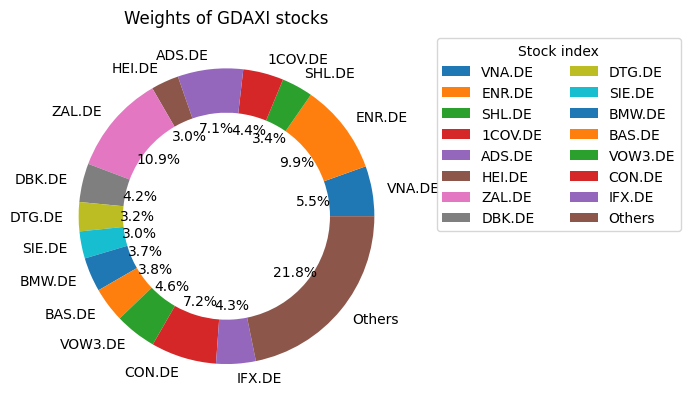

In [226]:
important_pesos=[abs(x) for x in pesos if x>0.05]
important_labels=[stock for stock, x in zip(gdaxi_stocks, pesos) if x>0.05]
peso_resto=sum([abs(x) for x in pesos if x<0.05])
important_pesos.append(peso_resto)
important_labels.append('Others')
plt.pie(important_pesos, labels=important_labels, autopct='%1.1f%%', wedgeprops=dict(width=0.3))
plt.title('Weights of GDAXI stocks')
plt.legend(title='Stock index', bbox_to_anchor=(1.05, 1), loc='upper left', ncol=2)
plt.show()

### 3rd Method: Sparse Method without MonteCarlo

In [227]:

#Function to replicate with sparse method without MonteCarlo
def sparse_tracking(num_stocks, returns, index_returns,UpperBound, threshold, r):
  #Function that replicates the market index with sparse method but without MonteCarlo
  #Inputs:
  #1. num_stocks: number of stocks considered in the index
  #2. returns: dataframe with the returns of stocks that are components of the index
  #3. index_returns: dataframe with the index returns
  #4. UpperBound: upperbound to force the method to converge
  #5. threshold: tolerance
  #6. r: risk free rate
  #Outputs:
  #1. opt_value: Optimized value for stocks in the replication solution
  #2. opt_w: Optimal weights for each stock in the replication solution
  #3. t: intermediate result to generate the tracking error
  #4. tracking_error: Tracking error of the solution
    beta = cvx.Variable(num_stocks)
    t = cvx.Variable()
    opt_sol = np.array([])
    opt_val = np.inf
    opt_t = np.inf
    tracking_error = cvx.sum_squares(cvx.matmul(returns,beta) - index_returns)
    aim = cvx.Minimize(tracking_error + t)
    bs_constr = [beta >= 0, t >= 0, cvx.sum(beta) == 1]

    for i in range(num_stocks):
        constr = bs_constr + [cvx.log(beta[i]) + cvx.log(t) >= cvx.log(r)]
        eq = cvx.Problem(aim, constr)
        eq.solve()
        upperBound = eq.value - t.value + r *(np.sum(np.array(beta.value).reshape(-1,) > threshold))
        if upperBound < UpperBound:
            UpperBound = upperBound
        if eq.value < opt_val:
            opt_val = eq.value
            opt_sol = beta.value
            opt_t = t.value
    print(f"Solution found at step {i}")
    opt_value = opt_val
    opt_w = np.array(opt_sol).reshape(-1,)
    t = opt_t
    tracking_error = opt_value - opt_t
    return [opt_value, opt_w, t, tracking_error]

In [228]:
gdaxi_stocks=['BAYN.DE', 'VNA.DE', 'ENR.DE', 'SHL.DE', 'RWE.DE', 'SY1.DE', '1COV.DE', 'ADS.DE', 'MRK.DE', 'MTX.DE', 'EOAN.DE', 'BEI.DE', 'DTE.DE', 'HEI.DE', 'ALV.DE', 'P911.DE', 'DB1.DE', 'DHL.DE', 'ZAL.DE', 'FRE.DE', 'DBK.DE', 'HNR1.DE', 'DTG.DE', 'SIE.DE', 'AIR.DE', 'BMW.DE', 'BAS.DE', 'VOW3.DE', 'CON.DE', 'IFX.DE']
num_stocks=len(gdaxi_stocks)
lista_df, df_gdaxi, df_gdaxi_returns=extract_data(gdaxi_stocks, start_date, end_date )
lista_df_index, df_gdaxi_index, df_gdaxi_index_returns=extract_data(['^GDAXI'], start_date, end_date )
df_gdaxi_index_returns=df_gdaxi_index_returns[1:]
df_gdaxi_index_returns.fillna(0, inplace=True)
df_gdaxi_returns=df_gdaxi_returns[1:]
df_gdaxi_returns.fillna(0, inplace=True)
index_returns=df_gdaxi.sum(axis=1)
index_returns=np.log(index_returns / index_returns.shift(1))
index_returns.dropna(inplace=True)
threshold= 1e-7
r=0.01
opt_value, opt_w, t, tracking_error= sparse_tracking(num_stocks, df_gdaxi_returns, df_gdaxi_index_returns['^GDAXI'],  np.inf, threshold, r)
stocks_considered=np.array(gdaxi_stocks)[opt_w > threshold]
print('Found ', len(stocks_considered), ' stocks with weight bigger than threshold: ', stocks_considered)
weights_sparse_withoutMC=opt_w
print("Optimal weights: " ,opt_w)
print("Tracking error: ", (tracking_error)**0.5 )
print("Optimal Solution ", opt_value)


[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%********

Solution found at step 29
Found  24  stocks with weight bigger than threshold:  ['BAYN.DE' 'VNA.DE' 'ENR.DE' 'SHL.DE' 'RWE.DE' 'SY1.DE' 'ADS.DE' 'MRK.DE'
 'MTX.DE' 'EOAN.DE' 'BEI.DE' 'DTE.DE' 'HEI.DE' 'ALV.DE' 'P911.DE' 'DB1.DE'
 'DHL.DE' 'ZAL.DE' 'SIE.DE' 'AIR.DE' 'BMW.DE' 'VOW3.DE' 'CON.DE' 'IFX.DE']
Optimal weights:  [1.25314030e-02 1.19878657e-02 1.04425148e-02 2.00590077e-02
 8.41440418e-03 3.58210630e-02 1.22090272e-08 3.42313109e-07
 3.47108995e-02 2.68170643e-02 1.72571503e-02 1.14079290e-07
 5.60423393e-03 7.24666084e-07 5.51766244e-01 6.71283916e-03
 1.10950005e-06 3.61718696e-02 1.31688830e-02 2.10754449e-08
 2.60123742e-09 3.90600239e-09 7.53876577e-08 8.43281346e-02
 5.41066938e-03 1.41764688e-02 2.68104671e-08 4.96702031e-02
 9.34543618e-07 5.49457151e-02]
Tracking error:  0.09896071834369138
Optimal Solution  0.027916840832910832


In [229]:
df_gdaxi_sparse=pd.DataFrame(df_gdaxi_returns.mul(opt_w, axis=1).sum(axis=1))
df_gdaxi_sparse.rename(columns={0:'GDAXI_Replicated'}, inplace=True)
df_gdaxi_sparse['GDAXI_orig']=df_gdaxi_index_returns
df_gdaxi_sparse.head()

,GDAXI_Replicated,GDAXI_orig
Date,,
2022-01-04 00:00:00+00:00,0.017308,0.008198
2022-01-05 00:00:00+00:00,0.004660,0.007349
2022-01-06 00:00:00+00:00,-0.000390,-0.013595
2022-01-07 00:00:00+00:00,0.004141,-0.006518
2022-01-10 00:00:00+00:00,-0.008009,-0.011317


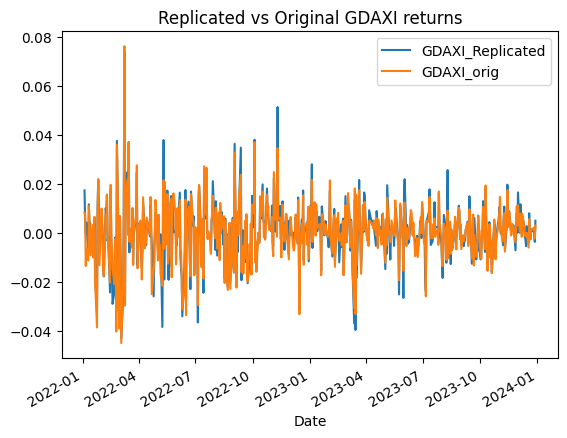

In [230]:
df_gdaxi_sparse.plot()
plt.title("Replicated vs Original GDAXI returns")
plt.show();

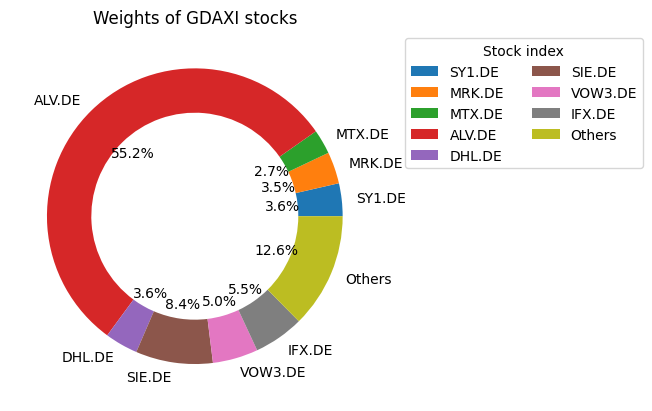

In [231]:
important_pesos=[abs(x) for x in opt_w if x>0.025]
important_labels=[stock for stock, x in zip(gdaxi_stocks, opt_w) if x>0.025]
peso_resto=sum([abs(x) for x in opt_w if x<0.025])
important_pesos.append(peso_resto)
important_labels.append('Others')
plt.pie(important_pesos, labels=important_labels, autopct='%1.1f%%', wedgeprops=dict(width=0.3))
plt.title('Weights of GDAXI stocks')
plt.legend(title='Stock index', bbox_to_anchor=(1.05, 1), loc='upper left', ncol=2)
plt.show()

### 4th Method: Allocation using Non-Negative Least Squares (NNLS) Optimization

Method were weights are calculated by solving constrainted optimization problem where coefficients cannot be negative

In [232]:
df_gdaxi.fillna(0, inplace=True)

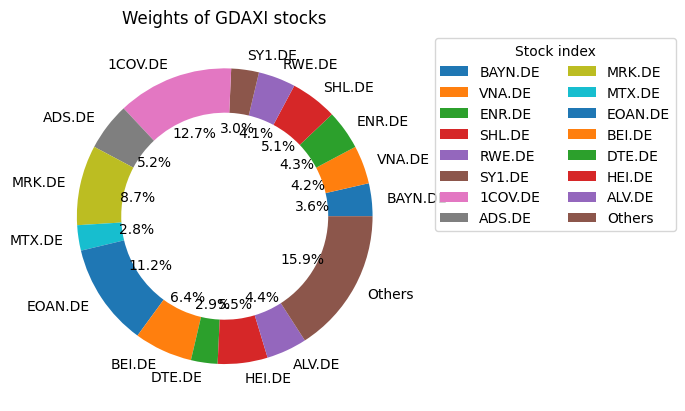

In [233]:
#Aplication of nnls algorithm and plotting the main important stocks weights
result = nnls(df_gdaxi_returns, list(df_gdaxi_index_returns['^GDAXI']))
weights = result[0]
weights_nnls=weights
factor=result[1]
weights_plotting=[abs(x) for x in weights_nnls if x>0.025]
important_labels=[stock for stock, x in zip(gdaxi_stocks, weights_plotting) if x>0.025]
peso_resto=sum([abs(x) for x in weights_nnls if x<0.025])
weights_plotting.append(peso_resto)
important_labels.append('Others')
plt.pie(weights_plotting, labels=important_labels, autopct='%1.1f%%', wedgeprops=dict(width=0.3))
plt.title('Weights of GDAXI stocks')
plt.legend(title='Stock index', bbox_to_anchor=(1.05, 1), loc='upper left', ncol=2)
plt.show()

In [234]:
df_gdaxi_nnls=pd.DataFrame(df_gdaxi_returns.mul(weights, axis=1).sum(axis=1))
df_gdaxi_nnls.rename(columns={0:'GDAXI_NNLS'}, inplace=True)
df_gdaxi_nnls['GDAXI_orig']=df_gdaxi_index_returns
df_gdaxi_nnls.head()

,GDAXI_NNLS,GDAXI_orig
Date,,
2022-01-04 00:00:00+00:00,0.010082,0.008198
2022-01-05 00:00:00+00:00,0.004249,0.007349
2022-01-06 00:00:00+00:00,-0.009740,-0.013595
2022-01-07 00:00:00+00:00,-0.003603,-0.006518
2022-01-10 00:00:00+00:00,-0.011069,-0.011317


## Comparison of several methods

### Histogram of daily returns

In [235]:
#Creation of a common dataset to compare replication results
df_gdaxi_comp=df_gdaxi_sparse
df_gdaxi_comp['GDAXI_REP_PCA']=df_gdaxi_returns_replicated[['GDAXI_REP_PCA']]
df_gdaxi_comp['GDAXI_RISKFOLIO']=df_gdaxi_rp
df_gdaxi_comp['GDAXI_NNLS']=df_gdaxi_nnls[['GDAXI_NNLS']]

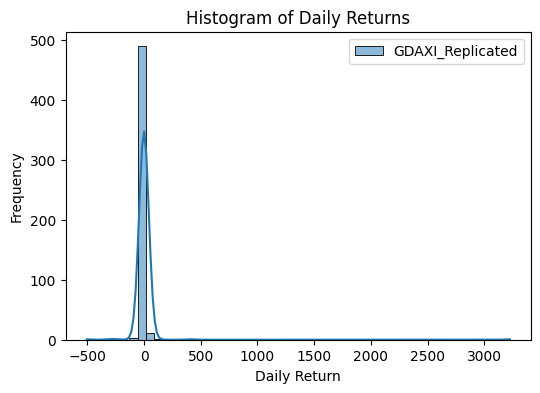

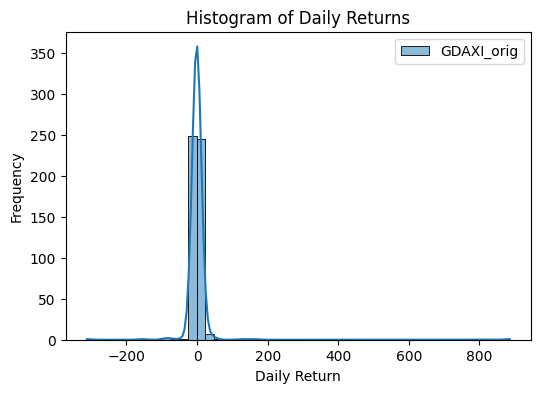

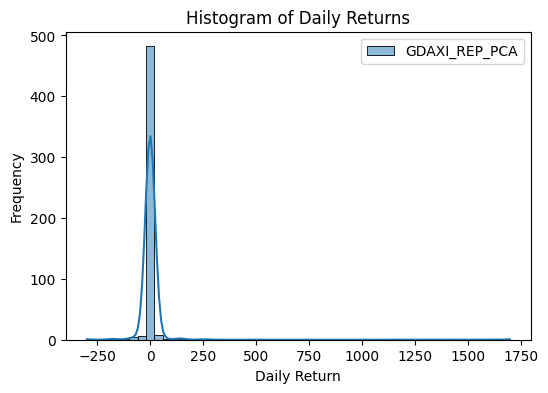

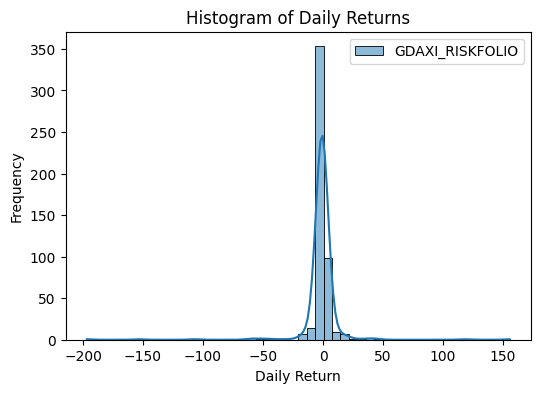

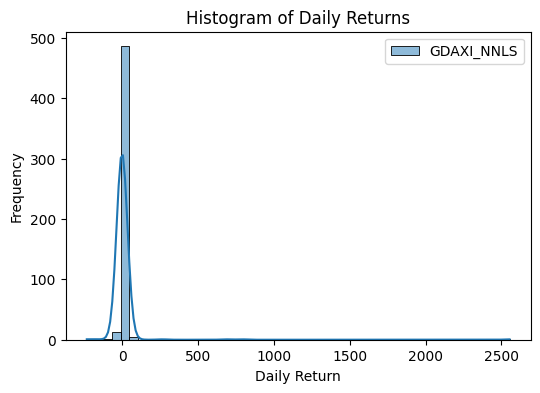

In [236]:
# Plot individual histograms for daily returns

for symbol in list(df_gdaxi_comp.columns):
    plt.figure(figsize=(6, 4))
    returns = df_gdaxi_comp[symbol].pct_change().dropna()
    sn.histplot(returns, bins=50, kde=True, label=symbol)
    plt.title('Histogram of Daily Returns')
    plt.xlabel('Daily Return')
    plt.ylabel('Frequency')
    plt.legend()
    plt.show()


### Difference of returns




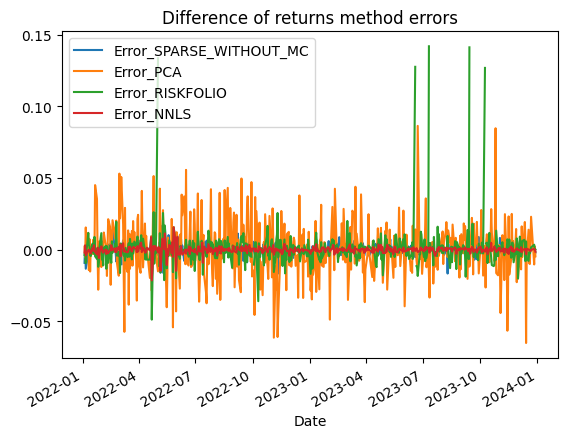

In [237]:
#Let's calculate difference between them
df_gdaxi_comp['Error_SPARSE_WITHOUT_MC']=df_gdaxi_comp['GDAXI_orig']-df_gdaxi_comp['GDAXI_Replicated']
df_gdaxi_comp['Error_PCA']=df_gdaxi_comp['GDAXI_orig']-df_gdaxi_comp['GDAXI_REP_PCA']
df_gdaxi_comp['Error_RISKFOLIO']=df_gdaxi_comp['GDAXI_orig']-df_gdaxi_comp['GDAXI_RISKFOLIO']
df_gdaxi_comp['Error_NNLS']=df_gdaxi_comp['GDAXI_orig']-df_gdaxi_comp['GDAXI_NNLS']

df_gdaxi_comp[['Error_SPARSE_WITHOUT_MC', 'Error_PCA', 'Error_RISKFOLIO', 'Error_NNLS']].plot()
plt.title("Difference of returns method errors")
plt.show();

In [238]:
df_gdaxi_comp.mean()

,0
GDAXI_Replicated,0.000168
GDAXI_orig,0.000087
GDAXI_REP_PCA,-0.000860
GDAXI_RISKFOLIO,inf
GDAXI_NNLS,0.000072
Error_SPARSE_WITHOUT_MC,-0.000081
Error_PCA,0.000948
Error_RISKFOLIO,-inf
Error_NNLS,0.000015


### Tracking errors

In [239]:
df_tracking_error=pd.DataFrame()
df_tracking_error['SPARSE_WITHOUT_MC']=(df_gdaxi_comp['GDAXI_orig']-df_gdaxi_comp['GDAXI_Replicated']).apply(lambda x: np.sqrt(abs(x)/(df_gdaxi_comp['GDAXI_orig'].shape[0]-1)))
df_tracking_error['PCA']=(df_gdaxi_comp['GDAXI_orig']-df_gdaxi_comp['GDAXI_REP_PCA']).apply(lambda x: np.sqrt(abs(x)/(df_gdaxi_comp['GDAXI_orig'].shape[0]-1)))
df_tracking_error['RISKFOLIO']=(df_gdaxi_comp['GDAXI_orig']-df_gdaxi_comp['GDAXI_RISKFOLIO']).apply(lambda x: np.sqrt(abs(x)/(df_gdaxi_comp['GDAXI_orig'].shape[0]-1)))
df_tracking_error['NNLS']=(df_gdaxi_comp['GDAXI_orig']-df_gdaxi_comp['GDAXI_NNLS']).apply(lambda x: np.sqrt(abs(x)/(df_gdaxi_comp['GDAXI_orig'].shape[0]-1)))

In [240]:
df_tracking_error.head()

,SPARSE_WITHOUT_MC,PCA,RISKFOLIO,NNLS
Date,,,,
2022-01-04 00:00:00+00:00,0.004226,0.002079,0.002646,0.001922
2022-01-05 00:00:00+00:00,0.002296,0.003189,0.001735,0.002465
2022-01-06 00:00:00+00:00,0.005089,0.005527,0.004265,0.002749
2022-01-07 00:00:00+00:00,0.004572,0.002146,0.002127,0.002391
2022-01-10 00:00:00+00:00,0.002547,0.004809,0.004803,0.000698


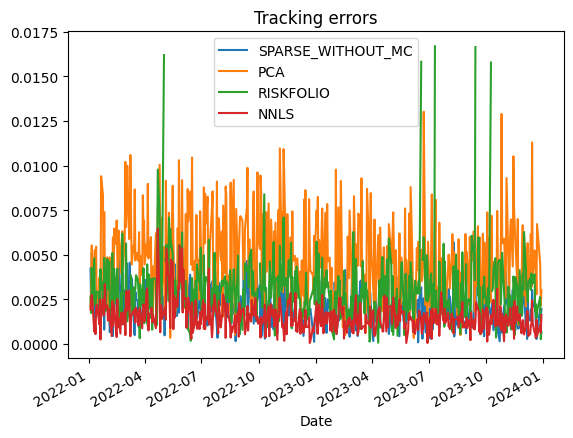

In [241]:
df_tracking_error.plot()
plt.title("Tracking errors")
plt.show();

In [242]:
df_tracking_error.mean()

,0
SPARSE_WITHOUT_MC,0.002211
PCA,0.004768
RISKFOLIO,inf
NNLS,0.001522


In [243]:
df_tracking_error.describe()

,SPARSE_WITHOUT_MC,PCA,RISKFOLIO,NNLS
count,511.000000,511.000000,511.000000,511.000000
mean,0.002211,0.004768,inf,0.001522
std,0.001109,0.002322,NaN,0.000820
min,0.000093,0.000333,0.000072,0.000055
25%,0.001412,0.002958,0.001963,0.000979
50%,0.002115,0.004533,0.002916,0.001428
75%,0.002837,0.006170,0.003797,0.001919
max,0.006283,0.013017,inf,0.006467


### Tracking differences

In [244]:
df_tracking_difference=pd.DataFrame()
df_tracking_difference['SPARSE_WITHOUT_MC']=(df_gdaxi_comp['GDAXI_orig']-df_gdaxi_comp['GDAXI_Replicated'])
df_tracking_difference['PCA']=(df_gdaxi_comp['GDAXI_orig']-df_gdaxi_comp['GDAXI_REP_PCA'])
df_tracking_difference['RISKFOLIO']=(df_gdaxi_comp['GDAXI_orig']-df_gdaxi_comp['GDAXI_RISKFOLIO'])
df_tracking_difference['NNLS']=(df_gdaxi_comp['GDAXI_orig']-df_gdaxi_comp['GDAXI_NNLS'])
print(df_tracking_difference['SPARSE_WITHOUT_MC'].mean())
print(df_tracking_difference['PCA'].mean())
print(df_tracking_difference['RISKFOLIO'].mean())
print(df_tracking_difference['NNLS'].mean())

-8.089891291869277e-05
0.0009476971283658345
-inf
1.4896252181143995e-05


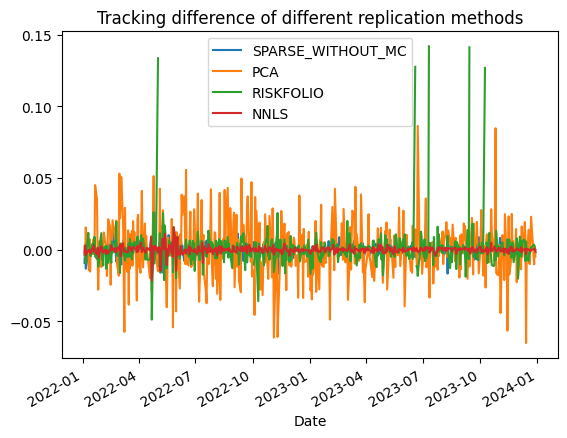

In [245]:
df_tracking_difference.plot()
plt.title("Tracking difference of different replication methods")
plt.show();

In [246]:
df_tracking_difference.mean()

,0
SPARSE_WITHOUT_MC,-0.000081
PCA,0.000948
RISKFOLIO,-inf
NNLS,0.000015


In [247]:
df_gdaxi_comp.head()

,GDAXI_Replicated,GDAXI_orig,GDAXI_REP_PCA,GDAXI_RISKFOLIO,GDAXI_NNLS,Error_SPARSE_WITHOUT_MC,Error_PCA,Error_RISKFOLIO,Error_NNLS
Date,,,,,,,,,
2022-01-04 00:00:00+00:00,0.017308,0.008198,0.005993,0.011769,0.010082,-0.009110,0.002205,-0.003571,-0.001884
2022-01-05 00:00:00+00:00,0.004660,0.007349,0.012534,0.008885,0.004249,0.002689,-0.005185,-0.001536,0.003100
2022-01-06 00:00:00+00:00,-0.000390,-0.013595,-0.029174,-0.004316,-0.009740,-0.013205,0.015579,-0.009279,-0.003855
2022-01-07 00:00:00+00:00,0.004141,-0.006518,-0.008866,-0.004212,-0.003603,-0.010659,0.002348,-0.002306,-0.002915
2022-01-10 00:00:00+00:00,-0.008009,-0.011317,-0.023113,-0.023083,-0.011069,-0.003308,0.011795,0.011766,-0.000248


### Total Performance

In [248]:
df_cummreturn=pd.DataFrame()
df_cummreturn['PCA']=(1 + df_gdaxi_comp['GDAXI_REP_PCA'].fillna(0)).cumprod() - 1
df_cummreturn['RISKFOLIO']=(1 + df_gdaxi_comp['GDAXI_RISKFOLIO'].fillna(0)).cumprod() - 1
df_cummreturn['SPARSE_WITHOUT_MC']=(1 + df_gdaxi_comp['GDAXI_Replicated'].fillna(0)).cumprod() - 1
df_cummreturn['NNLS']=(1 + df_gdaxi_comp['GDAXI_NNLS'].fillna(0)).cumprod() - 1
df_cummreturn['^GDAXI']=(1 + df_gdaxi_comp['GDAXI_orig'].fillna(0)).cumprod() - 1

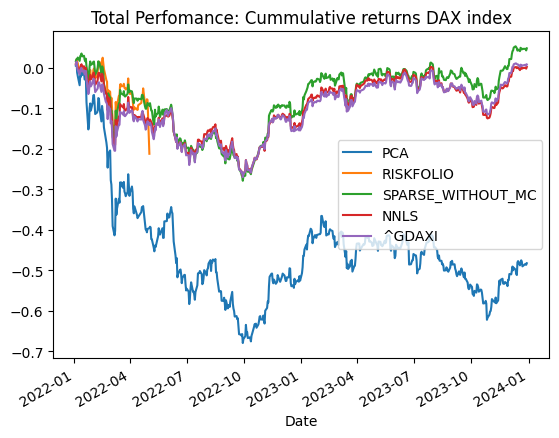

In [249]:
df_cummreturn.plot()
plt.title("Total Perfomance: Cummulative returns DAX index")
plt.show();

In [250]:
df_cummreturn.mean()

,0
PCA,-0.450922
RISKFOLIO,inf
SPARSE_WITHOUT_MC,-0.075933
NNLS,-0.095475
^GDAXI,-0.100738


### Sharpe index

Sharpe Ratios: 
Original index:  -0.4140173066237135
Replication with PCA index:  -0.20074030561178208
Replication with Riskfolio index:  nan
Replication with Sparse without MonteCarlo index:  -0.3933413196338815
Replication with NNLS index:  -0.4246691771972001


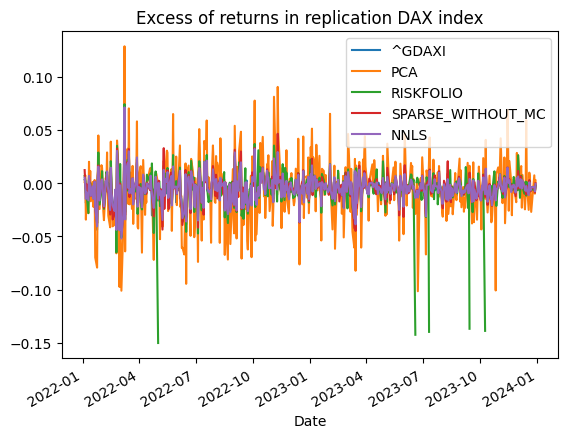

In [251]:
# Suppose risk free rate for example 0.5%
risk_free_rate=0.5/100
excess_return=pd.DataFrame()
excess_return['^GDAXI']=df_gdaxi_comp['GDAXI_orig']-risk_free_rate
excess_return['PCA']=df_gdaxi_comp['GDAXI_REP_PCA']-risk_free_rate
excess_return['RISKFOLIO']=df_gdaxi_comp['GDAXI_RISKFOLIO']-risk_free_rate
excess_return['SPARSE_WITHOUT_MC']=df_gdaxi_comp['GDAXI_Replicated']-risk_free_rate
excess_return['NNLS']=df_gdaxi_comp['GDAXI_NNLS']-risk_free_rate
sharpe_ratio_orig=np.mean(excess_return['^GDAXI'])/np.std(excess_return['^GDAXI'])
sharpe_ratio_pca=np.mean(excess_return['PCA'])/np.std(excess_return['PCA'])
sharpe_ratio_riskfolio=np.mean(excess_return['RISKFOLIO'])/np.std(excess_return['RISKFOLIO'])
sharpe_ratio_sparse_without_mc=np.mean(excess_return['SPARSE_WITHOUT_MC'])/np.std(excess_return['SPARSE_WITHOUT_MC'])
sharpe_ratio_nnls=np.mean(excess_return['NNLS'])/np.std(excess_return['NNLS'])
print('Sharpe Ratios: ')
print('Original index: ', sharpe_ratio_orig)
print('Replication with PCA index: ', sharpe_ratio_pca)
print('Replication with Riskfolio index: ', sharpe_ratio_riskfolio)
print('Replication with Sparse without MonteCarlo index: ', sharpe_ratio_sparse_without_mc)
print('Replication with NNLS index: ', sharpe_ratio_nnls)
excess_return.plot()
plt.title("Excess of returns in replication DAX index")
plt.show();


### Comparison of prices: Costs




In [252]:
df_prices=pd.DataFrame()
df_prices['SPARSE_WITHOUT_MC']=pd.DataFrame(df_gdaxi.mul(weights_sparse_withoutMC, axis=1).sum(axis=1))
df_prices['PCA']=pd.DataFrame(df_gdaxi.mul(weights_pca, axis=1).sum(axis=1))
df_prices['RISKFOLIO']=pd.DataFrame(df_gdaxi.mul(weights_riskfolio, axis=1).sum(axis=1))
df_prices['NNLS']=pd.DataFrame(df_gdaxi.mul(weights_nnls, axis=1).sum(axis=1))
df_prices['^GDAXI']=df_gdaxi_index

df_prices.head()


,SPARSE_WITHOUT_MC,PCA,RISKFOLIO,NNLS,^GDAXI
Date,,,,,
2022-01-03 00:00:00+00:00,143.338113,140.594793,76.891377,101.824880,16020.730469
2022-01-04 00:00:00+00:00,146.475761,141.015964,78.049046,103.109967,16152.610352
2022-01-05 00:00:00+00:00,147.082705,142.112409,78.818201,103.615502,16271.750000
2022-01-06 00:00:00+00:00,147.777508,139.417919,78.614439,102.655898,16052.030273
2022-01-07 00:00:00+00:00,148.677004,138.228889,78.307174,102.324085,15947.740234


In [253]:
df_prices.describe()

,SPARSE_WITHOUT_MC,PCA,RISKFOLIO,NNLS,^GDAXI
count,512.000000,512.000000,512.000000,512.000000,512.000000
mean,142.646097,111.654531,74.010958,96.738595,14769.332859
std,13.792314,11.125158,7.066061,8.361799,1180.976035
min,110.546905,83.629352,56.292352,77.660626,11975.549805
25%,133.743905,103.776324,69.211534,89.601620,13913.082764
50%,147.130695,113.530472,75.099000,99.546572,15094.010254
75%,152.835015,118.002580,80.037903,103.557548,15789.732666
max,169.884256,142.112409,87.036162,111.520132,16794.429688


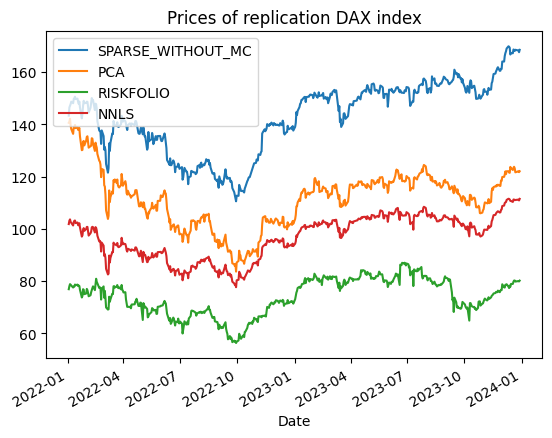

In [254]:
df_prices[['SPARSE_WITHOUT_MC', 'PCA', 'RISKFOLIO', 'NNLS']].plot()
plt.title("Prices of replication DAX index")
plt.show();

In [255]:
df_prices.mean()

,0
SPARSE_WITHOUT_MC,142.646097
PCA,111.654531
RISKFOLIO,74.010958
NNLS,96.738595
^GDAXI,14769.332859


### Liquidity

In [256]:
def extract_liq(tickers, start_date, end_date):
  #Function to calculate the volumen of transactions and therefore gives an estimation of liquidity for each stock
  #Inputs:
  # 1. tickers -> List of tickers of stocks in the index
  # 2. start_date-> First date considered for the replication index
  # 3. end_date -> Last date considered for the replication index
  #Outputs:
  # 1. df_all -> dataframe where each column is the volume of transaction for that date for each stock
  df_all=pd.DataFrame()
  df_returns_all=pd.DataFrame()
  lista_df=[]
  for ticker in tickers:
    df=yf.download(ticker, start=start_date, end=end_date)
    df=df[['Adj Close', 'Volume']]
    df_all[f'{ticker}']=df['Volume']
  return df_all

In [257]:
gdaxi_stocks=['BAYN.DE', 'VNA.DE', 'ENR.DE', 'SHL.DE', 'RWE.DE', 'SY1.DE', '1COV.DE', 'ADS.DE', 'MRK.DE', 'MTX.DE', 'EOAN.DE', 'BEI.DE', 'DTE.DE', 'HEI.DE', 'ALV.DE', 'P911.DE', 'DB1.DE', 'DHL.DE', 'ZAL.DE', 'FRE.DE', 'DBK.DE', 'HNR1.DE', 'DTG.DE', 'SIE.DE', 'AIR.DE', 'BMW.DE', 'BAS.DE', 'VOW3.DE', 'CON.DE', 'IFX.DE']
df_volumen=extract_liq(gdaxi_stocks, start_date, end_date)
df_volumen_index=yf.download('^GDAXI', start=start_date, end=end_date)['Volume']
df_liq=pd.DataFrame()
df_liq['SPARSE_WITHOUT_MC']=pd.DataFrame(df_volumen.mul(weights_sparse_withoutMC, axis=1).sum(axis=1))
df_liq['PCA']=pd.DataFrame(df_volumen.mul(weights_pca, axis=1).sum(axis=1))
df_liq['RISKFOLIO']=pd.DataFrame(df_volumen.mul(weights_riskfolio, axis=1).sum(axis=1))
df_liq['NNLS']=pd.DataFrame(df_volumen.mul(weights_nnls, axis=1).sum(axis=1))
df_liq['^GDAXI']=df_volumen_index
df_liq.head()

[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%********

,SPARSE_WITHOUT_MC,PCA,RISKFOLIO,NNLS,^GDAXI
Date,,,,,
2022-01-03 00:00:00+00:00,1.056708e+06,2.910383e+06,2.896332e+06,1.565200e+06,56865800
2022-01-04 00:00:00+00:00,1.455239e+06,3.850395e+06,2.969512e+06,1.837276e+06,75187400
2022-01-05 00:00:00+00:00,1.048187e+06,3.264119e+06,3.024373e+06,1.712678e+06,68244500
2022-01-06 00:00:00+00:00,1.674198e+06,3.971605e+06,3.012850e+06,1.990340e+06,75756700
2022-01-07 00:00:00+00:00,1.514317e+06,3.747416e+06,4.032588e+06,2.073343e+06,74469300


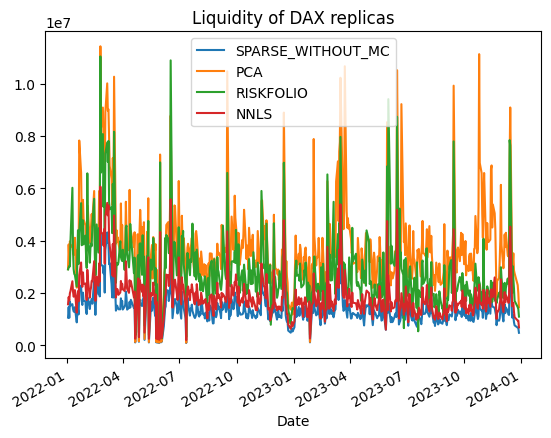

In [258]:
df_liq[['SPARSE_WITHOUT_MC', 'PCA', 'RISKFOLIO', 'NNLS']].plot()
plt.title("Liquidity of DAX replicas")
plt.show();

In [259]:
df_liq.mean()

,0
SPARSE_WITHOUT_MC,1.398870e+06
PCA,3.866232e+06
RISKFOLIO,2.900009e+06
NNLS,1.869582e+06
^GDAXI,7.416185e+07


# IBEX 35 (SPAIN)

Let's apply the same method to different indexes: in this case IBEX 35

[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%********

<Figure size 10000x1000 with 0 Axes>

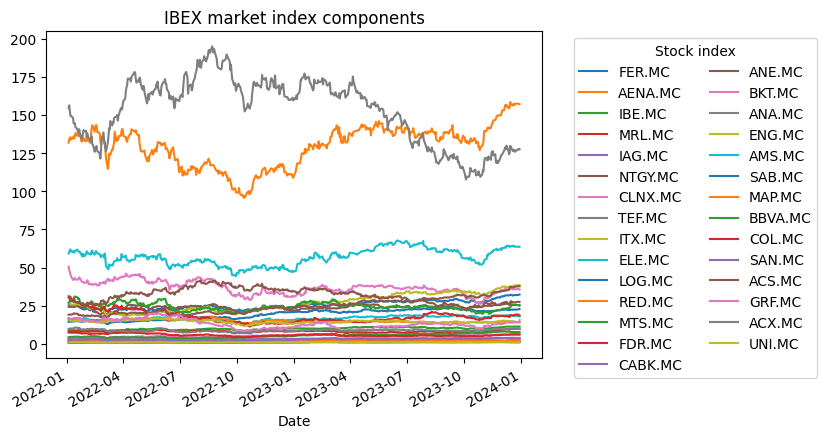

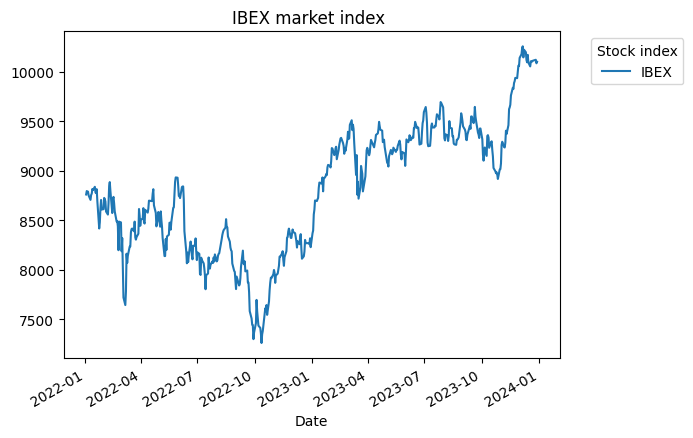

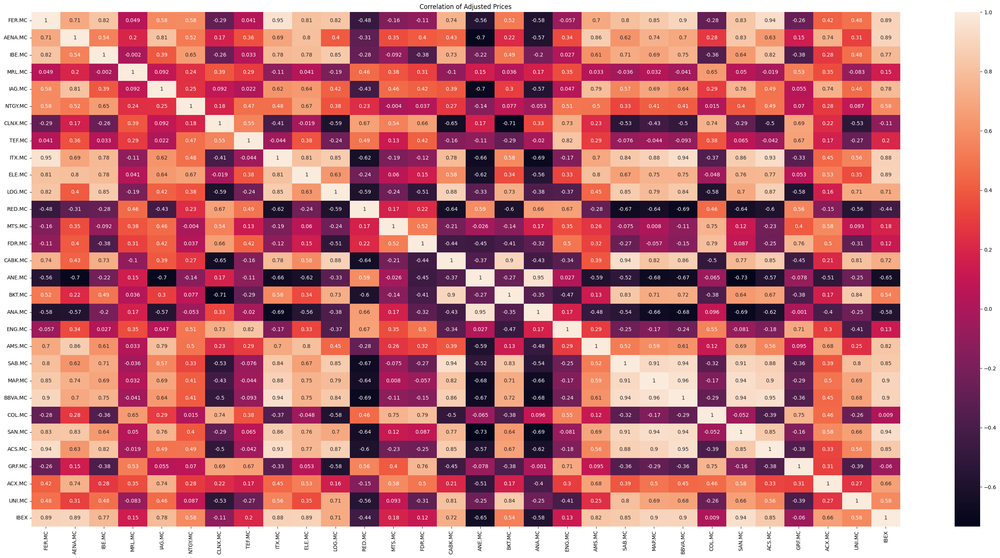

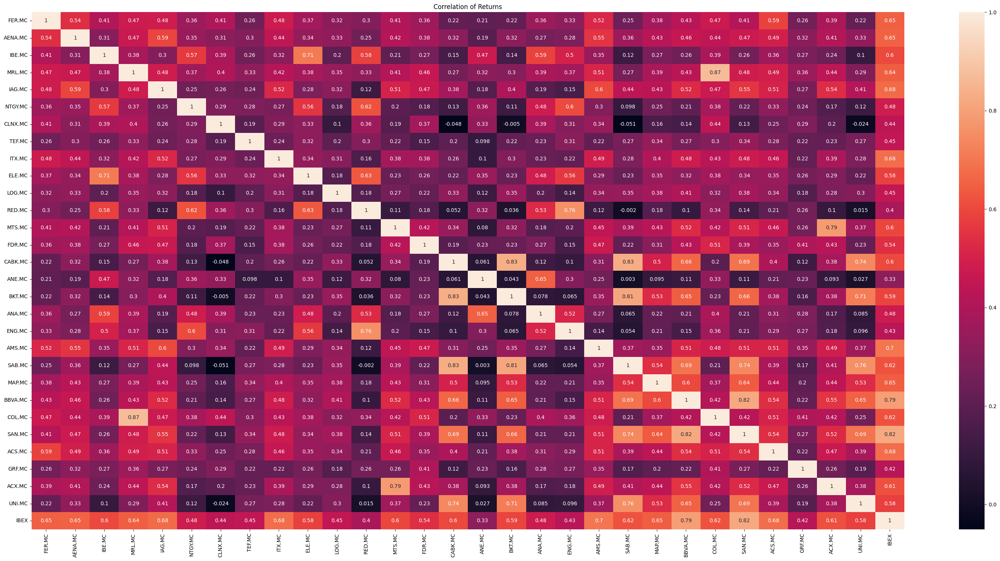

[*********************100%***********************]  30 of 30 completed


In [260]:
ibex_stocks=['FER.MC' , 'AENA.MC' , 'IBE.MC' , 'MRL.MC' , 'IAG.MC' , 'NTGY.MC' , 'CLNX.MC' , 'TEF.MC' , 'ITX.MC' , 'ELE.MC' , 'LOG.MC' , 'RED.MC' , 'MTS.MC' , 'FDR.MC' , 'CABK.MC' , 'ANE.MC' , 'BKT.MC' , 'ANA.MC' , 'ENG.MC' , 'AMS.MC' , 'SAB.MC' , 'MAP.MC' , 'BBVA.MC' , 'COL.MC' , 'SAN.MC' , 'ACS.MC' , 'GRF.MC' , 'ACX.MC' , 'UNI.MC' ] #, 'PUIG.MC' was included in 2024
df_ibex, df_ibex_returns= get_correlations('IBEX', 'EU', ibex_stocks, start_date, end_date)
w, frontier, port=get_data_rp(ibex_stocks, '^IBEX', "2021-01-01", "2023-12-31")

## Replication methods

### 1st Method: Riskfolio-Lib

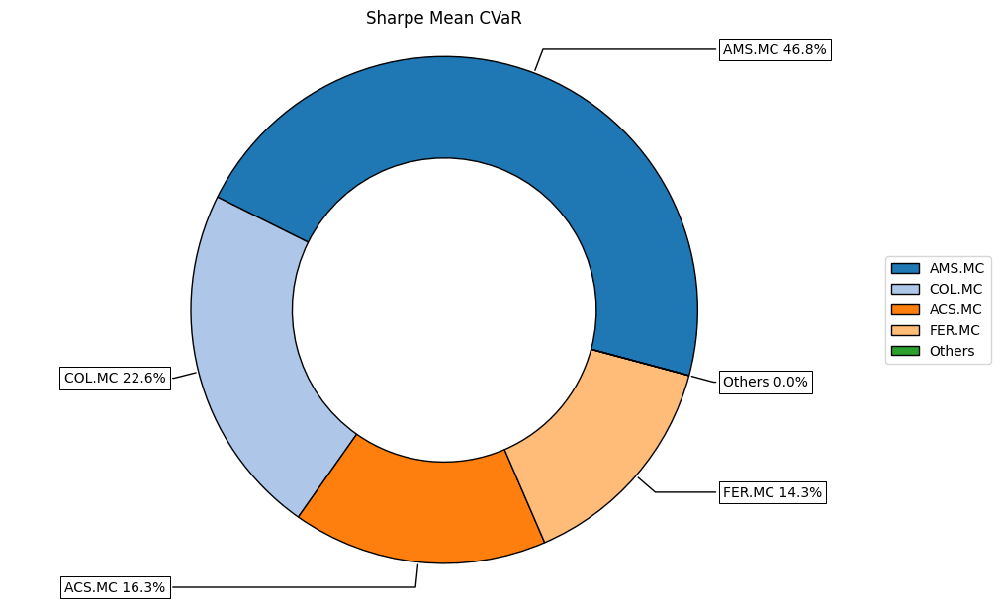

In [261]:
g2=rp.plot_pie(w=w,title="Sharpe Mean CVaR",others=0.05,nrow=25,cmap="tab20",height=6,width=10);


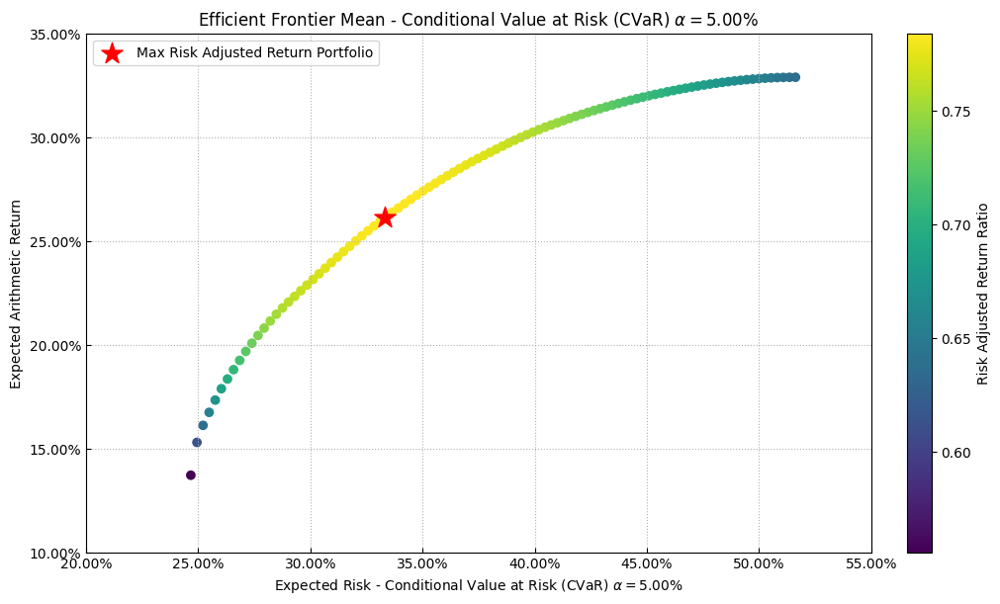

In [262]:
g1 = rp.plot_frontier(w_frontier=frontier,mu=port.mu,cov=port.cov,returns=port.returns,rm="CVaR",rf=0,cmap="viridis",w=w,label="Max Risk Adjusted Return Portfolio",marker="*")


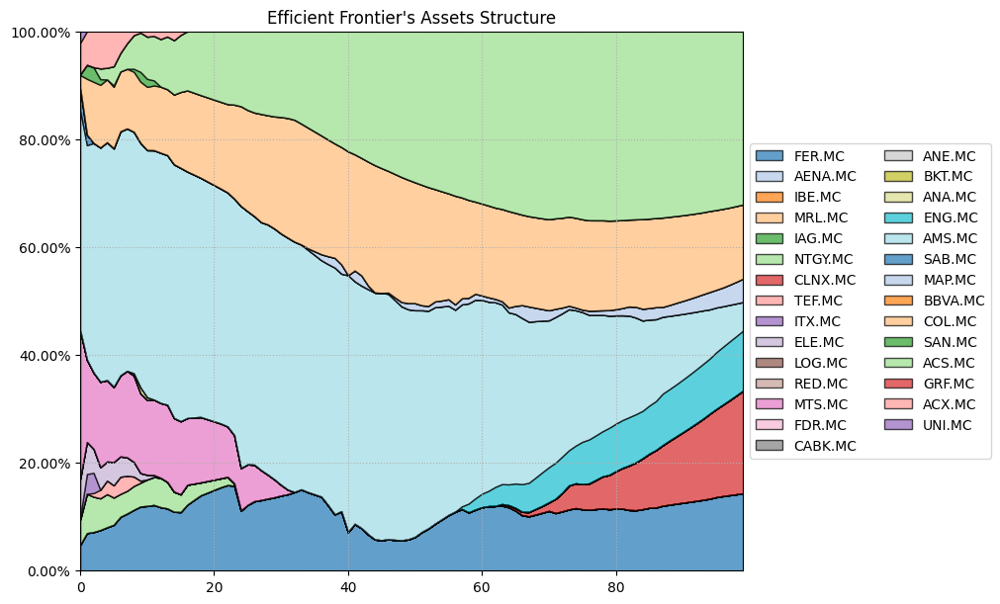

In [263]:
g3 = rp.plot_frontier_area(w_frontier=frontier, cmap="tab20", height=6, width=10, ax=None)

In [264]:
df_ibex_rp=pd.DataFrame(df_ibex_returns.iloc[:, :-1].mul(list(w['weights']), axis=1).sum(axis=1))
df_ibex_rp.rename(columns={0:'IBEX_Replicated_Riskfolio'}, inplace=True)
weights_riskfolio=list(w['weights'])
df_ibex_rp.head()

,IBEX_Replicated_Riskfolio
Date,
2022-01-04 00:00:00+00:00,0.009874
2022-01-05 00:00:00+00:00,0.011142
2022-01-06 00:00:00+00:00,0.001881
2022-01-07 00:00:00+00:00,-0.018355
2022-01-10 00:00:00+00:00,0.002639


### 2nd Method: Give weights with Principal Component Analysis

[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%********

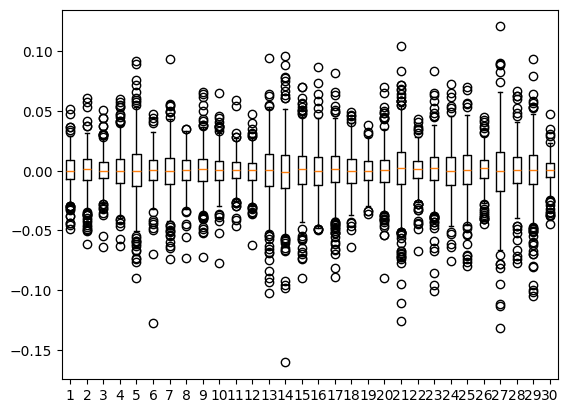

In [265]:
ibex_stocks=['FER.MC' , 'AENA.MC' , 'IBE.MC' , 'MRL.MC' , 'IAG.MC' , 'NTGY.MC' , 'CLNX.MC' , 'TEF.MC' , 'ITX.MC' , 'ELE.MC' , 'LOG.MC' , 'RED.MC' , 'MTS.MC' , 'FDR.MC' , 'CABK.MC' , 'ANE.MC' , 'BKT.MC' , 'ANA.MC' , 'ENG.MC' , 'AMS.MC' , 'SAB.MC' , 'MAP.MC' , 'BBVA.MC' , 'COL.MC' , 'SAN.MC' , 'ACS.MC' , 'GRF.MC' , 'ACX.MC' , 'UNI.MC', '^IBEX' ] #, 'PUIG.MC' was included in 2024
num_stocks=len(ibex_stocks)
lista_df, df_ibex, df_ibex_returns=extract_data(ibex_stocks, start_date, end_date )
df_ibex_returns=df_ibex_returns.iloc[1:, :]
df_ibex_returns.fillna(0, inplace=True)
plt.boxplot(df_ibex_returns)
plt.show()

In [266]:
pesos

array([ 0.04320659,  0.10164029,  0.18296982,  0.06352297,  0.03535347,
        0.03094058,  0.08219363,  0.13261129,  0.02354255, -0.00305484,
        0.02720486,  0.02775781,  0.00355739,  0.05637788,  0.03521358,
        0.03724167,  0.01262688,  0.04199569,  0.2017871 ,  0.04941766,
        0.0784336 , -0.00272162,  0.0590551 ,  0.05500828,  0.03098003,
        0.06934705,  0.07055109,  0.08445458,  0.13300421,  0.08022242])

In [267]:
scaler=StandardScaler()
df_ibex_returns.iloc[:, :-1]=df_ibex_returns.iloc[:, :-1].replace(np.inf, np.nan)
df_ibex_returns.iloc[:, :-1]=df_ibex_returns.iloc[:, :-1].replace(-np.inf, np.nan)
df_ibex_returns.iloc[:, :-1]=df_ibex_returns.iloc[:, :-1].fillna(0)
pca = PCA(random_state=42)
pca.fit(df_ibex_returns.iloc[:, :-1])

# Calcular la varianza explicada y los pesos
variance = pca.explained_variance_ratio_
pesos = pca.components_.T @ variance
weights_pca=pesos
df_ibex_returns_replicated=df_ibex_returns.copy()
for i in range(len(pesos)):
  df_ibex_returns_replicated.iloc[:, i]=df_ibex_returns_replicated.iloc[:, i]*pesos[i]
df_ibex_returns_replicated['IBEX_REP_PCA']=df_ibex_returns_replicated.iloc[:,:-1].sum(axis=1)
df_ibex_returns_replicated=df_ibex_returns_replicated[['IBEX_REP_PCA', '^IBEX']]
df_ibex_returns_replicated.head()

,IBEX_REP_PCA,^IBEX
Date,,
2022-01-04 00:00:00+00:00,0.032605,0.003941
2022-01-05 00:00:00+00:00,0.010393,-0.000569
2022-01-06 00:00:00+00:00,0.025906,-0.000102
2022-01-07 00:00:00+00:00,0.006586,-0.004344
2022-01-10 00:00:00+00:00,-0.000518,-0.005144


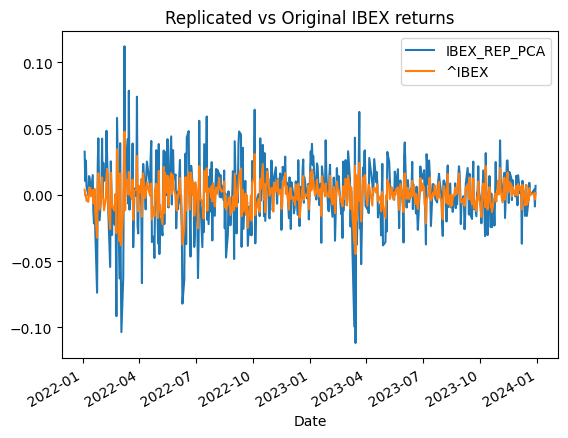

In [268]:
df_ibex_returns_replicated.plot()
plt.title("Replicated vs Original IBEX returns")
plt.show();

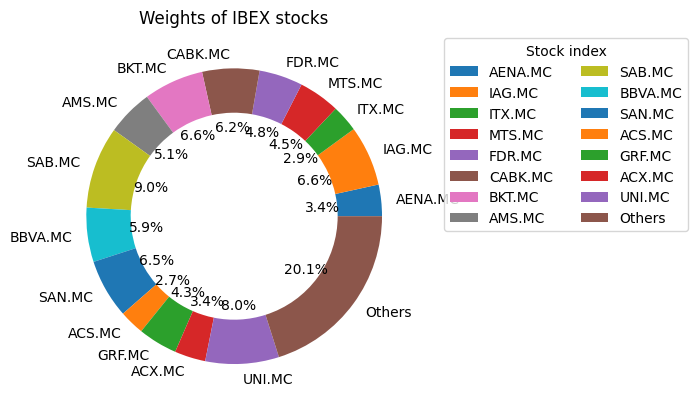

In [269]:
important_pesos=[abs(x) for x in pesos if x>0.05]
important_labels=[stock for stock, x in zip(ibex_stocks, pesos) if x>0.05]
peso_resto=sum([abs(x) for x in pesos if x<0.05])
important_pesos.append(peso_resto)
important_labels.append('Others')
plt.pie(important_pesos, labels=important_labels, autopct='%1.1f%%', wedgeprops=dict(width=0.3))
plt.title('Weights of IBEX stocks')
plt.legend(title='Stock index', bbox_to_anchor=(1.05, 1), loc='upper left', ncol=2)
plt.show()

### 3rd Method: Sparse Method without MonteCarlo

In [270]:
ibex_stocks=['FER.MC' , 'AENA.MC' , 'IBE.MC' , 'MRL.MC' , 'IAG.MC' , 'NTGY.MC' , 'CLNX.MC' , 'TEF.MC' , 'ITX.MC' , 'ELE.MC' , 'LOG.MC' , 'RED.MC' , 'MTS.MC' , 'FDR.MC' , 'CABK.MC' , 'ANE.MC' , 'BKT.MC' , 'ANA.MC' , 'ENG.MC' , 'AMS.MC' , 'SAB.MC' , 'MAP.MC' , 'BBVA.MC' , 'COL.MC' , 'SAN.MC' , 'ACS.MC' , 'GRF.MC' , 'ACX.MC' , 'UNI.MC' ] #, 'PUIG.MC' was included in 2024
num_stocks=len(ibex_stocks)
lista_df, df_ibex, df_ibex_returns=extract_data(ibex_stocks, start_date, end_date )
lista_df_index, df_ibex_index, df_ibex_index_returns=extract_data(['^IBEX'], start_date, end_date )
df_ibex_index_returns=df_ibex_index_returns[1:]
df_ibex_index_returns.fillna(0, inplace=True)
df_ibex_returns=df_ibex_returns[1:]
df_ibex_returns.fillna(0, inplace=True)
index_returns=df_ibex.sum(axis=1)
index_returns=np.log(index_returns / index_returns.shift(1))
index_returns.dropna(inplace=True)
threshold= 1e-7
r=0.01
opt_value, opt_w, t, tracking_error= sparse_tracking(num_stocks, df_ibex_returns, df_ibex_index_returns['^IBEX'],  np.inf, threshold, r)
stocks_considered=np.array(ibex_stocks)[opt_w > threshold]
print('Found ', len(stocks_considered), ' stocks with weight bigger than threshold: ', stocks_considered)
weights_sparse_withoutMC=opt_w
print("Optimal weights: " ,opt_w)
print("Tracking error: ", (tracking_error)**0.5 )
print("Optimal Solution ", opt_value)

[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%********

Solution found at step 28
Found  21  stocks with weight bigger than threshold:  ['FER.MC' 'AENA.MC' 'IBE.MC' 'MRL.MC' 'IAG.MC' 'CLNX.MC' 'TEF.MC' 'ITX.MC'
 'MTS.MC' 'FDR.MC' 'CABK.MC' 'BKT.MC' 'AMS.MC' 'SAB.MC' 'BBVA.MC' 'COL.MC'
 'SAN.MC' 'ACS.MC' 'GRF.MC' 'ACX.MC' 'UNI.MC']
Optimal weights:  [1.94109367e-07 3.70542578e-02 5.08415905e-01 4.91894345e-07
 7.44717888e-03 8.29853981e-09 1.64242047e-02 3.83097690e-03
 8.23817188e-02 5.10359191e-09 5.66613997e-08 8.94009204e-09
 3.54410129e-02 1.07491238e-02 6.92823988e-03 6.85030994e-09
 4.42503351e-03 7.71329652e-09 1.29454678e-08 2.98516539e-02
 3.88341562e-02 6.33764072e-08 6.98952916e-02 3.24265112e-07
 1.25333645e-01 1.07287054e-07 4.93269827e-03 2.51644260e-07
 1.80533637e-02]
Tracking error:  0.08233917905986035
Optimal Solution  0.02644867714181222


In [271]:
df_ibex_sparse=pd.DataFrame(df_ibex_returns.mul(opt_w, axis=1).sum(axis=1))
df_ibex_sparse.rename(columns={0:'IBEX_Replicated'}, inplace=True)
df_ibex_sparse['IBEX_orig']=df_ibex_index_returns
df_ibex_sparse.head()

,IBEX_Replicated,IBEX_orig
Date,,
2022-01-04 00:00:00+00:00,0.004647,0.003941
2022-01-05 00:00:00+00:00,-0.001376,-0.000569
2022-01-06 00:00:00+00:00,0.000563,-0.000102
2022-01-07 00:00:00+00:00,0.002036,-0.004344
2022-01-10 00:00:00+00:00,-0.004577,-0.005144


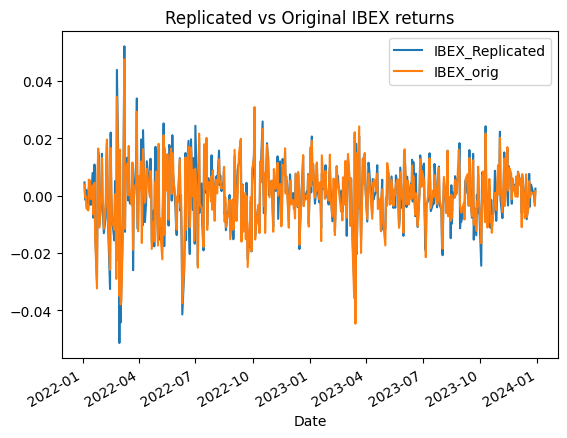

In [272]:
df_ibex_sparse.plot()
plt.title("Replicated vs Original IBEX returns")
plt.show();

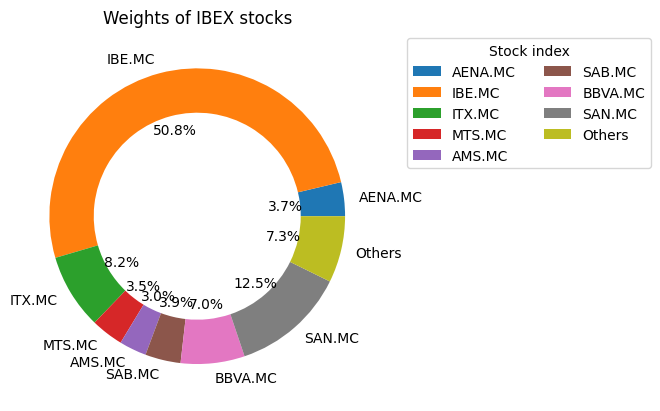

In [273]:
important_pesos=[abs(x) for x in opt_w if x>0.025]
important_labels=[stock for stock, x in zip(ibex_stocks, opt_w) if x>0.025]
peso_resto=sum([abs(x) for x in opt_w if x<0.025])
important_pesos.append(peso_resto)
important_labels.append('Others')
plt.pie(important_pesos, labels=important_labels, autopct='%1.1f%%', wedgeprops=dict(width=0.3))
plt.title('Weights of IBEX stocks')
plt.legend(title='Stock index', bbox_to_anchor=(1.05, 1), loc='upper left', ncol=2)
plt.show()

### 4th Method: Allocation using Non-Negative Least Squares (NNLS) Optimization



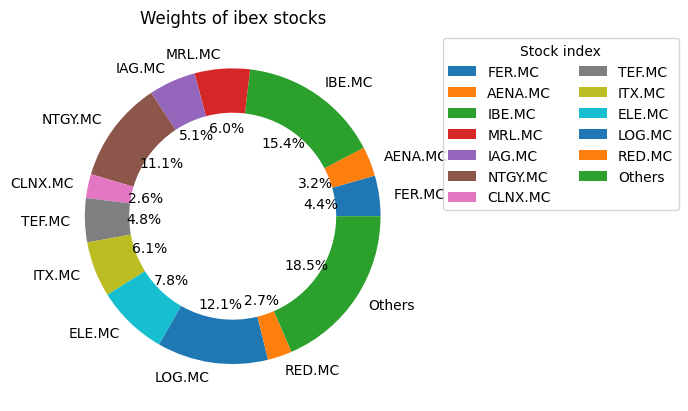

In [274]:
df_ibex.fillna(0, inplace=True)
result = nnls(df_ibex_returns, list(df_ibex_index_returns['^IBEX']))
weights = result[0]
weights_nnls=weights
factor=result[1]
weights_plotting=[abs(x) for x in weights_nnls if x>0.025]
important_labels=[stock for stock, x in zip(ibex_stocks, weights_plotting) if x>0.025]
peso_resto=sum([abs(x) for x in weights_nnls if x<0.025])
weights_plotting.append(peso_resto)
important_labels.append('Others')
plt.pie(weights_plotting, labels=important_labels, autopct='%1.1f%%', wedgeprops=dict(width=0.3))
plt.title('Weights of ibex stocks')
plt.legend(title='Stock index', bbox_to_anchor=(1.05, 1), loc='upper left', ncol=2)
plt.show()

In [275]:
df_ibex_nnls=pd.DataFrame(df_ibex_returns.mul(weights, axis=1).sum(axis=1))
df_ibex_nnls.rename(columns={0:'IBEX_NNLS'}, inplace=True)
df_ibex_nnls['IBEX_orig']=df_ibex_index_returns
df_ibex_nnls.head()

,IBEX_NNLS,IBEX_orig
Date,,
2022-01-04 00:00:00+00:00,0.003944,0.003941
2022-01-05 00:00:00+00:00,-0.001091,-0.000569
2022-01-06 00:00:00+00:00,0.001320,-0.000102
2022-01-07 00:00:00+00:00,-0.001632,-0.004344
2022-01-10 00:00:00+00:00,-0.001594,-0.005144


## Comparison of several methods

### Histogram of daily returns

In [276]:
df_ibex_comp=df_ibex_sparse
df_ibex_comp['IBEX_REP_PCA']=df_ibex_returns_replicated[['IBEX_REP_PCA']]
df_ibex_comp['IBEX_RISKFOLIO']=df_ibex_rp
df_ibex_comp['IBEX_NNLS']=df_ibex_nnls[['IBEX_NNLS']]

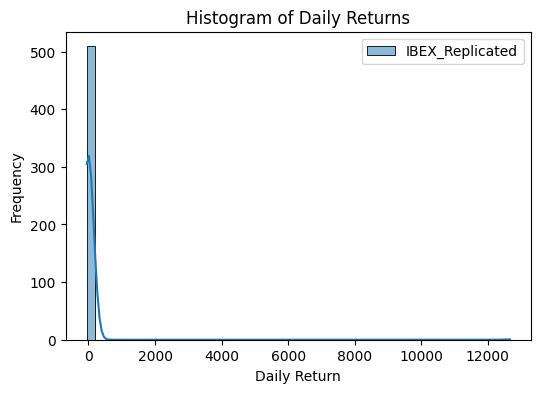

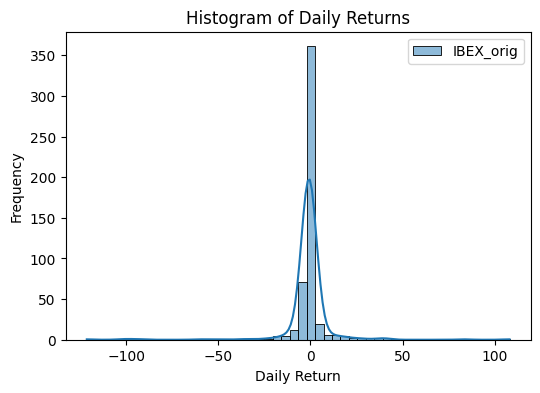

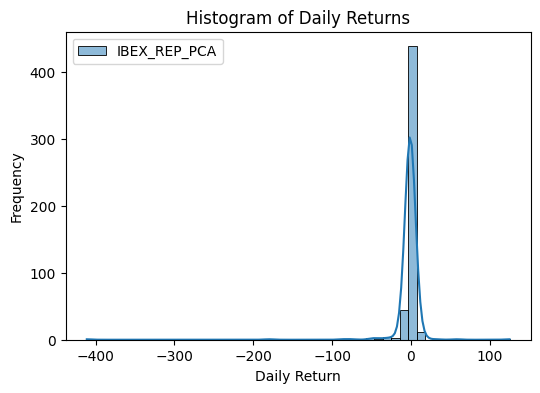

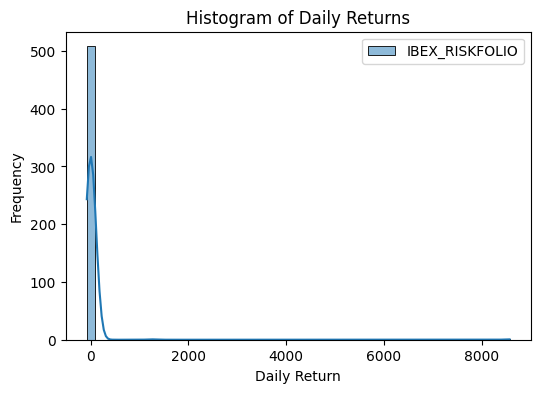

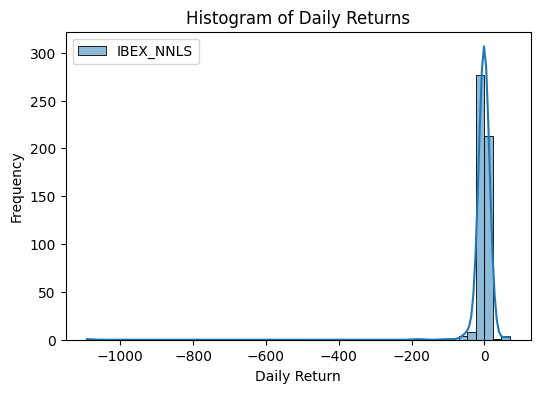

In [277]:
# Plot individual histograms for daily returns

for symbol in list(df_ibex_comp.columns):
    plt.figure(figsize=(6, 4))
    returns = df_ibex_comp[symbol].pct_change().dropna()
    sn.histplot(returns, bins=50, kde=True, label=symbol)
    plt.title('Histogram of Daily Returns')
    plt.xlabel('Daily Return')
    plt.ylabel('Frequency')
    plt.legend()
    plt.show()

### Difference of returns


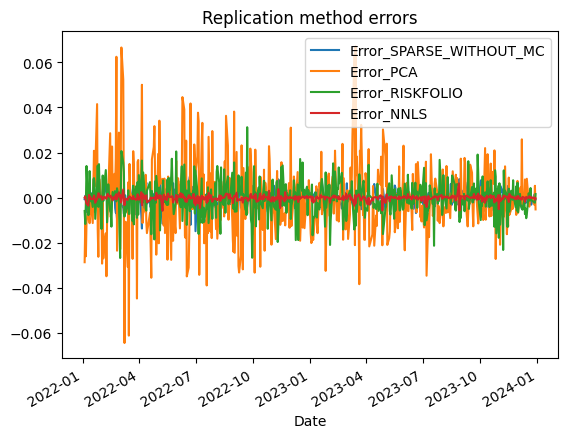

In [278]:
#Let's calculate difference between them
df_ibex_comp['Error_SPARSE_WITHOUT_MC']=df_ibex_comp['IBEX_orig']-df_ibex_comp['IBEX_Replicated']
df_ibex_comp['Error_PCA']=df_ibex_comp['IBEX_orig']-df_ibex_comp['IBEX_REP_PCA']
df_ibex_comp['Error_RISKFOLIO']=df_ibex_comp['IBEX_orig']-df_ibex_comp['IBEX_RISKFOLIO']
df_ibex_comp['Error_NNLS']=df_ibex_comp['IBEX_orig']-df_ibex_comp['IBEX_NNLS']

df_ibex_comp[['Error_SPARSE_WITHOUT_MC', 'Error_PCA', 'Error_RISKFOLIO', 'Error_NNLS']].plot()
plt.title("Replication method errors")
plt.show();

In [279]:
df_ibex_comp.mean()

,0
IBEX_Replicated,0.000495
IBEX_orig,0.000279
IBEX_REP_PCA,0.000799
IBEX_RISKFOLIO,0.000416
IBEX_NNLS,0.000410
Error_SPARSE_WITHOUT_MC,-0.000216
Error_PCA,-0.000521
Error_RISKFOLIO,-0.000137
Error_NNLS,-0.000131


### Tracking errors

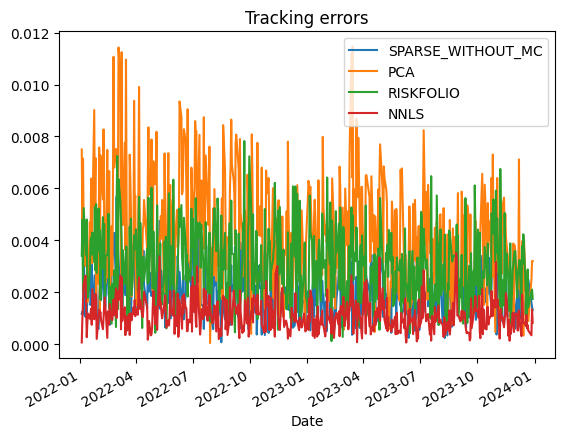

In [280]:
df_tracking_error=pd.DataFrame()
df_tracking_error['SPARSE_WITHOUT_MC']=(df_ibex_comp['IBEX_orig']-df_ibex_comp['IBEX_Replicated']).apply(lambda x: np.sqrt(abs(x)/(df_ibex_comp['IBEX_orig'].shape[0]-1)))
df_tracking_error['PCA']=(df_ibex_comp['IBEX_orig']-df_ibex_comp['IBEX_REP_PCA']).apply(lambda x: np.sqrt(abs(x)/(df_ibex_comp['IBEX_orig'].shape[0]-1)))
df_tracking_error['RISKFOLIO']=(df_ibex_comp['IBEX_orig']-df_ibex_comp['IBEX_RISKFOLIO']).apply(lambda x: np.sqrt(abs(x)/(df_ibex_comp['IBEX_orig'].shape[0]-1)))
df_tracking_error['NNLS']=(df_ibex_comp['IBEX_orig']-df_ibex_comp['IBEX_NNLS']).apply(lambda x: np.sqrt(abs(x)/(df_ibex_comp['IBEX_orig'].shape[0]-1)))
df_tracking_error.plot()
plt.title("Tracking errors")
plt.show();

In [281]:
df_tracking_error.mean()

,0
SPARSE_WITHOUT_MC,0.002081
PCA,0.004372
RISKFOLIO,0.003092
NNLS,0.001114


### Tracking differences

-0.00021588308039670944
-0.0005206796669947149
-0.00013737887246029556
-0.00013090061636396175


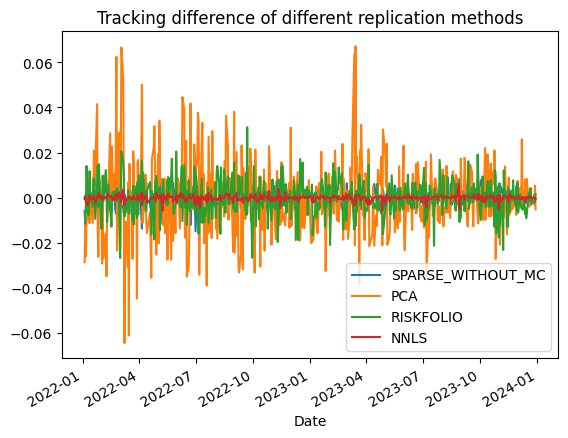

In [282]:
df_tracking_difference=pd.DataFrame()
df_tracking_difference['SPARSE_WITHOUT_MC']=(df_ibex_comp['IBEX_orig']-df_ibex_comp['IBEX_Replicated'])
df_tracking_difference['PCA']=(df_ibex_comp['IBEX_orig']-df_ibex_comp['IBEX_REP_PCA'])
df_tracking_difference['RISKFOLIO']=(df_ibex_comp['IBEX_orig']-df_ibex_comp['IBEX_RISKFOLIO'])
df_tracking_difference['NNLS']=(df_ibex_comp['IBEX_orig']-df_ibex_comp['IBEX_NNLS'])
print(df_tracking_difference['SPARSE_WITHOUT_MC'].mean())
print(df_tracking_difference['PCA'].mean())
print(df_tracking_difference['RISKFOLIO'].mean())
print(df_tracking_difference['NNLS'].mean())
df_tracking_difference.plot()
plt.title("Tracking difference of different replication methods")
plt.show();

In [283]:
df_tracking_difference.mean()

,0
SPARSE_WITHOUT_MC,-0.000216
PCA,-0.000521
RISKFOLIO,-0.000137
NNLS,-0.000131


### Total Performance

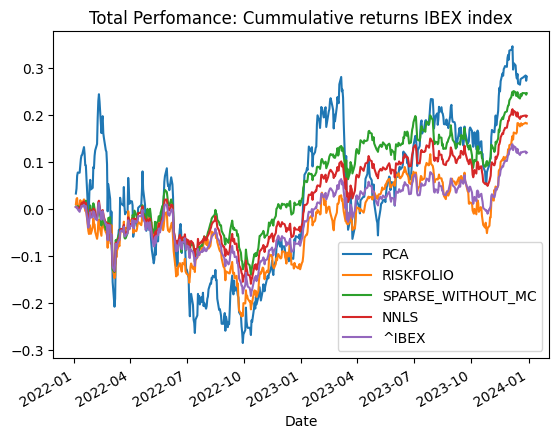

In [284]:
df_cummreturn=pd.DataFrame()
df_cummreturn['PCA']=(1 + df_ibex_comp['IBEX_REP_PCA'].fillna(0)).cumprod() - 1
df_cummreturn['RISKFOLIO']=(1 + df_ibex_comp['IBEX_RISKFOLIO'].fillna(0)).cumprod() - 1
df_cummreturn['SPARSE_WITHOUT_MC']=(1 + df_ibex_comp['IBEX_Replicated'].fillna(0)).cumprod() - 1
df_cummreturn['NNLS']=(1 + df_ibex_comp['IBEX_NNLS'].fillna(0)).cumprod() - 1
df_cummreturn['^IBEX']=(1 + df_ibex_comp['IBEX_orig'].fillna(0)).cumprod() - 1
df_cummreturn.plot()
plt.title("Total Perfomance: Cummulative returns IBEX index")
plt.show();

In [285]:
df_cummreturn.mean()

,0
PCA,0.031265
RISKFOLIO,-0.023973
SPARSE_WITHOUT_MC,0.050160
NNLS,0.022541
^IBEX,-0.013985


### Sharpe index

Sharpe Ratios: 
Original index:  -0.4427949773400491
Replication with PCA index:  -0.16828268253548012
Replication with Riskfolio index:  -0.3431594100745165
Replication with Sparse without MonteCarlo index:  -0.3984054461065595
Replication with NNLS index:  -0.4334927061004865


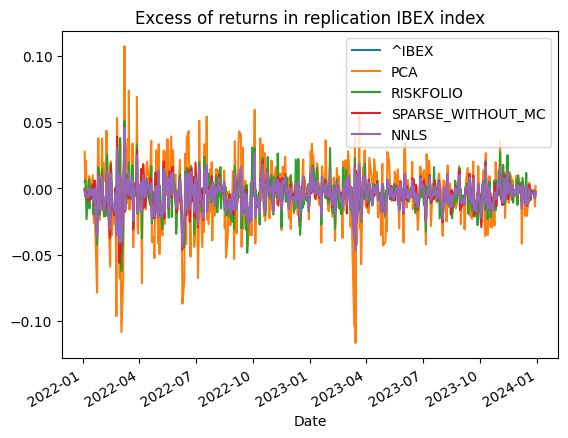

In [286]:
# Suppose risk free rate for example 0.5%
risk_free_rate=0.5/100
excess_return=pd.DataFrame()
excess_return['^IBEX']=df_ibex_comp['IBEX_orig']-risk_free_rate
excess_return['PCA']=df_ibex_comp['IBEX_REP_PCA']-risk_free_rate
excess_return['RISKFOLIO']=df_ibex_comp['IBEX_RISKFOLIO']-risk_free_rate
excess_return['SPARSE_WITHOUT_MC']=df_ibex_comp['IBEX_Replicated']-risk_free_rate
excess_return['NNLS']=df_ibex_comp['IBEX_NNLS']-risk_free_rate
sharpe_ratio_orig=np.mean(excess_return['^IBEX'])/np.std(excess_return['^IBEX'])
sharpe_ratio_pca=np.mean(excess_return['PCA'])/np.std(excess_return['PCA'])
sharpe_ratio_riskfolio=np.mean(excess_return['RISKFOLIO'])/np.std(excess_return['RISKFOLIO'])
sharpe_ratio_sparse_without_mc=np.mean(excess_return['SPARSE_WITHOUT_MC'])/np.std(excess_return['SPARSE_WITHOUT_MC'])
sharpe_ratio_nnls=np.mean(excess_return['NNLS'])/np.std(excess_return['NNLS'])
print('Sharpe Ratios: ')
print('Original index: ', sharpe_ratio_orig)
print('Replication with PCA index: ', sharpe_ratio_pca)
print('Replication with Riskfolio index: ', sharpe_ratio_riskfolio)
print('Replication with Sparse without MonteCarlo index: ', sharpe_ratio_sparse_without_mc)
print('Replication with NNLS index: ', sharpe_ratio_nnls)
excess_return.plot()
plt.title("Excess of returns in replication IBEX index")
plt.show();


### Comparison of prices: Costs


In [287]:
df_prices=pd.DataFrame()
df_prices['SPARSE_WITHOUT_MC']=pd.DataFrame(df_ibex.mul(weights_sparse_withoutMC, axis=1).sum(axis=1))
df_prices['PCA']=pd.DataFrame(df_ibex.mul(weights_pca, axis=1).sum(axis=1))
df_prices['RISKFOLIO']=pd.DataFrame(df_ibex.mul(weights_riskfolio, axis=1).sum(axis=1))
df_prices['NNLS']=pd.DataFrame(df_ibex.mul(weights_nnls, axis=1).sum(axis=1))
df_prices['^IBEX']=df_ibex_index

df_prices.head()

,SPARSE_WITHOUT_MC,PCA,RISKFOLIO,NNLS,^IBEX
Date,,,,,
2022-01-03 00:00:00+00:00,16.407201,24.782383,36.135034,23.479414,8761.200195
2022-01-04 00:00:00+00:00,16.455755,25.060518,36.538132,23.469917,8795.799805
2022-01-05 00:00:00+00:00,16.525405,25.375964,37.278625,23.448310,8790.799805
2022-01-06 00:00:00+00:00,16.466619,25.463603,37.404773,23.256624,8789.900391
2022-01-07 00:00:00+00:00,16.349202,25.206384,36.641806,22.999787,8751.799805


In [288]:
df_prices.describe()

,SPARSE_WITHOUT_MC,PCA,RISKFOLIO,NNLS,^IBEX
count,512.000000,512.000000,512.000000,512.000000,512.000000
mean,16.288321,23.444478,35.560421,22.616527,8800.834358
std,1.479184,2.456261,3.401437,1.445022,650.024945
min,12.984148,17.776785,28.115373,18.838249,7261.100098
25%,15.078802,21.230837,32.899505,21.525103,8272.399902
50%,16.273986,23.888561,35.231097,22.695457,8810.599609
75%,17.628507,25.318008,38.285504,23.742807,9314.324951
max,19.543171,28.677877,42.152451,25.780087,10258.099609


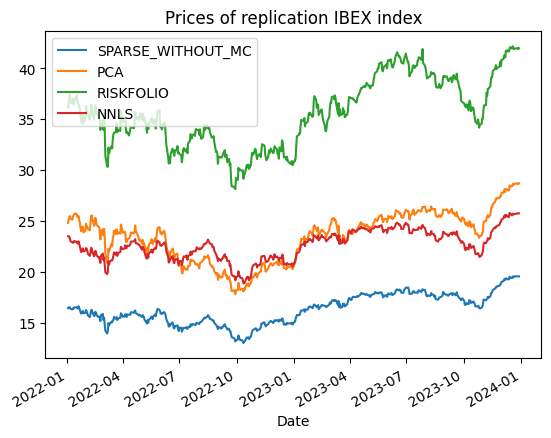

In [289]:
df_prices[['SPARSE_WITHOUT_MC', 'PCA', 'RISKFOLIO', 'NNLS']].plot()
plt.title("Prices of replication IBEX index")
plt.show();

In [290]:
df_prices.mean()

,0
SPARSE_WITHOUT_MC,16.288321
PCA,23.444478
RISKFOLIO,35.560421
NNLS,22.616527
^IBEX,8800.834358


### Liquidity

In [291]:
df_volumen=extract_liq(ibex_stocks, start_date, end_date)
df_volumen_index=yf.download('^IBEX', start=start_date, end=end_date)['Volume']
df_liq=pd.DataFrame()
df_liq['SPARSE_WITHOUT_MC']=pd.DataFrame(df_volumen.mul(weights_sparse_withoutMC, axis=1).sum(axis=1))
df_liq['PCA']=pd.DataFrame(df_volumen.mul(weights_pca, axis=1).sum(axis=1))
df_liq['RISKFOLIO']=pd.DataFrame(df_volumen.mul(weights_riskfolio, axis=1).sum(axis=1))
df_liq['NNLS']=pd.DataFrame(df_volumen.mul(weights_nnls, axis=1).sum(axis=1))
df_liq['^IBEX']=df_volumen_index
df_liq.head()

[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%********

,SPARSE_WITHOUT_MC,PCA,RISKFOLIO,NNLS,^IBEX
Date,,,,,
2022-01-03 00:00:00+00:00,1.219597e+07,1.960024e+07,8.404154e+05,9.086767e+06,117500900
2022-01-04 00:00:00+00:00,1.432466e+07,2.157162e+07,7.172849e+05,1.144514e+07,192378100
2022-01-05 00:00:00+00:00,1.273255e+07,1.498738e+07,1.117238e+06,9.435757e+06,146051700
2022-01-06 00:00:00+00:00,1.588641e+07,1.897195e+07,9.842108e+05,1.236372e+07,174962400
2022-01-07 00:00:00+00:00,1.573263e+07,2.344082e+07,1.724411e+06,1.202421e+07,170218700


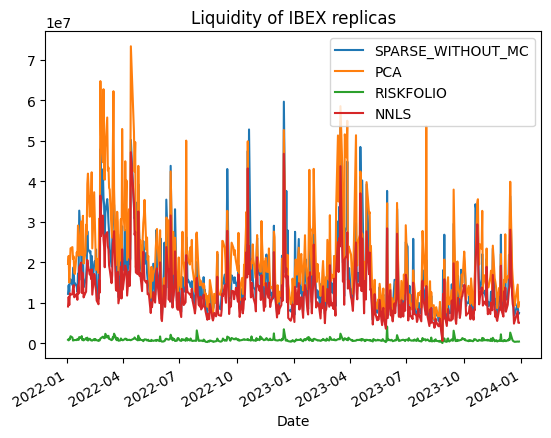

In [292]:
df_liq[['SPARSE_WITHOUT_MC', 'PCA', 'RISKFOLIO', 'NNLS']].plot()
plt.title("Liquidity of IBEX replicas")
plt.show();

In [293]:
df_liq.mean()

,0
SPARSE_WITHOUT_MC,1.634709e+07
PCA,2.064828e+07
RISKFOLIO,8.661689e+05
NNLS,1.250009e+07
^IBEX,1.680732e+08


# BVSP Bovespa Index (Brasil)

Let's apply the same method to different indexes: in this case Boxespa Index from BRICS' country: Brasil

In [294]:
bovespa_stocks=['EMBR3.SA' , 'CTIP3.SA' , 'ENBR3.SA' , 'CESP6.SA' , 'CIEL3.SA' , 'BRPR3.SA' , 'ABEV3.SA' , 'CPFE3.SA' , 'CMIG4.SA' , 'CSNA3.SA' , 'BBSE3.SA' , 'EQTL3.SA' , 'CYRE3.SA' , 'BRFS3.SA' , 'CPLE6.SA' , 'CCRO3.SA' , 'BBDC3.SA' , 'BRAP4.SA' , 'ELET3.SA' , 'BBAS3.SA' , 'BBDC4.SA' , 'CSAN3.SA' , 'ESTC3.SA' , 'ECOR3.SA' , 'BVMF3.SA' , '656690' , 'BRML3.SA' , 'GGBR4.SA' , 'BRKM5.SA' , 'FIBR3.SA' ]
df_bovespa, df_bov, df_ret_bov=extract_data(bovespa_stocks, start_date, end_date)
df_bov.head()

[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['CTIP3.SA']: YFPricesMissingError('$%ticker%: possibly delisted; no price data found  (1d 2022-01-01 -> 2023-12-31)')
[*********************100%***********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['ENBR3.SA']: YFTzMissingError('$%ticker%: possibly delisted; no timezone found')
[*********************100%***********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['CESP6.SA']: YFTzMissingError('$%ticker%: possibly delisted; no timezone found')
[*********************100%***********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['CIEL3.SA']: YFTzMissingError('$%ticker%: possibly delisted; no timezone found')
[*********************100%***********************]  1 of 1 completed
[********************

,EMBR3.SA,CTIP3.SA,ENBR3.SA,CESP6.SA,CIEL3.SA,BRPR3.SA,ABEV3.SA,CPFE3.SA,CMIG4.SA,CSNA3.SA,...,BBDC4.SA,CSAN3.SA,ESTC3.SA,ECOR3.SA,BVMF3.SA,656690,BRML3.SA,GGBR4.SA,BRKM5.SA,FIBR3.SA
Date,,,,,,,,,,,,,,,,,,,,,
2022-01-03 00:00:00+00:00,25.240000,NaN,NaN,NaN,NaN,364.622070,13.839315,21.573629,5.041866,18.081091,...,14.972754,19.464180,NaN,6.857232,NaN,NaN,NaN,17.364019,52.399281,NaN
2022-01-04 00:00:00+00:00,25.219999,NaN,NaN,NaN,NaN,354.837006,13.821261,21.506941,5.037951,17.808142,...,15.070919,19.583706,NaN,6.741823,NaN,NaN,NaN,17.606073,52.067406,NaN
2022-01-05 00:00:00+00:00,23.719999,NaN,NaN,NaN,NaN,337.841919,13.550432,21.165165,4.877457,17.430023,...,14.964355,18.609116,NaN,6.674500,NaN,NaN,NaN,17.313063,49.569130,NaN
2022-01-06 00:00:00+00:00,23.870001,NaN,NaN,NaN,NaN,335.266907,13.333770,20.665003,4.771765,17.206942,...,15.177479,18.176991,NaN,6.684118,NaN,NaN,NaN,17.319427,48.757881,NaN
2022-01-07 00:00:00+00:00,24.070000,NaN,NaN,NaN,NaN,332.176849,13.117107,21.123486,4.799166,17.935673,...,15.398220,18.213766,NaN,6.732205,NaN,NaN,NaN,17.472307,48.619602,NaN


## Replication methods

### 1st Method: Riskfolio-Lib

We decided to exclude those tickers with NaN data in all rows:
'CTIP3.SA', 'ENBR3.SA', 'CESP6.SA', 'ESTC3.SA', 'BVMF3.SA', '656690', 'BRML3.SA', 'FIBR3.SA'

[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['CIEL3.SA']: possibly delisted; no timezone found
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*

<Figure size 10000x1000 with 0 Axes>

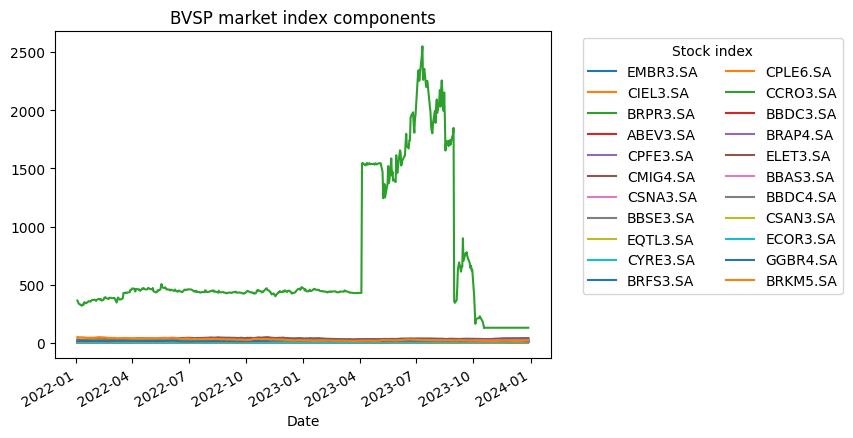

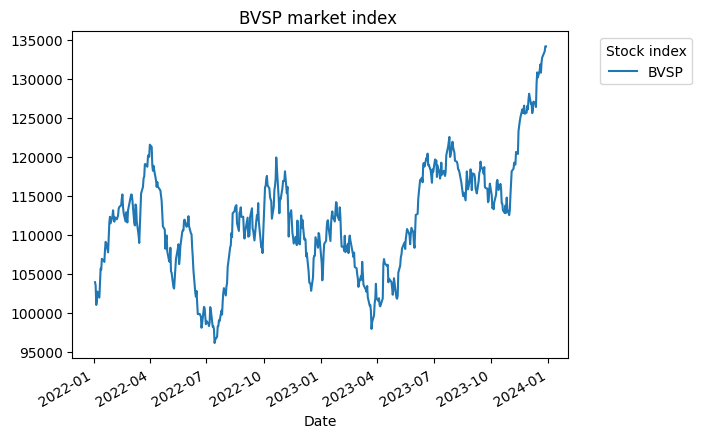

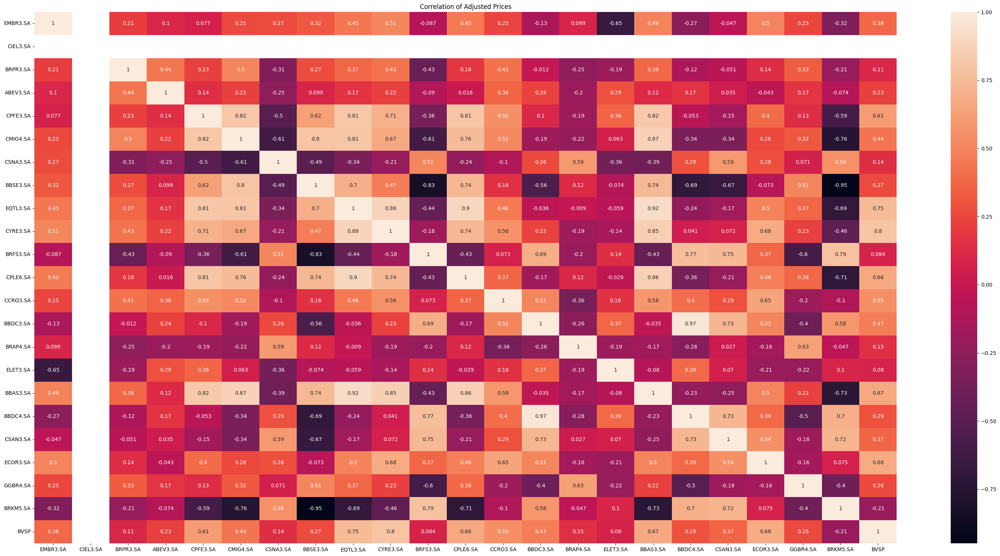

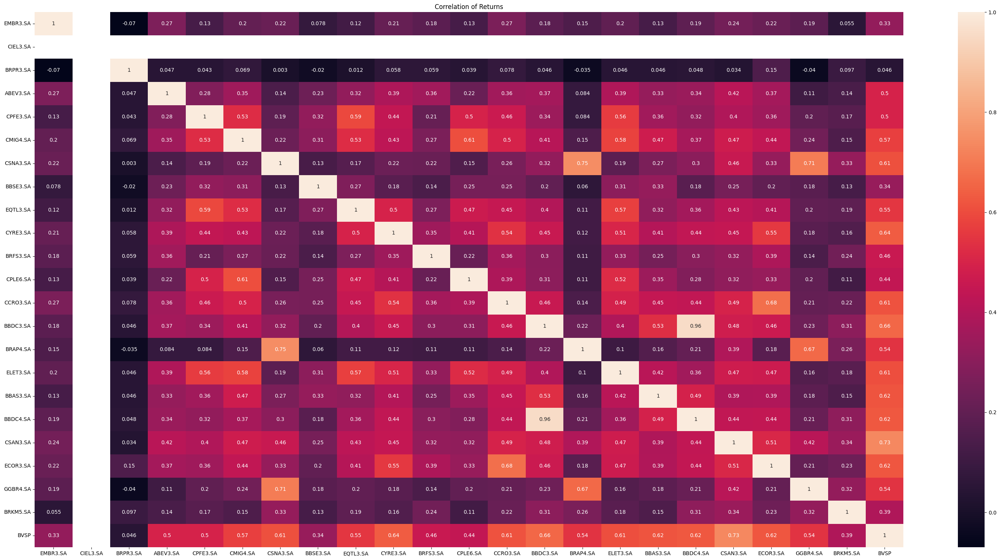

[*********************100%***********************]  23 of 23 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['CIEL3.SA']: YFTzMissingError('$%ticker%: possibly delisted; no timezone found')


You must convert self.cov to a positive definite matrix


In [295]:
bovespa_stocks=['EMBR3.SA' ,'CIEL3.SA' , 'BRPR3.SA' , 'ABEV3.SA' , 'CPFE3.SA' , 'CMIG4.SA' , 'CSNA3.SA' , 'BBSE3.SA' , 'EQTL3.SA' , 'CYRE3.SA' , 'BRFS3.SA' , 'CPLE6.SA' , 'CCRO3.SA' , 'BBDC3.SA' , 'BRAP4.SA' , 'ELET3.SA' , 'BBAS3.SA' , 'BBDC4.SA' , 'CSAN3.SA' ,  'ECOR3.SA' , 'GGBR4.SA' , 'BRKM5.SA'  ]
df_bvsp, df_bvsp_returns= get_correlations('BVSP', 'AM', bovespa_stocks, start_date, end_date)
w, frontier, port=get_data_rp(bovespa_stocks, '^BVSP', "2021-01-01", "2023-12-31")

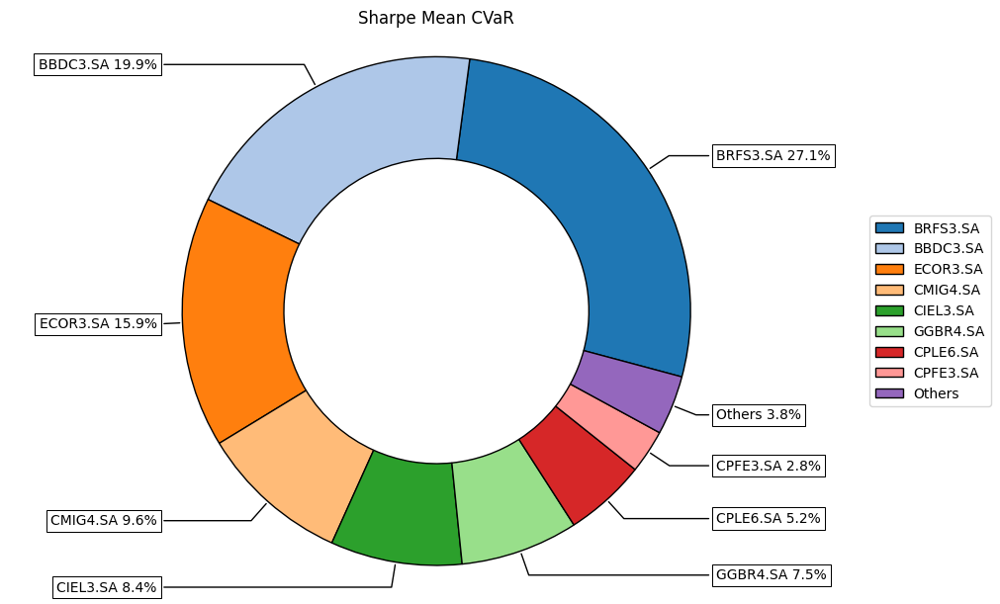

In [296]:
g2=rp.plot_pie(w=w,title="Sharpe Mean CVaR",others=0.05,nrow=25,cmap="tab20",height=6,width=10);

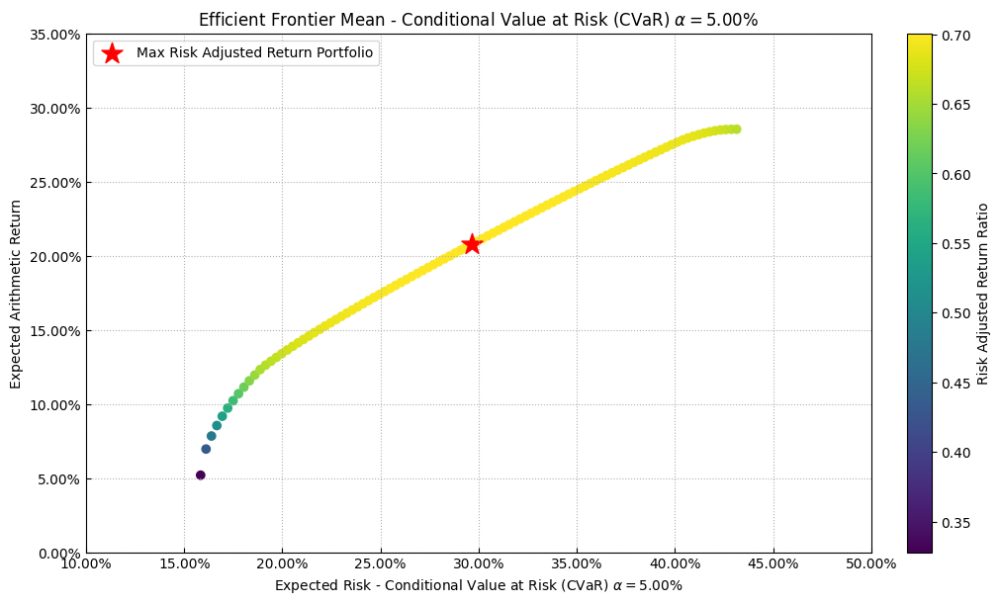

In [297]:
g1 = rp.plot_frontier(w_frontier=frontier,mu=port.mu,cov=port.cov,returns=port.returns,rm="CVaR",rf=0,cmap="viridis",w=w,label="Max Risk Adjusted Return Portfolio",marker="*")


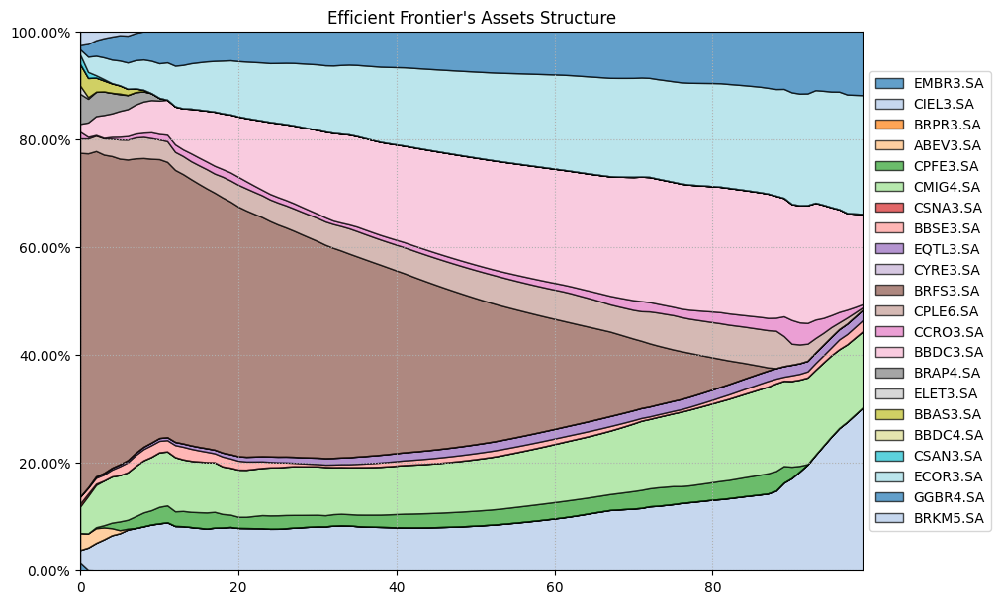

In [298]:
g3 = rp.plot_frontier_area(w_frontier=frontier, cmap="tab20", height=6, width=10, ax=None)

In [299]:
df_bvsp_rp=pd.DataFrame(df_bvsp_returns.iloc[:, :-1].mul(list(w['weights']), axis=1).sum(axis=1))
df_bvsp_rp.rename(columns={0:'BVSP_Replicated_Riskfolio'}, inplace=True)
weights_riskfolio=list(w['weights'])
df_bvsp_rp.head()

,BVSP_Replicated_Riskfolio
Date,
2022-01-04 00:00:00+00:00,-0.010947
2022-01-05 00:00:00+00:00,-0.005412
2022-01-06 00:00:00+00:00,0.017171
2022-01-07 00:00:00+00:00,0.006820
2022-01-10 00:00:00+00:00,-0.010377


### 2nd Method: Give weights with Principal Component Analysis

[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['CIEL3.SA']: YFTzMissingError('$%ticker%: possibly delisted; no timezone found')
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%**************

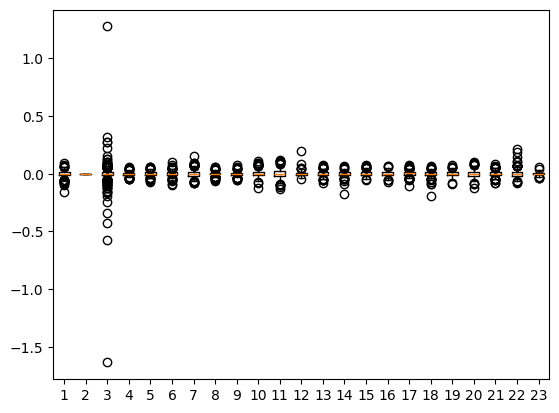

In [300]:
bovespa_stocks=['EMBR3.SA' ,'CIEL3.SA' , 'BRPR3.SA' , 'ABEV3.SA' , 'CPFE3.SA' , 'CMIG4.SA' , 'CSNA3.SA' , 'BBSE3.SA' , 'EQTL3.SA' , 'CYRE3.SA' , 'BRFS3.SA' , 'CPLE6.SA' , 'CCRO3.SA' , 'BBDC3.SA' , 'BRAP4.SA' , 'ELET3.SA' , 'BBAS3.SA' , 'BBDC4.SA' , 'CSAN3.SA' ,  'ECOR3.SA' , 'GGBR4.SA' , 'BRKM5.SA', '^BVSP' ]
num_stocks=len(bovespa_stocks)


lista_df, df_bvsp, df_bvsp_returns=extract_data(bovespa_stocks, start_date, end_date )
df_bvsp_returns=df_bvsp_returns.iloc[1:, :]
df_bvsp_returns.fillna(0, inplace=True)
plt.boxplot(df_bvsp_returns)
plt.show()

In [301]:
scaler=StandardScaler()
df_bvsp_returns.iloc[:, :-1]=df_bvsp_returns.iloc[:, :-1].replace(np.inf, np.nan)
df_bvsp_returns.iloc[:, :-1]=df_bvsp_returns.iloc[:, :-1].replace(-np.inf, np.nan)
df_bvsp_returns.iloc[:, :-1]=df_bvsp_returns.iloc[:, :-1].fillna(0)
pca = PCA(random_state=42)
pca.fit(df_bvsp_returns.iloc[:, :-1])

# Calcular la varianza explicada y los pesos
variance = pca.explained_variance_ratio_
pesos = pca.components_.T @ variance
weights_pca=pesos
df_bvsp_returns_replicated=df_bvsp_returns.copy()
for i in range(len(pesos)):
  df_bvsp_returns_replicated.iloc[:, i]=df_bvsp_returns_replicated.iloc[:, i]*pesos[i]
df_bvsp_returns_replicated['BVSP_REP_PCA']=df_bvsp_returns_replicated.iloc[:,:-1].sum(axis=1)
df_bvsp_returns_replicated=df_bvsp_returns_replicated[['BVSP_REP_PCA', '^BVSP']]
df_bvsp_returns_replicated.head()

,BVSP_REP_PCA,^BVSP
Date,,
2022-01-04 00:00:00+00:00,-0.020509,-0.003934
2022-01-05 00:00:00+00:00,-0.042936,-0.024527
2022-01-06 00:00:00+00:00,-0.001713,0.005480
2022-01-07 00:00:00+00:00,0.003123,0.011338
2022-01-10 00:00:00+00:00,-0.021370,-0.007564


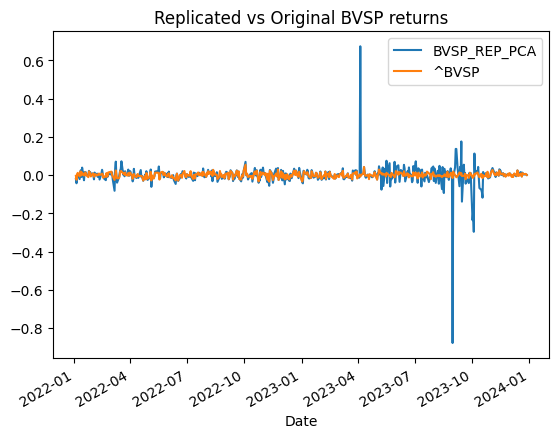

In [302]:
df_bvsp_returns_replicated.plot()
plt.title("Replicated vs Original BVSP returns")
plt.show();

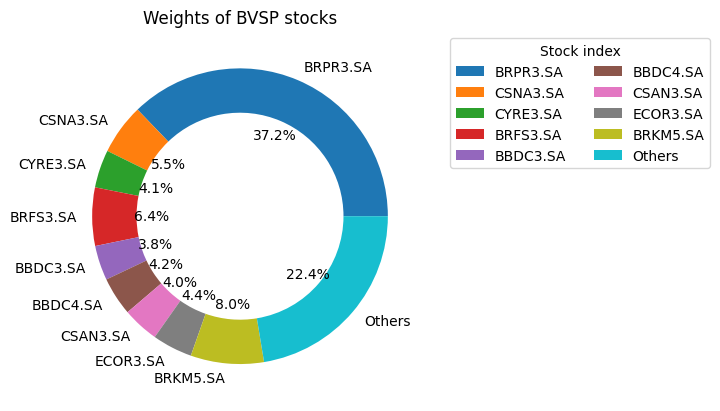

In [303]:
important_pesos=[abs(x) for x in pesos if x>0.05]
important_labels=[stock for stock, x in zip(bovespa_stocks, pesos) if x>0.05]
peso_resto=sum([abs(x) for x in pesos if x<0.05])
important_pesos.append(peso_resto)
important_labels.append('Others')
plt.pie(important_pesos, labels=important_labels, autopct='%1.1f%%', wedgeprops=dict(width=0.3))
plt.title('Weights of BVSP stocks')
plt.legend(title='Stock index', bbox_to_anchor=(1.05, 1), loc='upper left', ncol=2)
plt.show()

### 3rd Method: Sparse Method without Montecarlo


In [304]:
bovespa_stocks=['EMBR3.SA' ,'CIEL3.SA' , 'BRPR3.SA' , 'ABEV3.SA' , 'CPFE3.SA' , 'CMIG4.SA' , 'CSNA3.SA' , 'BBSE3.SA' , 'EQTL3.SA' , 'CYRE3.SA' , 'BRFS3.SA' , 'CPLE6.SA' , 'CCRO3.SA' , 'BBDC3.SA' , 'BRAP4.SA' , 'ELET3.SA' , 'BBAS3.SA' , 'BBDC4.SA' , 'CSAN3.SA' ,  'ECOR3.SA' , 'GGBR4.SA' , 'BRKM5.SA']
num_stocks=len(bovespa_stocks)
lista_df, df_bvsp, df_bvsp_returns=extract_data(bovespa_stocks, start_date, end_date )
lista_df_index, df_bvsp_index, df_bvsp_index_returns=extract_data(['^BVSP'], start_date, end_date )
df_bvsp_index_returns=df_bvsp_index_returns[1:]
df_bvsp_index_returns.fillna(0, inplace=True)
df_bvsp_returns=df_bvsp_returns[1:]
df_bvsp_returns.fillna(0, inplace=True)
index_returns=df_bvsp.sum(axis=1)
index_returns=np.log(index_returns / index_returns.shift(1))
index_returns.dropna(inplace=True)
threshold= 1e-7
r=0.01
opt_value, opt_w, t, tracking_error= sparse_tracking(num_stocks, df_bvsp_returns, df_bvsp_index_returns['^BVSP'],  np.inf, threshold, r)
stocks_considered=np.array(bovespa_stocks)[opt_w > threshold]
print('Found ', len(stocks_considered), ' stocks with weight bigger than threshold: ', stocks_considered)
weights_sparse_withoutMC=opt_w
print("Optimal weights: " ,opt_w)
print("Tracking error: ", (tracking_error)**0.5 )
print("Optimal Solution ", opt_value)

[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['CIEL3.SA']: YFTzMissingError('$%ticker%: possibly delisted; no timezone found')
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%**************

Solution found at step 21
Found  12  stocks with weight bigger than threshold:  ['CIEL3.SA' 'CSNA3.SA' 'CYRE3.SA' 'BRFS3.SA' 'BRAP4.SA' 'ELET3.SA'
 'BBAS3.SA' 'BBDC4.SA' 'CSAN3.SA' 'ECOR3.SA' 'GGBR4.SA' 'BRKM5.SA']
Optimal weights:  [9.97716350e-09 4.85181454e-01 8.25718025e-09 5.75775283e-09
 6.06378805e-09 6.57039549e-08 9.45192931e-02 3.66779385e-09
 9.64503695e-09 8.34093103e-02 2.62602538e-02 7.19252988e-09
 1.66262625e-08 5.42235232e-08 9.54800136e-03 4.27578630e-02
 5.93752038e-02 4.10736974e-02 1.12618440e-01 3.26994615e-02
 9.54121490e-03 3.01562001e-03]
Tracking error:  0.11970299275678517
Optimal Solution  0.03493965231033835


In [305]:
df_bvsp_sparse=pd.DataFrame(df_bvsp_returns.mul(opt_w, axis=1).sum(axis=1))
df_bvsp_sparse.rename(columns={0:'BVSP_Replicated'}, inplace=True)
df_bvsp_sparse['BVSP_orig']=df_bvsp_index_returns
df_bvsp_sparse.head()

,BVSP_Replicated,BVSP_orig
Date,,
2022-01-04 00:00:00+00:00,-0.004127,-0.003934
2022-01-05 00:00:00+00:00,-0.011720,-0.024527
2022-01-06 00:00:00+00:00,-0.001537,0.005480
2022-01-07 00:00:00+00:00,0.005033,0.011338
2022-01-10 00:00:00+00:00,-0.001137,-0.007564


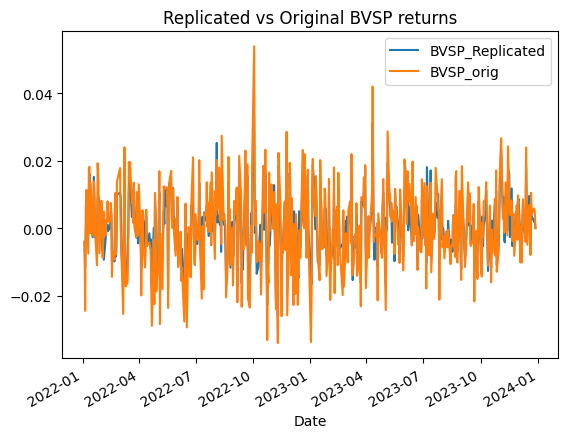

In [306]:
df_bvsp_sparse.plot()
plt.title("Replicated vs Original BVSP returns")
plt.show();

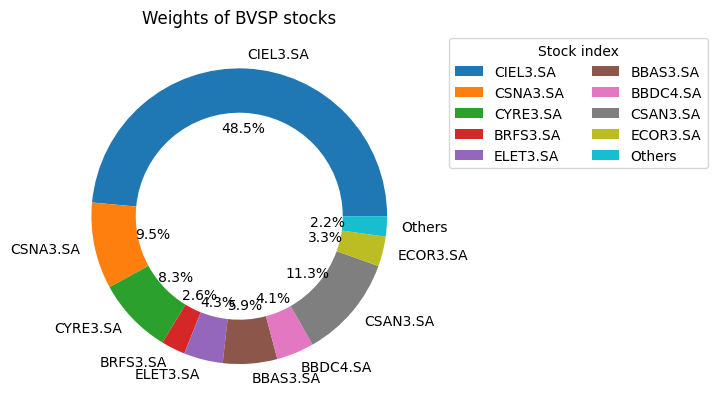

In [307]:
important_pesos=[abs(x) for x in opt_w if x>0.025]
important_labels=[stock for stock, x in zip(bovespa_stocks, opt_w) if x>0.025]
peso_resto=sum([abs(x) for x in opt_w if x<0.025])
important_pesos.append(peso_resto)
important_labels.append('Others')
plt.pie(important_pesos, labels=important_labels, autopct='%1.1f%%', wedgeprops=dict(width=0.3))
plt.title('Weights of BVSP stocks')
plt.legend(title='Stock index', bbox_to_anchor=(1.05, 1), loc='upper left', ncol=2)
plt.show()

### 4th Method: Allocation using Non-Negative Least Squares (NNLS) Optimization


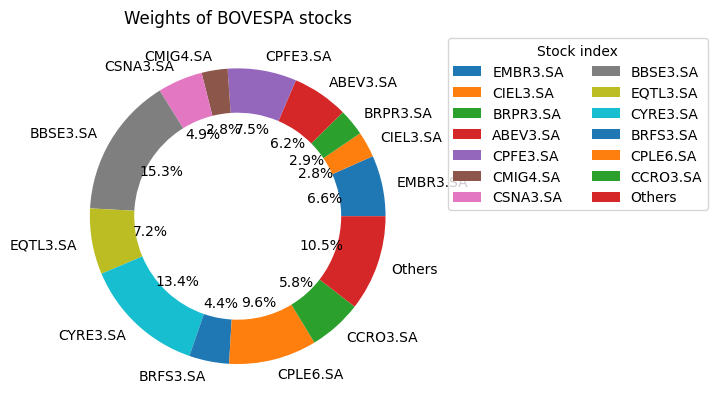

In [308]:
df_bvsp.fillna(0, inplace=True)
result = nnls(df_bvsp_returns, list(df_bvsp_index_returns['^BVSP']))
weights = result[0]
weights_nnls=weights
factor=result[1]
weights_plotting=[abs(x) for x in weights_nnls if x>0.025]
important_labels=[stock for stock, x in zip(bovespa_stocks, weights_plotting) if x>0.025]
peso_resto=sum([abs(x) for x in weights_nnls if x<0.025])
weights_plotting.append(peso_resto)
important_labels.append('Others')
plt.pie(weights_plotting, labels=important_labels, autopct='%1.1f%%', wedgeprops=dict(width=0.3))
plt.title('Weights of BOVESPA stocks')
plt.legend(title='Stock index', bbox_to_anchor=(1.05, 1), loc='upper left', ncol=2)
plt.show()

In [309]:
df_bvsp_nnls=pd.DataFrame(df_bvsp_returns.mul(weights, axis=1).sum(axis=1))
df_bvsp_nnls.rename(columns={0:'BVSP_NNLS'}, inplace=True)
df_bvsp_nnls['BVSP_orig']=df_bvsp_index_returns
df_bvsp_nnls.head()

,BVSP_NNLS,BVSP_orig
Date,,
2022-01-04 00:00:00+00:00,-0.001986,-0.003934
2022-01-05 00:00:00+00:00,-0.015400,-0.024527
2022-01-06 00:00:00+00:00,0.002544,0.005480
2022-01-07 00:00:00+00:00,0.005252,0.011338
2022-01-10 00:00:00+00:00,-0.002349,-0.007564


## Comparison of several methods


### Histogram of daily returns


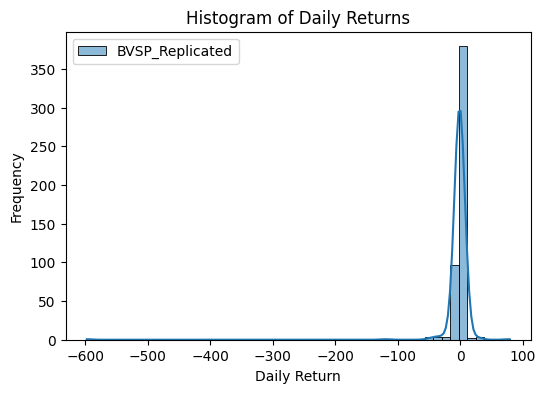

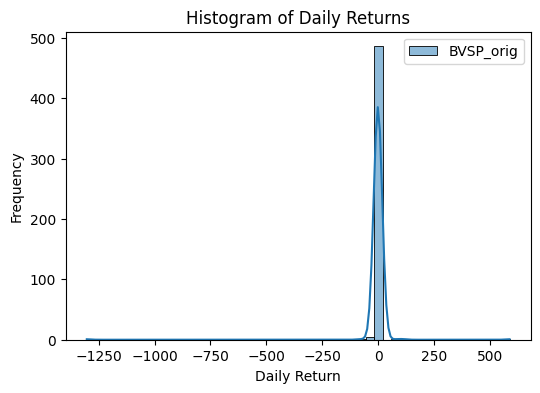

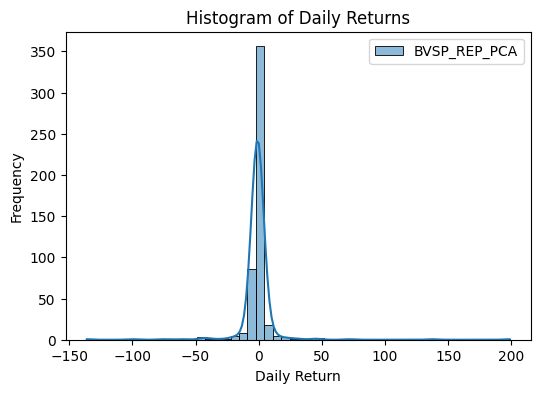

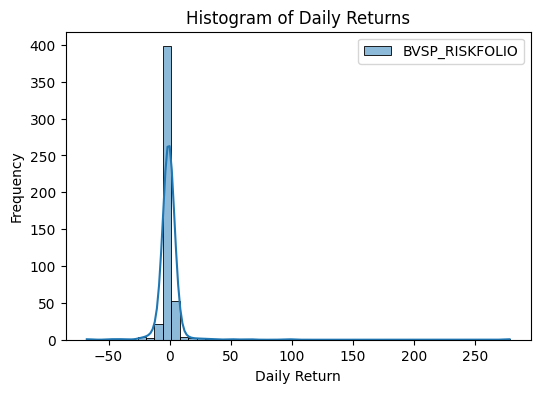

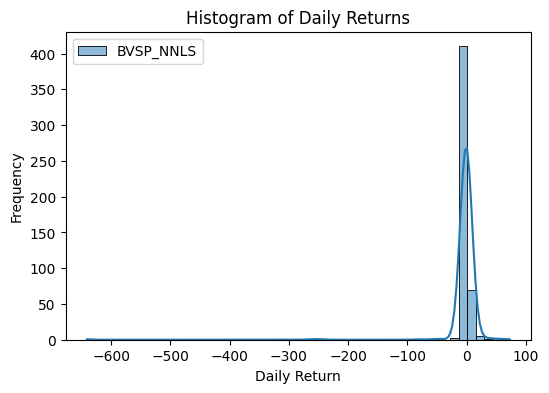

In [310]:
df_bvsp_comp=df_bvsp_sparse
df_bvsp_comp['BVSP_REP_PCA']=df_bvsp_returns_replicated[['BVSP_REP_PCA']]
df_bvsp_comp['BVSP_RISKFOLIO']=df_bvsp_rp
df_bvsp_comp['BVSP_NNLS']=df_bvsp_nnls[['BVSP_NNLS']]

# Plot individual histograms for daily returns

for symbol in list(df_bvsp_comp.columns):
    plt.figure(figsize=(6, 4))
    returns = df_bvsp_comp[symbol].pct_change().dropna()
    sn.histplot(returns, bins=50, kde=True, label=symbol)
    plt.title('Histogram of Daily Returns')
    plt.xlabel('Daily Return')
    plt.ylabel('Frequency')
    plt.legend()
    plt.show()

### Difference of returns


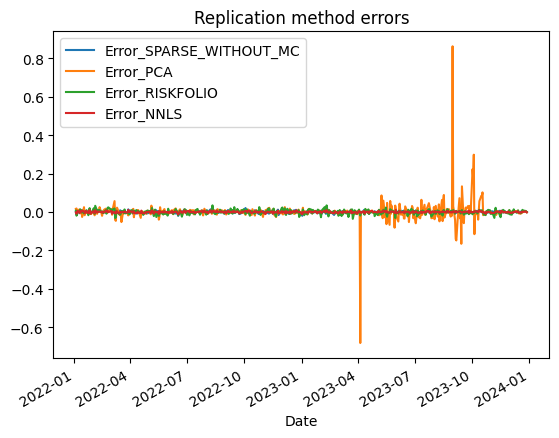

In [311]:
#Let's calculate difference between them
df_bvsp_comp['Error_SPARSE_WITHOUT_MC']=df_bvsp_comp['BVSP_orig']-df_bvsp_comp['BVSP_Replicated']
df_bvsp_comp['Error_PCA']=df_bvsp_comp['BVSP_orig']-df_bvsp_comp['BVSP_REP_PCA']
df_bvsp_comp['Error_RISKFOLIO']=df_bvsp_comp['BVSP_orig']-df_bvsp_comp['BVSP_RISKFOLIO']
df_bvsp_comp['Error_NNLS']=df_bvsp_comp['BVSP_orig']-df_bvsp_comp['BVSP_NNLS']

df_bvsp_comp[['Error_SPARSE_WITHOUT_MC', 'Error_PCA', 'Error_RISKFOLIO', 'Error_NNLS']].plot()
plt.title("Replication method errors")
plt.show();

### Tracking errors


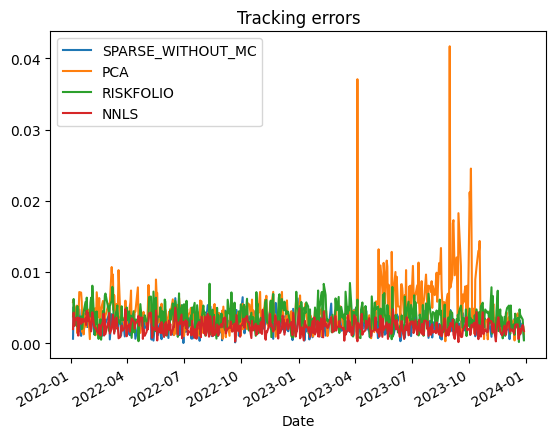

In [312]:
df_tracking_error=pd.DataFrame()
df_tracking_error['SPARSE_WITHOUT_MC']=(df_bvsp_comp['BVSP_orig']-df_bvsp_comp['BVSP_Replicated']).apply(lambda x: np.sqrt(abs(x)/(df_bvsp_comp['BVSP_orig'].shape[0]-1)))
df_tracking_error['PCA']=(df_bvsp_comp['BVSP_orig']-df_bvsp_comp['BVSP_REP_PCA']).apply(lambda x: np.sqrt(abs(x)/(df_bvsp_comp['BVSP_orig'].shape[0]-1)))
df_tracking_error['RISKFOLIO']=(df_bvsp_comp['BVSP_orig']-df_bvsp_comp['BVSP_RISKFOLIO']).apply(lambda x: np.sqrt(abs(x)/(df_bvsp_comp['BVSP_orig'].shape[0]-1)))
df_tracking_error['NNLS']=(df_bvsp_comp['BVSP_orig']-df_bvsp_comp['BVSP_NNLS']).apply(lambda x: np.sqrt(abs(x)/(df_bvsp_comp['BVSP_orig'].shape[0]-1)))
df_tracking_error.plot()
plt.title("Tracking errors")
plt.show();

In [313]:
df_tracking_error.mean()

,0
SPARSE_WITHOUT_MC,0.002663
PCA,0.004784
RISKFOLIO,0.003672
NNLS,0.002248


### Tracking differences


0.00029523246390615403
0.0015632715096395861
6.429517706478736e-05
3.5706659383229414e-05


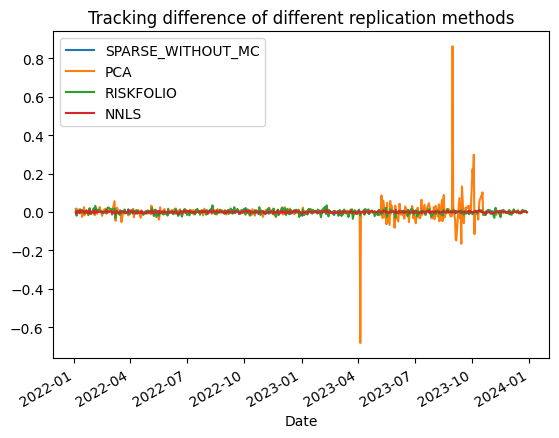

In [314]:
df_tracking_difference=pd.DataFrame()
df_tracking_difference['SPARSE_WITHOUT_MC']=(df_bvsp_comp['BVSP_orig']-df_bvsp_comp['BVSP_Replicated'])
df_tracking_difference['PCA']=(df_bvsp_comp['BVSP_orig']-df_bvsp_comp['BVSP_REP_PCA'])
df_tracking_difference['RISKFOLIO']=(df_bvsp_comp['BVSP_orig']-df_bvsp_comp['BVSP_RISKFOLIO'])
df_tracking_difference['NNLS']=(df_bvsp_comp['BVSP_orig']-df_bvsp_comp['BVSP_NNLS'])
print(df_tracking_difference['SPARSE_WITHOUT_MC'].mean())
print(df_tracking_difference['PCA'].mean())
print(df_tracking_difference['RISKFOLIO'].mean())
print(df_tracking_difference['NNLS'].mean())
df_tracking_difference.plot()
plt.title("Tracking difference of different replication methods")
plt.show();

In [315]:
df_tracking_difference.mean()

,0
SPARSE_WITHOUT_MC,0.000295
PCA,0.001563
RISKFOLIO,0.000064
NNLS,0.000036


### Total Performance

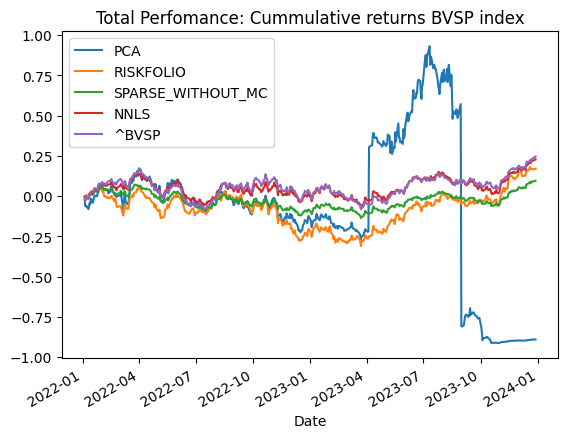

In [316]:
df_cummreturn=pd.DataFrame()
df_cummreturn['PCA']=(1 + df_bvsp_comp['BVSP_REP_PCA'].fillna(0)).cumprod() - 1
df_cummreturn['RISKFOLIO']=(1 + df_bvsp_comp['BVSP_RISKFOLIO'].fillna(0)).cumprod() - 1
df_cummreturn['SPARSE_WITHOUT_MC']=(1 + df_bvsp_comp['BVSP_Replicated'].fillna(0)).cumprod() - 1
df_cummreturn['NNLS']=(1 + df_bvsp_comp['BVSP_NNLS'].fillna(0)).cumprod() - 1
df_cummreturn['^BVSP']=(1 + df_bvsp_comp['BVSP_orig'].fillna(0)).cumprod() - 1
df_cummreturn.plot()
plt.title("Total Perfomance: Cummulative returns BVSP index")
plt.show();

In [317]:
df_cummreturn.mean()

,0
PCA,-0.061446
RISKFOLIO,-0.076380
SPARSE_WITHOUT_MC,-0.028170
NNLS,0.049911
^BVSP,0.055409


### Sharpe index


Sharpe Ratios: 
Original index:  -0.3698950536135546
Replication with PCA index:  -0.10022010088766439
Replication with Riskfolio index:  -0.2770101185271162
Replication with Sparse without MonteCarlo index:  -0.5541028308617446
Replication with NNLS index:  -0.39238699093975615


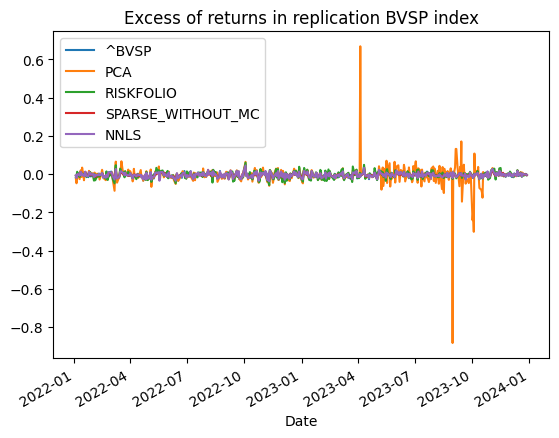

In [318]:
# Suppose risk free rate for example 0.5%
risk_free_rate=0.5/100
excess_return=pd.DataFrame()
excess_return['^BVSP']=df_bvsp_comp['BVSP_orig']-risk_free_rate
excess_return['PCA']=df_bvsp_comp['BVSP_REP_PCA']-risk_free_rate
excess_return['RISKFOLIO']=df_bvsp_comp['BVSP_RISKFOLIO']-risk_free_rate
excess_return['SPARSE_WITHOUT_MC']=df_bvsp_comp['BVSP_Replicated']-risk_free_rate
excess_return['NNLS']=df_bvsp_comp['BVSP_NNLS']-risk_free_rate
sharpe_ratio_orig=np.mean(excess_return['^BVSP'])/np.std(excess_return['^BVSP'])
sharpe_ratio_pca=np.mean(excess_return['PCA'])/np.std(excess_return['PCA'])
sharpe_ratio_riskfolio=np.mean(excess_return['RISKFOLIO'])/np.std(excess_return['RISKFOLIO'])
sharpe_ratio_sparse_without_mc=np.mean(excess_return['SPARSE_WITHOUT_MC'])/np.std(excess_return['SPARSE_WITHOUT_MC'])
sharpe_ratio_nnls=np.mean(excess_return['NNLS'])/np.std(excess_return['NNLS'])
print('Sharpe Ratios: ')
print('Original index: ', sharpe_ratio_orig)
print('Replication with PCA index: ', sharpe_ratio_pca)
print('Replication with Riskfolio index: ', sharpe_ratio_riskfolio)
print('Replication with Sparse without MonteCarlo index: ', sharpe_ratio_sparse_without_mc)
print('Replication with NNLS index: ', sharpe_ratio_nnls)
excess_return.plot()
plt.title("Excess of returns in replication BVSP index")
plt.show();


### Comparison of prices: Costs


In [319]:
df_prices=pd.DataFrame()
df_prices['SPARSE_WITHOUT_MC']=pd.DataFrame(df_bvsp.mul(weights_sparse_withoutMC, axis=1).sum(axis=1))
df_prices['PCA']=pd.DataFrame(df_bvsp.mul(weights_pca, axis=1).sum(axis=1))
df_prices['RISKFOLIO']=pd.DataFrame(df_bvsp.mul(weights_riskfolio, axis=1).sum(axis=1))
df_prices['NNLS']=pd.DataFrame(df_bvsp.mul(weights_nnls, axis=1).sum(axis=1))
df_prices['^BVSP']=df_bvsp_index

df_prices.head()

,SPARSE_WITHOUT_MC,PCA,RISKFOLIO,NNLS,^BVSP
Date,,,,,
2022-01-03 00:00:00+00:00,8.937414,210.339450,12.897466,16.309108,103922.0
2022-01-04 00:00:00+00:00,8.860801,205.048124,12.693944,16.252006,103514.0
2022-01-05 00:00:00+00:00,8.661307,195.639500,12.679996,15.959903,101006.0
2022-01-06 00:00:00+00:00,8.637734,194.301050,13.086895,16.003257,101561.0
2022-01-07 00:00:00+00:00,8.694412,192.782072,13.204558,16.059016,102719.0


In [320]:
df_prices.describe()

,SPARSE_WITHOUT_MC,PCA,RISKFOLIO,NNLS,^BVSP
count,498.000000,498.000000,498.000000,498.000000,498.000000
mean,8.846472,373.790272,10.923067,17.699388,111897.323293
std,0.727505,305.851111,1.267097,1.040200,7233.468461
min,7.067034,80.987443,8.141231,15.541659,96121.000000
25%,8.285506,238.142783,9.946365,17.022582,107175.250000
50%,8.858123,248.129347,10.944229,17.510514,111889.000000
75%,9.319876,267.518525,11.902334,18.299944,116723.000000
max,10.970230,1357.131382,13.707412,20.918486,134194.000000


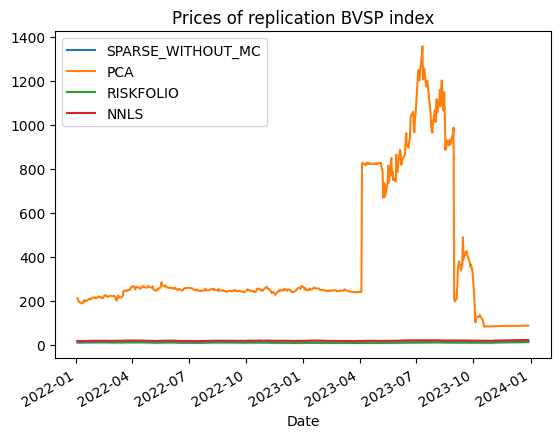

In [321]:
df_prices[['SPARSE_WITHOUT_MC', 'PCA', 'RISKFOLIO', 'NNLS']].plot()
plt.title("Prices of replication BVSP index")
plt.show();

In [322]:
df_prices.mean()

,0
SPARSE_WITHOUT_MC,8.846472
PCA,373.790272
RISKFOLIO,10.923067
NNLS,17.699388
^BVSP,111897.323293


### Liquidity

In [323]:
df_volumen=extract_liq(bovespa_stocks, start_date, end_date)
df_volumen_index=yf.download('^BVSP', start=start_date, end=end_date)['Volume']
df_liq=pd.DataFrame()
df_liq['SPARSE_WITHOUT_MC']=pd.DataFrame(df_volumen.mul(weights_sparse_withoutMC, axis=1).sum(axis=1))
df_liq['PCA']=pd.DataFrame(df_volumen.mul(weights_pca, axis=1).sum(axis=1))
df_liq['RISKFOLIO']=pd.DataFrame(df_volumen.mul(weights_riskfolio, axis=1).sum(axis=1))
df_liq['NNLS']=pd.DataFrame(df_volumen.mul(weights_nnls, axis=1).sum(axis=1))
df_liq['^BVSP']=df_volumen_index
df_liq.head()

[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['CIEL3.SA']: YFTzMissingError('$%ticker%: possibly delisted; no timezone found')
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%**************

,SPARSE_WITHOUT_MC,PCA,RISKFOLIO,NNLS,^BVSP
Date,,,,,
2022-01-03 00:00:00+00:00,6.963823e+06,1.017306e+07,1.014946e+07,1.225043e+07,11128500
2022-01-04 00:00:00+00:00,9.097951e+06,1.339939e+07,8.457938e+06,1.324289e+07,11491600
2022-01-05 00:00:00+00:00,7.495132e+06,1.171502e+07,1.170265e+07,1.283887e+07,0
2022-01-06 00:00:00+00:00,6.187602e+06,1.004027e+07,1.151311e+07,1.048261e+07,11749200
2022-01-07 00:00:00+00:00,8.131576e+06,1.322064e+07,1.291571e+07,1.188553e+07,11733200


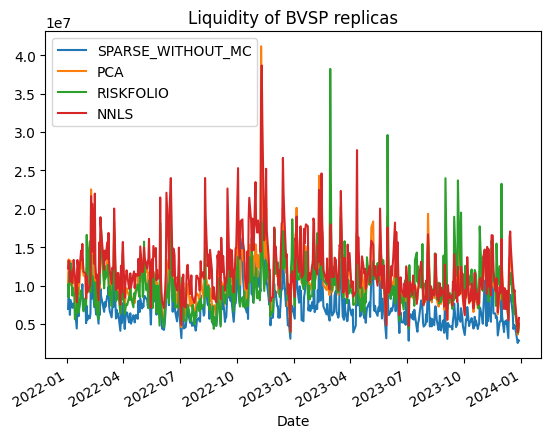

In [324]:
df_liq[['SPARSE_WITHOUT_MC', 'PCA', 'RISKFOLIO', 'NNLS']].plot()
plt.title("Liquidity of BVSP replicas")
plt.show();

In [325]:
df_liq.mean()

,0
SPARSE_WITHOUT_MC,7.259124e+06
PCA,1.077152e+07
RISKFOLIO,1.024012e+07
NNLS,1.228980e+07
^BVSP,1.231702e+07


# DJI Dow Jones (USA)

Let's apply the same method to different indexes: in this case DJI (Dow Jones)

## Replication methods

### 1st Method: Riskfolio-Lib

In [326]:
dji_stocks=['AAPL' , 'MSFT' , 'AMZN' , 'WMT' , 'JPM' , 'UNH' , 'V' , 'PG' , 'JNJ' , 'HD' , 'KO' , 'MRK' , 'CVX' , 'CRM' , 'MCD' , 'CSCO' , 'IBM' , 'AXP' , 'VZ' , 'AMGN' , 'GS' , 'CAT' , 'DIS' , 'HON' , 'NKE' , 'BA' , 'INTC' , 'MMM' , 'TRV' , 'DOW']

[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%********

<Figure size 10000x1000 with 0 Axes>

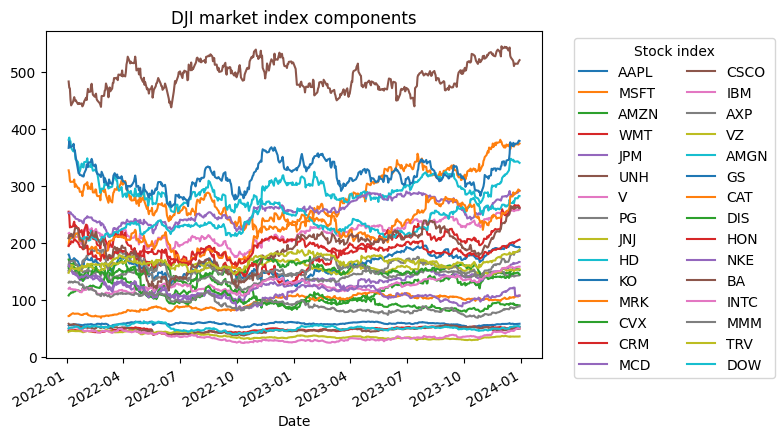

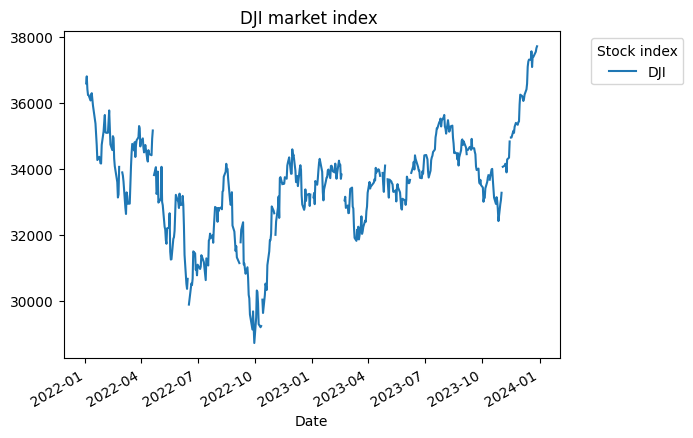

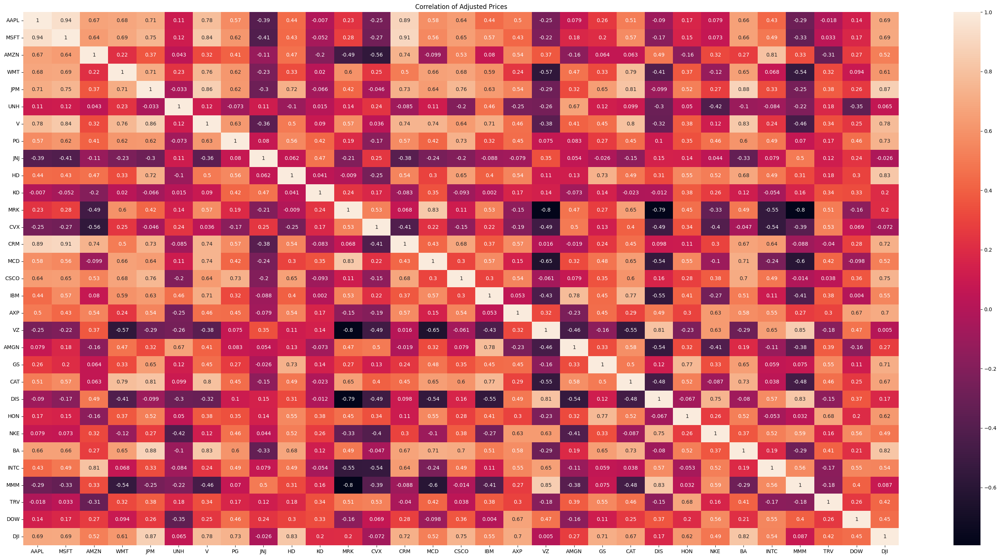

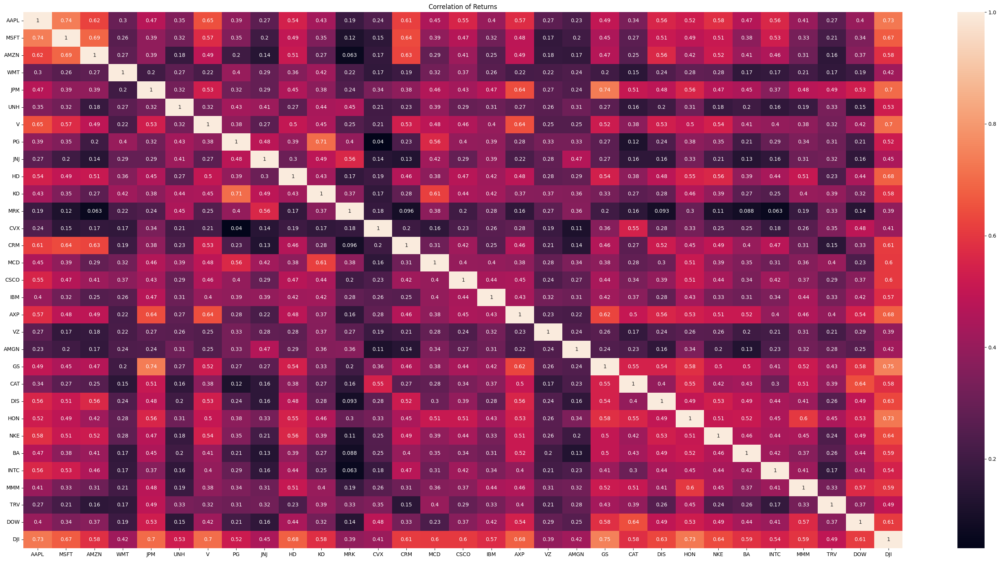

[*********************100%***********************]  31 of 31 completed


In [327]:
df_dji, df_dji_returns= get_correlations('DJI', 'AM', dji_stocks, start_date, end_date)
w, frontier, port=get_data_rp(dji_stocks, '^DJI', "2021-01-01", "2023-12-31")

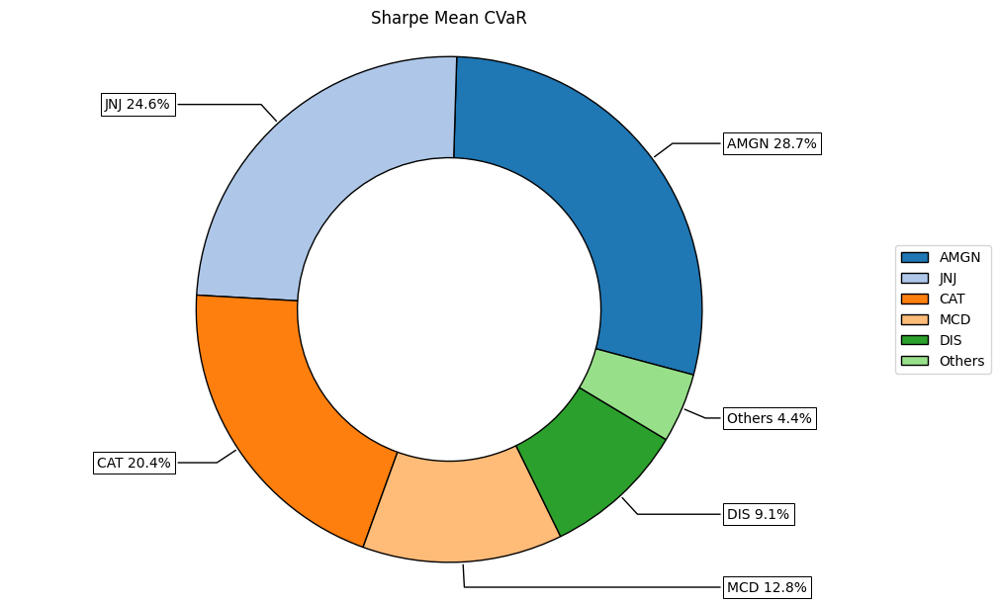

In [328]:
g2=rp.plot_pie(w=w,title="Sharpe Mean CVaR",others=0.05,nrow=25,cmap="tab20",height=6,width=10);

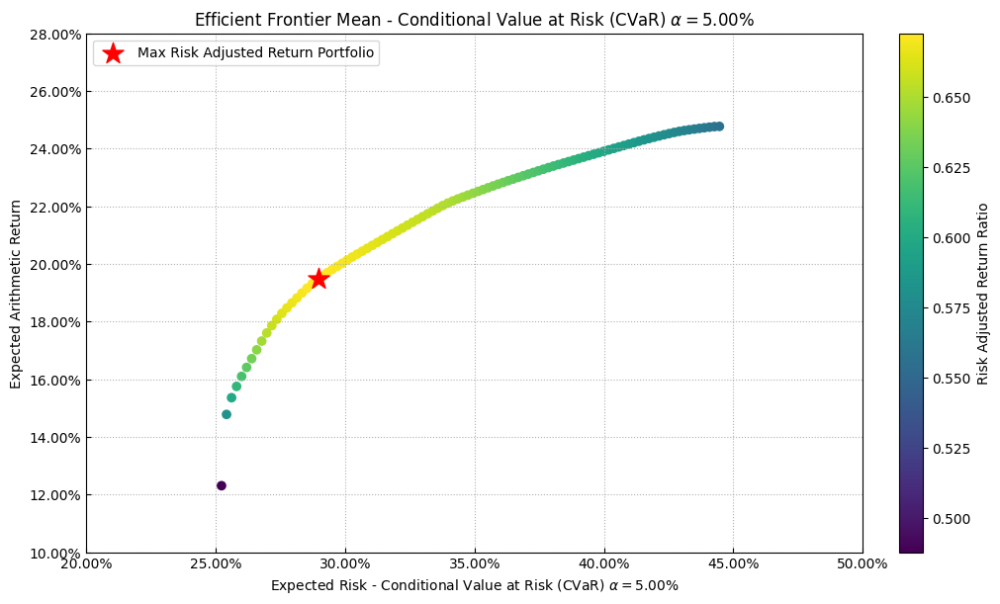

In [329]:
g1 = rp.plot_frontier(w_frontier=frontier,mu=port.mu,cov=port.cov,returns=port.returns,rm="CVaR",rf=0,cmap="viridis",w=w,label="Max Risk Adjusted Return Portfolio",marker="*")


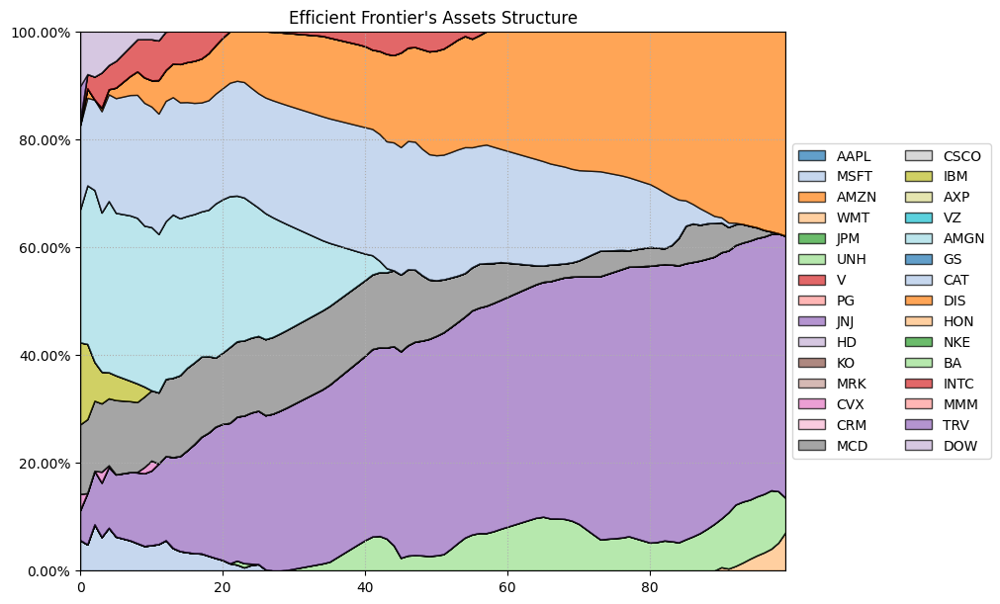

In [330]:
g3 = rp.plot_frontier_area(w_frontier=frontier, cmap="tab20", height=6, width=10, ax=None)

In [331]:
df_dji_rp=pd.DataFrame(df_dji_returns.iloc[:, :-1].mul(list(w['weights']), axis=1).sum(axis=1))
df_dji_rp.rename(columns={0:'DJI_Replicated_Riskfolio'}, inplace=True)
weights_riskfolio=list(w['weights'])
df_dji_rp.head()

,DJI_Replicated_Riskfolio
Date,
2022-01-04 00:00:00+00:00,0.010659
2022-01-05 00:00:00+00:00,-0.001698
2022-01-06 00:00:00+00:00,0.003358
2022-01-07 00:00:00+00:00,0.007114
2022-01-10 00:00:00+00:00,-0.000877


### 2nd Method: Give weights with Principal Component Analysis


[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%********

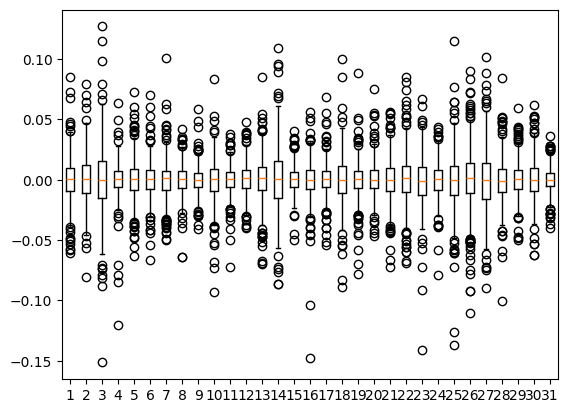

In [332]:
dji_stocks=['AAPL' , 'MSFT' , 'AMZN' , 'WMT' , 'JPM' , 'UNH' , 'V' , 'PG' , 'JNJ' , 'HD' , 'KO' , 'MRK' , 'CVX' , 'CRM' , 'MCD' , 'CSCO' , 'IBM' , 'AXP' , 'VZ' , 'AMGN' , 'GS' , 'CAT' , 'DIS' , 'HON' , 'NKE' , 'BA' , 'INTC' , 'MMM' , 'TRV' , 'DOW', '^DJI']
num_stocks=len(dji_stocks)


lista_df, df_dji, df_dji_returns=extract_data(dji_stocks, start_date, end_date )
df_dji_returns=df_dji_returns.iloc[1:, :]
df_dji_returns.fillna(0, inplace=True)
plt.boxplot(df_dji_returns)
plt.show()

In [333]:
scaler=StandardScaler()
df_dji_returns.iloc[:, :-1]=df_dji_returns.iloc[:, :-1].replace(np.inf, np.nan)
df_dji_returns.iloc[:, :-1]=df_dji_returns.iloc[:, :-1].replace(-np.inf, np.nan)
df_dji_returns.iloc[:, :-1]=df_dji_returns.iloc[:, :-1].fillna(0)
pca = PCA(random_state=42)
pca.fit(df_dji_returns.iloc[:, :-1])

# Calcular la varianza explicada y los pesos
variance = pca.explained_variance_ratio_
pesos = pca.components_.T @ variance
weights_pca=pesos
df_dji_returns_replicated=df_dji_returns.copy()
for i in range(len(pesos)):
  df_dji_returns_replicated.iloc[:, i]=df_dji_returns_replicated.iloc[:, i]*pesos[i]
df_dji_returns_replicated['DJI_REP_PCA']=df_dji_returns_replicated.iloc[:,:-1].sum(axis=1)
df_dji_returns_replicated=df_dji_returns_replicated[['DJI_REP_PCA', '^DJI']]
df_dji_returns_replicated.head()

,DJI_REP_PCA,^DJI
Date,,
2022-01-04 00:00:00+00:00,0.007976,0.005848
2022-01-05 00:00:00+00:00,-0.028741,-0.010724
2022-01-06 00:00:00+00:00,-0.003774,-0.004698
2022-01-07 00:00:00+00:00,-0.000119,-0.000133
2022-01-10 00:00:00+00:00,-0.013213,-0.004503


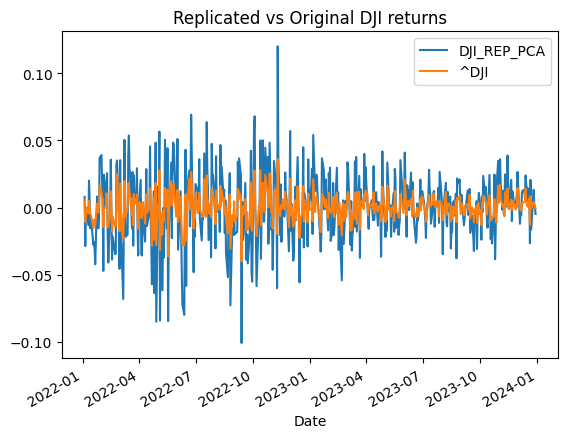

In [334]:
df_dji_returns_replicated.plot()
plt.title("Replicated vs Original DJI returns")
plt.show();

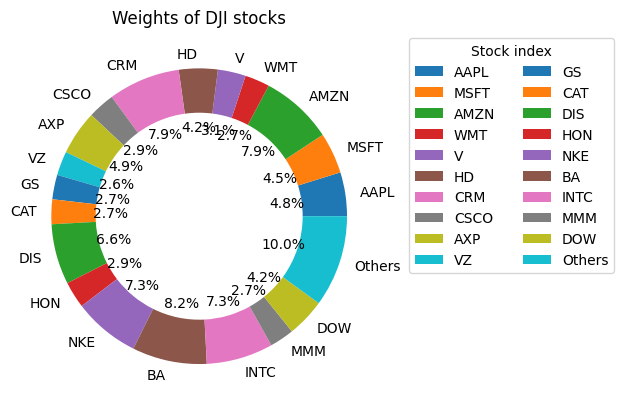

In [335]:
important_pesos=[abs(x) for x in pesos if x>0.05]
important_labels=[stock for stock, x in zip(dji_stocks, pesos) if x>0.05]
peso_resto=sum([abs(x) for x in pesos if x<0.05])
important_pesos.append(peso_resto)
important_labels.append('Others')
plt.pie(important_pesos, labels=important_labels, autopct='%1.1f%%', wedgeprops=dict(width=0.3))
plt.title('Weights of DJI stocks')
plt.legend(title='Stock index', bbox_to_anchor=(1.05, 1), loc='upper left', ncol=2)
plt.show()

### 3rd Method: Sparse Method without Montecarlo


In [336]:
dji_stocks=['AAPL' , 'MSFT' , 'AMZN' , 'WMT' , 'JPM' , 'UNH' , 'V' , 'PG' , 'JNJ' , 'HD' , 'KO' , 'MRK' , 'CVX' , 'CRM' , 'MCD' , 'CSCO' , 'IBM' , 'AXP' , 'VZ' , 'AMGN' , 'GS' , 'CAT' , 'DIS' , 'HON' , 'NKE' , 'BA' , 'INTC' , 'MMM' , 'TRV' , 'DOW']
num_stocks=len(dji_stocks)
lista_df, df_dji, df_dji_returns=extract_data(dji_stocks, start_date, end_date )
lista_df_index, df_dji_index, df_dji_index_returns=extract_data(['^DJI'], start_date, end_date )
df_dji_index_returns=df_dji_index_returns[1:]
df_dji_index_returns.fillna(0, inplace=True)
df_dji_returns=df_dji_returns[1:]
df_dji_returns.fillna(0, inplace=True)
index_returns=df_dji.sum(axis=1)
index_returns=np.log(index_returns / index_returns.shift(1))
index_returns.dropna(inplace=True)
threshold= 1e-7
r=0.01
opt_value, opt_w, t, tracking_error= sparse_tracking(num_stocks, df_dji_returns, df_dji_index_returns['^DJI'],  np.inf, threshold, r)
stocks_considered=np.array(dji_stocks)[opt_w > threshold]
print('Found ', len(stocks_considered), ' stocks with weight bigger than threshold: ', stocks_considered)
weights_sparse_withoutMC=opt_w
print("Optimal weights: " ,opt_w)
print("Tracking error: ", (tracking_error)**0.5 )
print("Optimal Solution ", opt_value)

[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%********

Solution found at step 29
Found  17  stocks with weight bigger than threshold:  ['AAPL' 'MSFT' 'AMZN' 'UNH' 'HD' 'CVX' 'CRM' 'MCD' 'AXP' 'GS' 'CAT' 'DIS'
 'NKE' 'BA' 'INTC' 'MMM' 'DOW']
Optimal weights:  [1.92304510e-02 3.01429034e-02 1.26331995e-02 8.99599303e-09
 1.26782824e-08 4.14153929e-02 1.05159107e-08 3.44321492e-09
 7.67847438e-09 5.65973196e-02 2.91511606e-09 6.07077632e-09
 1.82027527e-02 3.90203117e-02 5.34277300e-01 5.09000667e-08
 1.56136777e-08 3.97241628e-02 7.97081538e-09 2.55762627e-08
 6.32631440e-02 4.22184554e-02 2.50474296e-02 1.43960873e-08
 4.98477636e-03 1.09586133e-02 4.48159843e-03 1.80215535e-03
 8.30129906e-09 5.59998586e-02]
Tracking error:  0.08598403123671552
Optimal Solution  0.026110126095349333


In [337]:
df_dji_sparse=pd.DataFrame(df_dji_returns.mul(opt_w, axis=1).sum(axis=1))
df_dji_sparse.rename(columns={0:'DJI_Replicated'}, inplace=True)
df_dji_sparse['DJI_orig']=df_dji_index_returns
df_dji_sparse.head()

,DJI_Replicated,DJI_orig
Date,,
2022-01-04 00:00:00+00:00,0.004790,0.005848
2022-01-05 00:00:00+00:00,-0.010441,-0.010724
2022-01-06 00:00:00+00:00,0.003357,-0.004698
2022-01-07 00:00:00+00:00,-0.005972,-0.000133
2022-01-10 00:00:00+00:00,-0.007107,-0.004503


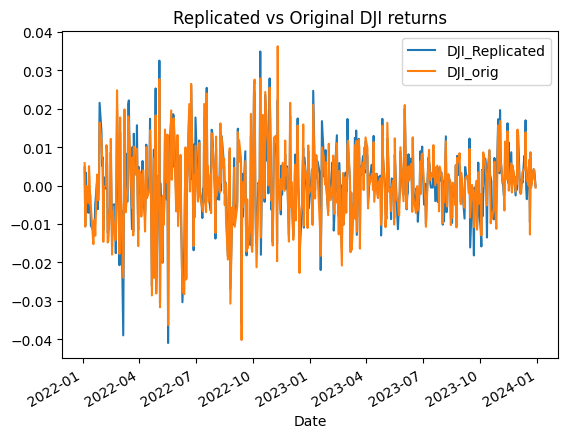

In [338]:
df_dji_sparse.plot()
plt.title("Replicated vs Original DJI returns")
plt.show();

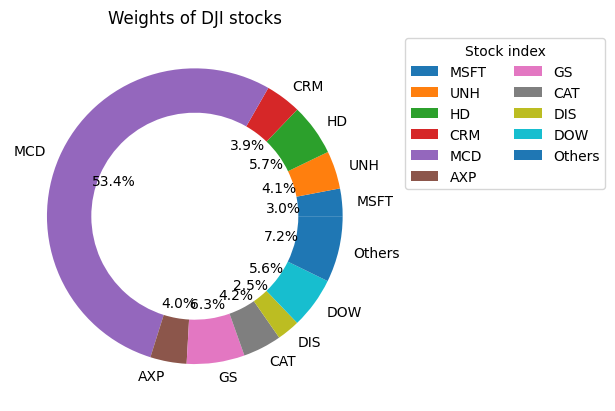

In [339]:
important_pesos=[abs(x) for x in opt_w if x>0.025]
important_labels=[stock for stock, x in zip(dji_stocks, opt_w) if x>0.025]
peso_resto=sum([abs(x) for x in opt_w if x<0.025])
important_pesos.append(peso_resto)
important_labels.append('Others')
plt.pie(important_pesos, labels=important_labels, autopct='%1.1f%%', wedgeprops=dict(width=0.3))
plt.title('Weights of DJI stocks')
plt.legend(title='Stock index', bbox_to_anchor=(1.05, 1), loc='upper left', ncol=2)
plt.show()

### 4th Method: Allocation using Non-Negative Least Squares (NNLS) Optimization


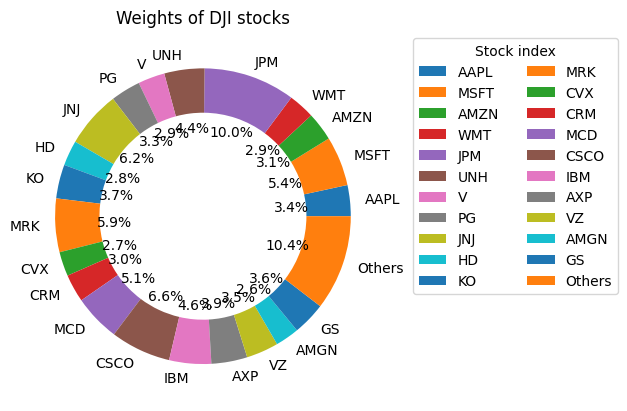

In [340]:
df_dji.fillna(0, inplace=True)
result = nnls(df_dji_returns, list(df_dji_index_returns['^DJI']))
weights = result[0]
weights_nnls=weights
factor=result[1]
weights_plotting=[abs(x) for x in weights_nnls if x>0.025]
important_labels=[stock for stock, x in zip(dji_stocks, weights_plotting) if x>0.025]
peso_resto=sum([abs(x) for x in weights_nnls if x<0.025])
weights_plotting.append(peso_resto)
important_labels.append('Others')
plt.pie(weights_plotting, labels=important_labels, autopct='%1.1f%%', wedgeprops=dict(width=0.3))
plt.title('Weights of DJI stocks')
plt.legend(title='Stock index', bbox_to_anchor=(1.05, 1), loc='upper left', ncol=2)
plt.show()

In [341]:
df_dji_nnls=pd.DataFrame(df_dji_returns.mul(weights, axis=1).sum(axis=1))
df_dji_nnls.rename(columns={0:'DJI_NNLS'}, inplace=True)
df_dji_nnls['DJI_orig']=df_dji_index_returns
df_dji_nnls.head()

,DJI_NNLS,DJI_orig
Date,,
2022-01-04 00:00:00+00:00,0.005907,0.005848
2022-01-05 00:00:00+00:00,-0.009385,-0.010724
2022-01-06 00:00:00+00:00,-0.004548,-0.004698
2022-01-07 00:00:00+00:00,0.000032,-0.000133
2022-01-10 00:00:00+00:00,-0.003818,-0.004503


### 5th Sparse Index Replication with Sequential MonteCarlo

This method is created in a different notebook due to its complexity

### Allocation using Non-Negative Least Squares (NNLS) Optimization to compare with sparse index replication


[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%********

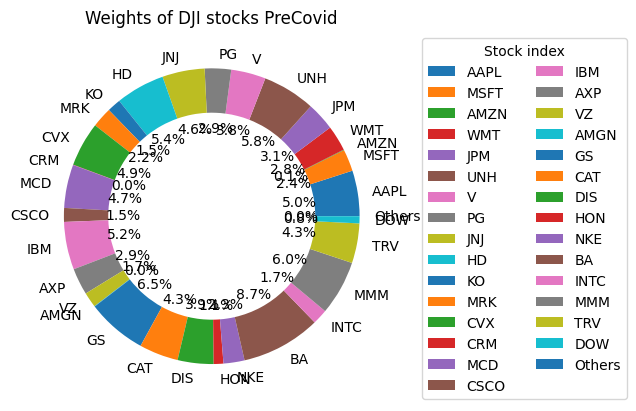

In [342]:
start_date1='2015-04-01'
end_date1='2020-01-31'
start_date2='2020-02-03'
end_date2='2024-09-30'


dji_stocks=['AAPL' , 'MSFT' , 'AMZN' , 'WMT' , 'JPM' , 'UNH' , 'V' , 'PG' , 'JNJ' , 'HD' , 'KO' , 'MRK' , 'CVX' , 'CRM' , 'MCD' , 'CSCO' , 'IBM' , 'AXP' , 'VZ' , 'AMGN' , 'GS' , 'CAT' , 'DIS' , 'HON' , 'NKE' , 'BA' , 'INTC' , 'MMM' , 'TRV' , 'DOW']
num_stocks=len(dji_stocks)
lista_df_pre, df_dji_pre, df_dji_returns_pre=extract_data(dji_stocks, start_date1, end_date1 )
lista_df_index_pre, df_dji_index_pre, df_dji_index_returns_pre=extract_data(['^DJI'], start_date1, end_date1 )
df_dji_index_returns_pre=df_dji_index_returns_pre[1:]
df_dji_index_returns_pre.fillna(0, inplace=True)
df_dji_returns_pre=df_dji_returns_pre[1:]
df_dji_returns_pre.fillna(0, inplace=True)
result = nnls(df_dji_returns_pre, list(df_dji_index_returns_pre['^DJI']))
weights_pre = result[0]
weights_nnls_pre=weights_pre
factor_pre=result[1]
weights_plotting=[abs(x) for x in weights_nnls_pre ]
important_labels=[stock for stock, x in zip(dji_stocks, weights_plotting) ]
peso_resto=sum([abs(x) for x in weights_pre if x<0])
weights_plotting.append(peso_resto)
important_labels.append('Others')
plt.pie(weights_plotting, labels=important_labels, autopct='%1.1f%%', wedgeprops=dict(width=0.3))
plt.title('Weights of DJI stocks PreCovid')
plt.legend(title='Stock index', bbox_to_anchor=(1.05, 1), loc='upper left', ncol=2)
plt.show()

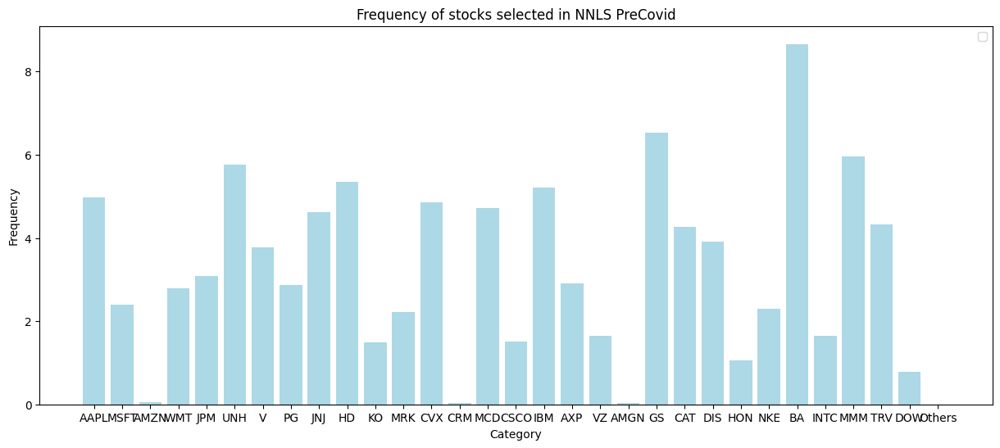

In [343]:
plt.figure(figsize=(15,6))
plt.bar(x=important_labels, height=[x*100 for x in weights_plotting], color='lightblue')
plt.legend()
plt.xlabel('Category')
plt.title('Frequency of stocks selected in NNLS PreCovid')
plt.ylabel('Frequency')

plt.show()

In [344]:
dji_stocks=['AAPL' , 'MSFT' , 'AMZN' , 'WMT' , 'JPM' , 'UNH' , 'V' , 'PG' , 'JNJ' , 'HD' , 'KO' , 'MRK' , 'CVX' , 'CRM' , 'MCD' , 'CSCO' , 'IBM' , 'AXP' , 'VZ' , 'AMGN' , 'GS' , 'CAT' , 'DIS' , 'HON' , 'NKE' , 'BA' , 'INTC' , 'MMM' , 'TRV' , 'DOW']
num_stocks=len(dji_stocks)
lista_df_post, df_dji_post, df_dji_returns_post=extract_data(dji_stocks, start_date2, end_date2 )
lista_df_index_post, df_dji_index_post, df_dji_index_returns_post=extract_data(['^DJI'], start_date2, end_date2 )
df_dji_index_returns_post=df_dji_index_returns_post[1:]
df_dji_index_returns_post.fillna(0, inplace=True)
df_dji_returns_post=df_dji_returns_post[1:]
df_dji_returns_post.fillna(0, inplace=True)


[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%********

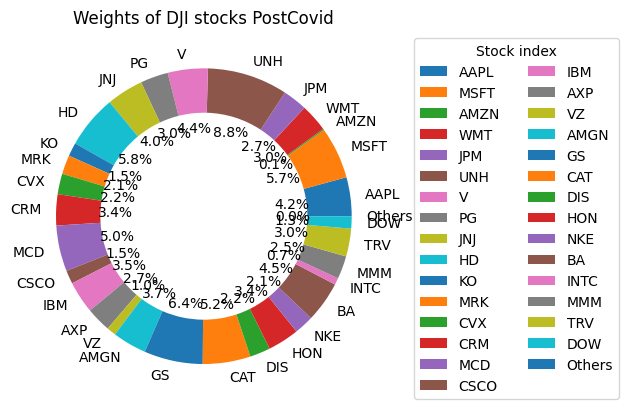

In [345]:
result = nnls(df_dji_returns_post, list(df_dji_index_returns_post['^DJI']))
weights_post = result[0]
weights_nnls_post=weights_post
factor_post=result[1]
weights_plotting=[abs(x) for x in weights_nnls_post]
important_labels=[stock for stock, x in zip(dji_stocks, weights_plotting)]
peso_resto=sum([abs(x) for x in weights_plotting if x<0])
weights_plotting.append(peso_resto)
important_labels.append('Others')
plt.pie(weights_plotting, labels=important_labels, autopct='%1.1f%%', wedgeprops=dict(width=0.3))
plt.title('Weights of DJI stocks PostCovid')
plt.legend(title='Stock index', bbox_to_anchor=(1.05, 1), loc='upper left', ncol=2)
plt.show()

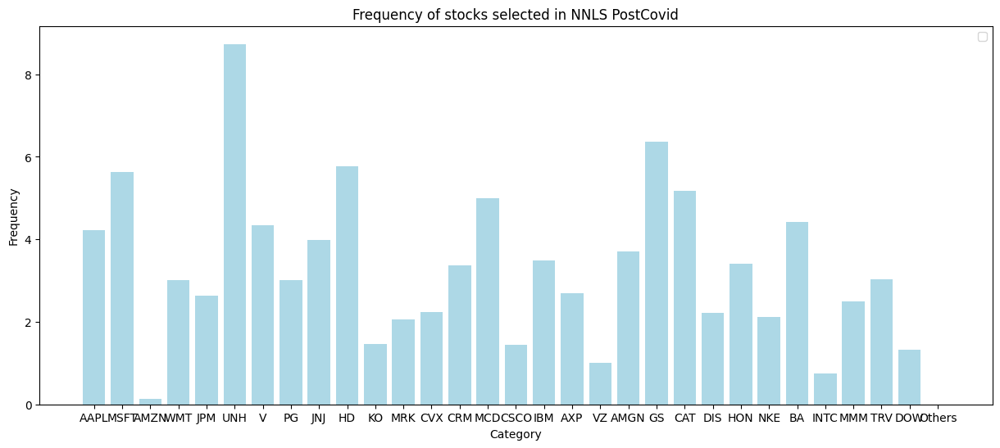

In [346]:
plt.figure(figsize=(15,6))

plt.bar(x=important_labels, height=[x*100 for x in weights_plotting], color='lightblue')
plt.legend()
plt.xlabel('Category')
plt.title('Frequency of stocks selected in NNLS PostCovid')
plt.ylabel('Frequency')

plt.show()

In [347]:
df_dji_nnls_pre=pd.DataFrame(df_dji_returns_pre.mul(weights_nnls_pre, axis=1).sum(axis=1))
df_dji_nnls_pre.rename(columns={0:'DJI_NNLS'}, inplace=True)
df_dji_nnls_pre['DJI_orig']=df_dji_index_returns_pre
df_dji_nnls_pre.head()

,DJI_NNLS,DJI_orig
Date,,
2015-04-02 00:00:00+00:00,0.003409,0.003669
2015-04-06 00:00:00+00:00,0.006688,0.006599
2015-04-07 00:00:00+00:00,0.000212,-0.000304
2015-04-08 00:00:00+00:00,0.002421,0.001514
2015-04-09 00:00:00+00:00,0.002551,0.003135


In [348]:
df_dji_nnls_post=pd.DataFrame(df_dji_returns_post.mul(weights_nnls_post, axis=1).sum(axis=1))
df_dji_nnls_post.rename(columns={0:'DJI_NNLS_POST'}, inplace=True)
df_dji_nnls_post['DJI_orig']=df_dji_index_returns_post
df_dji_nnls_post.head()

,DJI_NNLS_POST,DJI_orig
Date,,
2020-02-04 00:00:00+00:00,0.015455,0.014258
2020-02-05 00:00:00+00:00,0.016409,0.016635
2020-02-06 00:00:00+00:00,0.001339,0.003031
2020-02-07 00:00:00+00:00,-0.009195,-0.009482
2020-02-10 00:00:00+00:00,0.006154,0.005972


In [349]:
df_tracking_error_pre=(df_dji_nnls_post['DJI_orig']-df_dji_nnls_post['DJI_NNLS_POST']).apply(lambda x: np.sqrt(abs(x)/(df_dji_nnls_post['DJI_NNLS_POST'].shape[0]-1)))
df_tracking_error_post=(df_dji_nnls_pre['DJI_orig']-df_dji_nnls_pre['DJI_NNLS']).apply(lambda x: np.sqrt(abs(x)/(df_dji_nnls_pre['DJI_NNLS'].shape[0]-1)))
print('Tracking error pre: ', np.mean(df_tracking_error_pre))
print('Tracking error post: ', np.mean(df_tracking_error_post))

Tracking error pre:  0.000622851203689376
Tracking error post:  0.0005736276098322992


In [350]:
np.mean(df_tracking_error_pre)/0.00001

62.2851203689376

In [351]:
np.mean(np.mean(df_tracking_error_post))/0.00001

57.36276098322991

## Comparison of several methods


### Histogram of daily returns


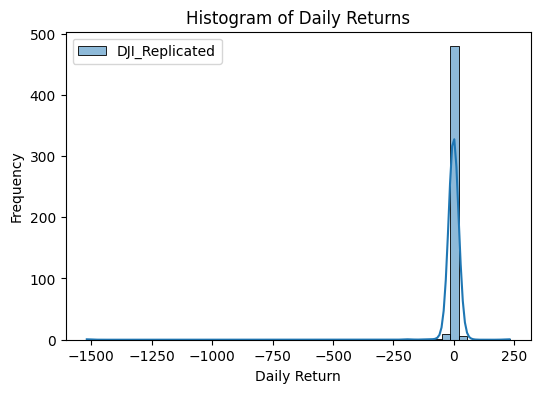

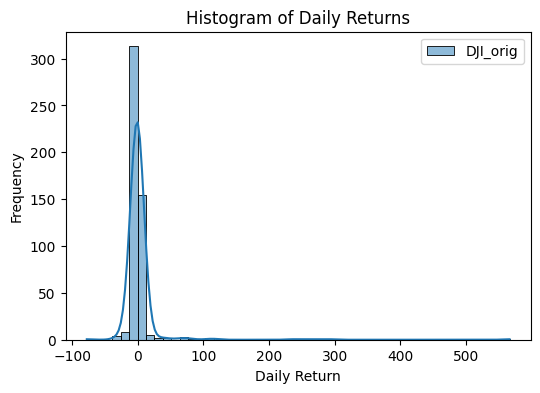

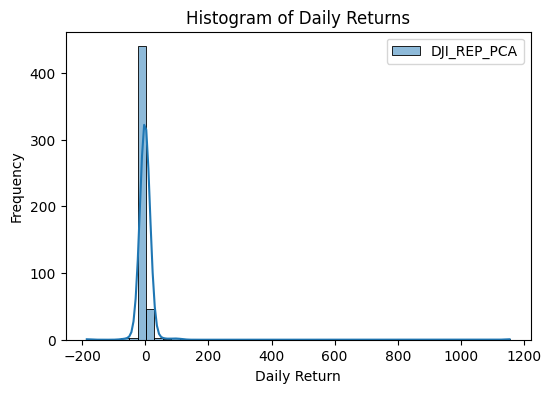

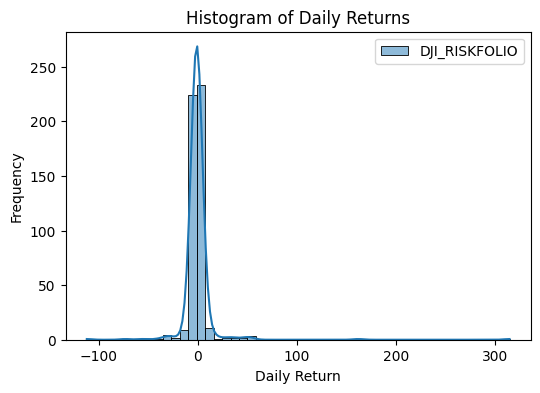

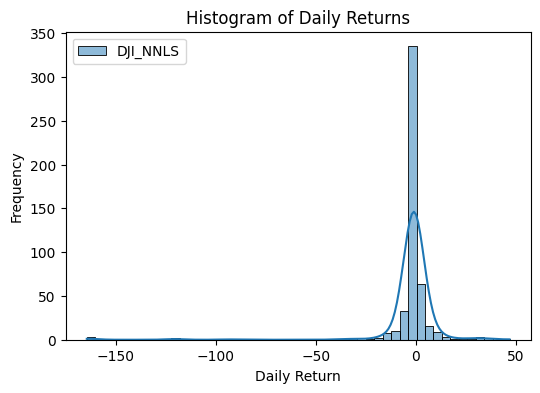

In [352]:
df_dji_comp=df_dji_sparse
df_dji_comp['DJI_REP_PCA']=df_dji_returns_replicated[['DJI_REP_PCA']]
df_dji_comp['DJI_RISKFOLIO']=df_dji_rp
df_dji_comp['DJI_NNLS']=df_dji_nnls[['DJI_NNLS']]

# Plot individual histograms for daily returns

for symbol in list(df_dji_comp.columns):
    plt.figure(figsize=(6, 4))
    returns = df_dji_comp[symbol].pct_change().dropna()
    sn.histplot(returns, bins=50, kde=True, label=symbol)
    plt.title('Histogram of Daily Returns')
    plt.xlabel('Daily Return')
    plt.ylabel('Frequency')
    plt.legend()
    plt.show()

### Difference of returns


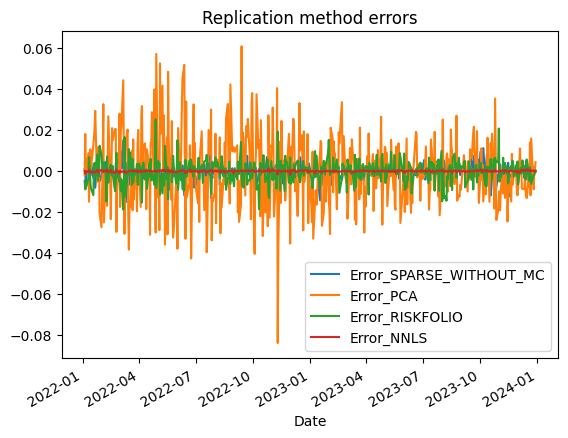

In [353]:
#Let's calculate difference between them
df_dji_comp['Error_SPARSE_WITHOUT_MC']=df_dji_comp['DJI_orig']-df_dji_comp['DJI_Replicated']
df_dji_comp['Error_PCA']=df_dji_comp['DJI_orig']-df_dji_comp['DJI_REP_PCA']
df_dji_comp['Error_RISKFOLIO']=df_dji_comp['DJI_orig']-df_dji_comp['DJI_RISKFOLIO']
df_dji_comp['Error_NNLS']=df_dji_comp['DJI_orig']-df_dji_comp['DJI_NNLS']

df_dji_comp[['Error_SPARSE_WITHOUT_MC', 'Error_PCA', 'Error_RISKFOLIO', 'Error_NNLS']].plot()
plt.title("Replication method errors")
plt.show();

### Tracking errors


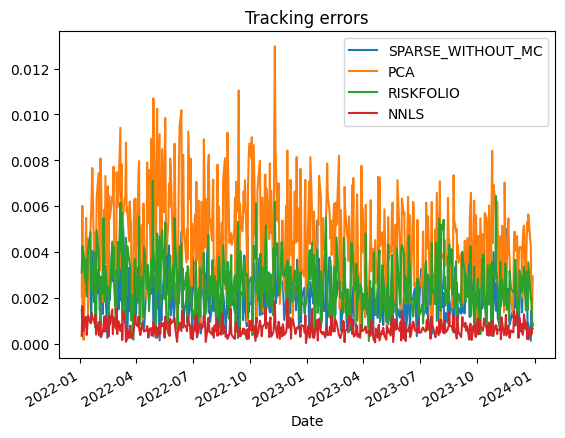

In [354]:
df_tracking_error=pd.DataFrame()
df_tracking_error['SPARSE_WITHOUT_MC']=(df_dji_comp['DJI_orig']-df_dji_comp['DJI_Replicated']).apply(lambda x: np.sqrt(abs(x)/(df_dji_comp['DJI_orig'].shape[0]-1)))
df_tracking_error['PCA']=(df_dji_comp['DJI_orig']-df_dji_comp['DJI_REP_PCA']).apply(lambda x: np.sqrt(abs(x)/(df_dji_comp['DJI_orig'].shape[0]-1)))
df_tracking_error['RISKFOLIO']=(df_dji_comp['DJI_orig']-df_dji_comp['DJI_RISKFOLIO']).apply(lambda x: np.sqrt(abs(x)/(df_dji_comp['DJI_orig'].shape[0]-1)))
df_tracking_error['NNLS']=(df_dji_comp['DJI_orig']-df_dji_comp['DJI_NNLS']).apply(lambda x: np.sqrt(abs(x)/(df_dji_comp['DJI_orig'].shape[0]-1)))
df_tracking_error.plot()
plt.title("Tracking errors")
plt.show();

In [355]:
df_tracking_error.mean()

,0
SPARSE_WITHOUT_MC,0.002143
PCA,0.004749
RISKFOLIO,0.002630
NNLS,0.000679


### Tracking differences


-0.00013648441442143852
0.0001766935748832974
-0.0003199146392321459
-0.00010519293049968335


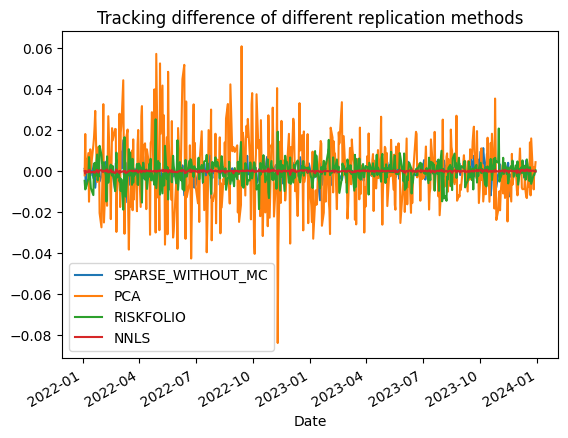

In [356]:
df_tracking_difference=pd.DataFrame()
df_tracking_difference['SPARSE_WITHOUT_MC']=(df_dji_comp['DJI_orig']-df_dji_comp['DJI_Replicated'])
df_tracking_difference['PCA']=(df_dji_comp['DJI_orig']-df_dji_comp['DJI_REP_PCA'])
df_tracking_difference['RISKFOLIO']=(df_dji_comp['DJI_orig']-df_dji_comp['DJI_RISKFOLIO'])
df_tracking_difference['NNLS']=(df_dji_comp['DJI_orig']-df_dji_comp['DJI_NNLS'])
print(df_tracking_difference['SPARSE_WITHOUT_MC'].mean())
print(df_tracking_difference['PCA'].mean())
print(df_tracking_difference['RISKFOLIO'].mean())
print(df_tracking_difference['NNLS'].mean())
df_tracking_difference.plot()
plt.title("Tracking difference of different replication methods")
plt.show();

In [357]:
df_tracking_difference.mean()

,0
SPARSE_WITHOUT_MC,-0.000136
PCA,0.000177
RISKFOLIO,-0.000320
NNLS,-0.000105


### Total Performance


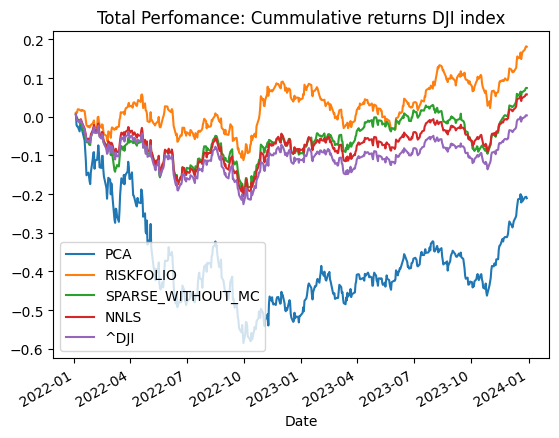

In [358]:
df_cummreturn=pd.DataFrame()
df_cummreturn['PCA']=(1 + df_dji_comp['DJI_REP_PCA'].fillna(0)).cumprod() - 1
df_cummreturn['RISKFOLIO']=(1 + df_dji_comp['DJI_RISKFOLIO'].fillna(0)).cumprod() - 1
df_cummreturn['SPARSE_WITHOUT_MC']=(1 + df_dji_comp['DJI_Replicated'].fillna(0)).cumprod() - 1
df_cummreturn['NNLS']=(1 + df_dji_comp['DJI_NNLS'].fillna(0)).cumprod() - 1
df_cummreturn['^DJI']=(1 + df_dji_comp['DJI_orig'].fillna(0)).cumprod() - 1
df_cummreturn.plot()
plt.title("Total Perfomance: Cummulative returns DJI index")
plt.show();

In [359]:
df_cummreturn.mean()

,0
PCA,-0.375756
RISKFOLIO,0.025993
SPARSE_WITHOUT_MC,-0.059125
NNLS,-0.070226
^DJI,-0.099167


### Sharpe index


Sharpe Ratios: 
Original index:  -0.4847162302232263
Replication with PCA index:  -0.19230061595216463
Replication with Riskfolio index:  -0.48195323637228255
Replication with Sparse without MonteCarlo index:  -0.4711716459032798
Replication with NNLS index:  -0.4747813834467064


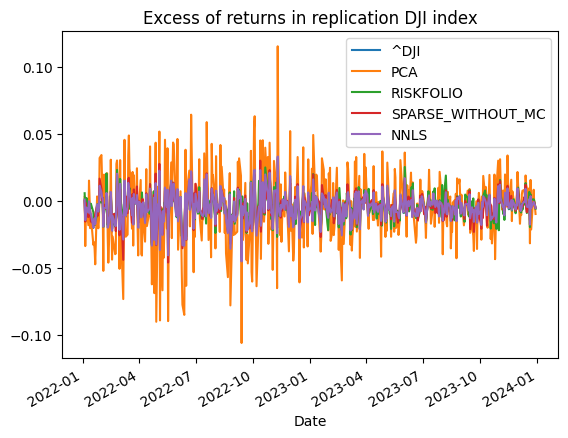

In [360]:
# Suppose risk free rate for example 0.5%
risk_free_rate=0.5/100
excess_return=pd.DataFrame()
excess_return['^DJI']=df_dji_comp['DJI_orig']-risk_free_rate
excess_return['PCA']=df_dji_comp['DJI_REP_PCA']-risk_free_rate
excess_return['RISKFOLIO']=df_dji_comp['DJI_RISKFOLIO']-risk_free_rate
excess_return['SPARSE_WITHOUT_MC']=df_dji_comp['DJI_Replicated']-risk_free_rate
excess_return['NNLS']=df_dji_comp['DJI_NNLS']-risk_free_rate
sharpe_ratio_orig=np.mean(excess_return['^DJI'])/np.std(excess_return['^DJI'])
sharpe_ratio_pca=np.mean(excess_return['PCA'])/np.std(excess_return['PCA'])
sharpe_ratio_riskfolio=np.mean(excess_return['RISKFOLIO'])/np.std(excess_return['RISKFOLIO'])
sharpe_ratio_sparse_without_mc=np.mean(excess_return['SPARSE_WITHOUT_MC'])/np.std(excess_return['SPARSE_WITHOUT_MC'])
sharpe_ratio_nnls=np.mean(excess_return['NNLS'])/np.std(excess_return['NNLS'])
print('Sharpe Ratios: ')
print('Original index: ', sharpe_ratio_orig)
print('Replication with PCA index: ', sharpe_ratio_pca)
print('Replication with Riskfolio index: ', sharpe_ratio_riskfolio)
print('Replication with Sparse without MonteCarlo index: ', sharpe_ratio_sparse_without_mc)
print('Replication with NNLS index: ', sharpe_ratio_nnls)
excess_return.plot()
plt.title("Excess of returns in replication DJI index")
plt.show();


### Comparison of prices: Costs


In [361]:
df_prices=pd.DataFrame()
df_prices['SPARSE_WITHOUT_MC']=pd.DataFrame(df_dji.mul(weights_sparse_withoutMC, axis=1).sum(axis=1))
df_prices['PCA']=pd.DataFrame(df_dji.mul(weights_pca, axis=1).sum(axis=1))
df_prices['RISKFOLIO']=pd.DataFrame(df_dji.mul(weights_riskfolio, axis=1).sum(axis=1))
df_prices['NNLS']=pd.DataFrame(df_dji.mul(weights_nnls, axis=1).sum(axis=1))
df_prices['^DJI']=df_dji_index

df_prices.head()

,SPARSE_WITHOUT_MC,PCA,RISKFOLIO,NNLS,^DJI
Date,,,,,
2022-01-03 00:00:00+00:00,251.691417,341.676511,193.157679,231.977110,36585.058594
2022-01-04 00:00:00+00:00,252.413172,342.858092,195.255282,232.651623,36799.648438
2022-01-05 00:00:00+00:00,249.555979,335.872576,194.657739,229.835638,36407.109375
2022-01-06 00:00:00+00:00,249.927129,334.872452,195.365671,227.768578,36236.468750
2022-01-07 00:00:00+00:00,247.791549,334.245858,196.632543,226.629997,36231.660156


In [362]:
df_prices.describe()

,SPARSE_WITHOUT_MC,PCA,RISKFOLIO,NNLS,^DJI
count,501.000000,501.000000,501.000000,501.000000,501.000000
mean,241.166879,287.986548,200.181483,219.387841,33508.219284
std,15.002448,24.295657,11.889071,11.491270,1600.230744
min,207.728986,233.211156,172.958807,191.418847,28725.509766
25%,230.631549,270.723969,190.580859,212.447305,32799.921875
50%,240.459155,288.216108,198.878402,220.153327,33666.339844
75%,253.689098,305.209398,209.863610,225.022825,34440.878906
max,278.691988,348.569279,232.893059,253.395038,37710.101562


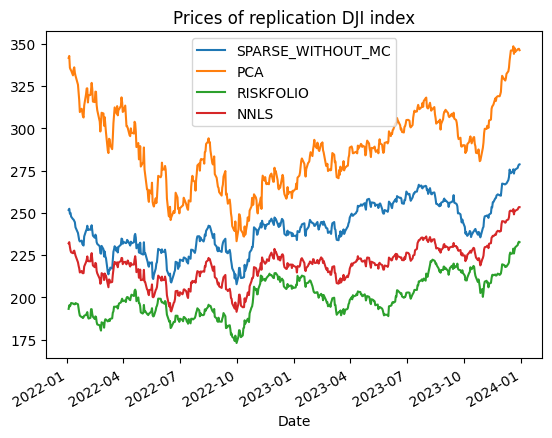

In [363]:
df_prices[['SPARSE_WITHOUT_MC', 'PCA', 'RISKFOLIO', 'NNLS']].plot()
plt.title("Prices of replication DJI index")
plt.show();

In [364]:
df_prices.mean()

,0
SPARSE_WITHOUT_MC,241.166879
PCA,287.986548
RISKFOLIO,200.181483
NNLS,219.387841
^DJI,33508.219284


### Liquidity


In [365]:
df_volumen=extract_liq(dji_stocks, start_date, end_date)
df_volumen_index=yf.download('^DJI', start=start_date, end=end_date)['Volume']
df_liq=pd.DataFrame()
df_liq['SPARSE_WITHOUT_MC']=pd.DataFrame(df_volumen.mul(weights_sparse_withoutMC, axis=1).sum(axis=1))
df_liq['PCA']=pd.DataFrame(df_volumen.mul(weights_pca, axis=1).sum(axis=1))
df_liq['RISKFOLIO']=pd.DataFrame(df_volumen.mul(weights_riskfolio, axis=1).sum(axis=1))
df_liq['NNLS']=pd.DataFrame(df_volumen.mul(weights_nnls, axis=1).sum(axis=1))
df_liq['^DJI']=df_volumen_index
df_liq.head()

[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%********

,SPARSE_WITHOUT_MC,PCA,RISKFOLIO,NNLS,^DJI
Date,,,,,
2022-01-03 00:00:00+00:00,7.109721e+06,3.793897e+07,5.359778e+06,1.052509e+07,347930000
2022-01-04 00:00:00+00:00,8.003472e+06,4.561373e+07,7.013893e+06,1.261128e+07,435080000
2022-01-05 00:00:00+00:00,8.322500e+06,4.771947e+07,7.260766e+06,1.340739e+07,462040000
2022-01-06 00:00:00+00:00,7.662474e+06,3.772844e+07,6.280682e+06,1.171552e+07,385890000
2022-01-07 00:00:00+00:00,6.606974e+06,3.432299e+07,5.700031e+06,1.080484e+07,356110000


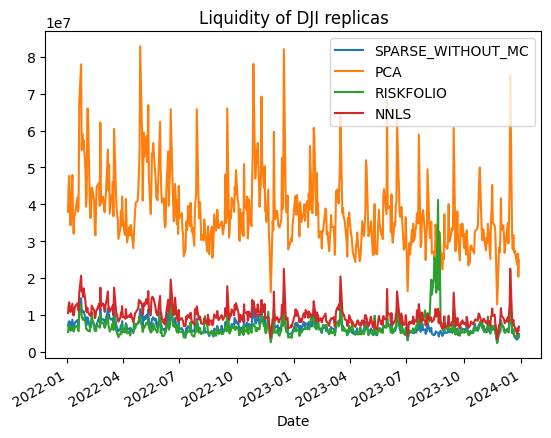

In [366]:
df_liq[['SPARSE_WITHOUT_MC', 'PCA', 'RISKFOLIO', 'NNLS']].plot()
plt.title("Liquidity of DJI replicas")
plt.show();

In [367]:
df_liq.mean()

,0
SPARSE_WITHOUT_MC,6.822783e+06
PCA,3.776015e+07
RISKFOLIO,6.781864e+06
NNLS,9.818382e+06
^DJI,3.409096e+08


# NIFTY 50 (NSEI) (INDIA)

Let's apply the same method to different indexes: in this case NIFTY 50 from another BRICS' country India

## Replication methods

### 1st Method: Riskfolio-Lib


[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%********

<Figure size 10000x1000 with 0 Axes>

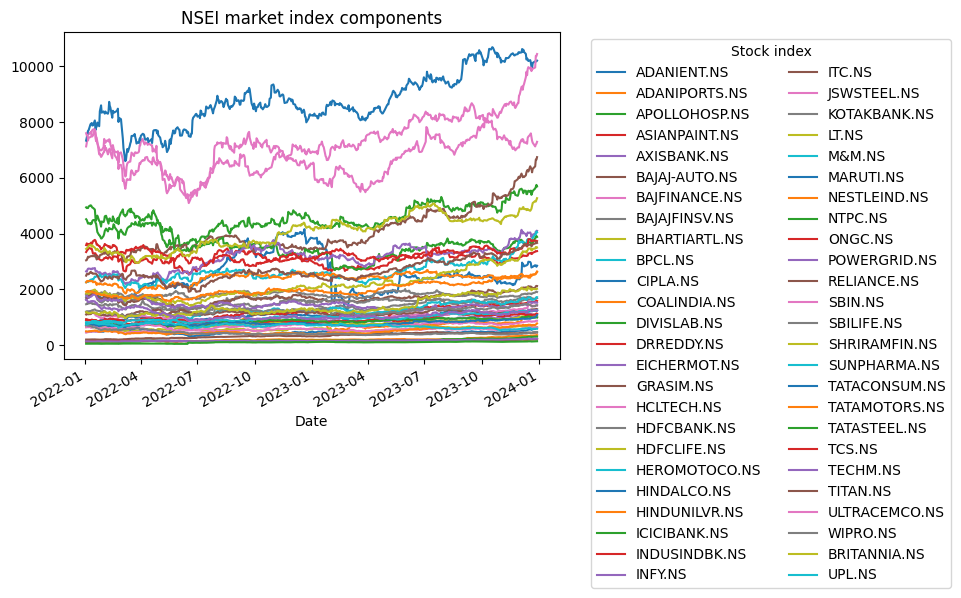

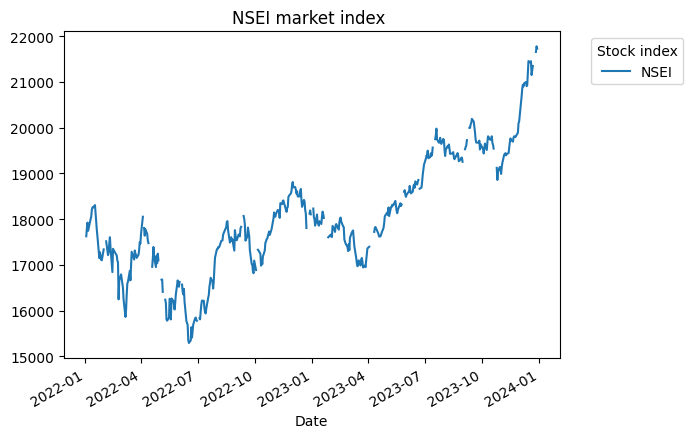

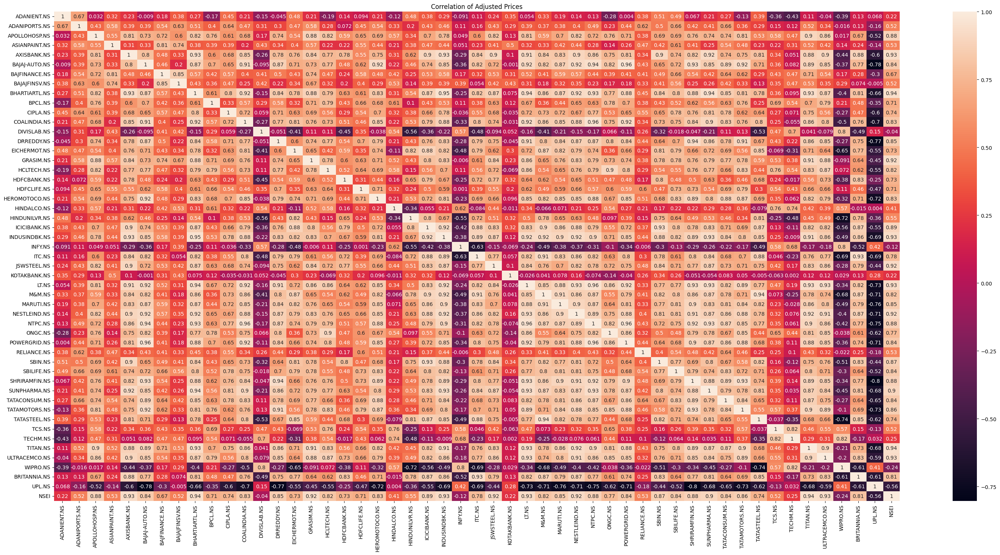

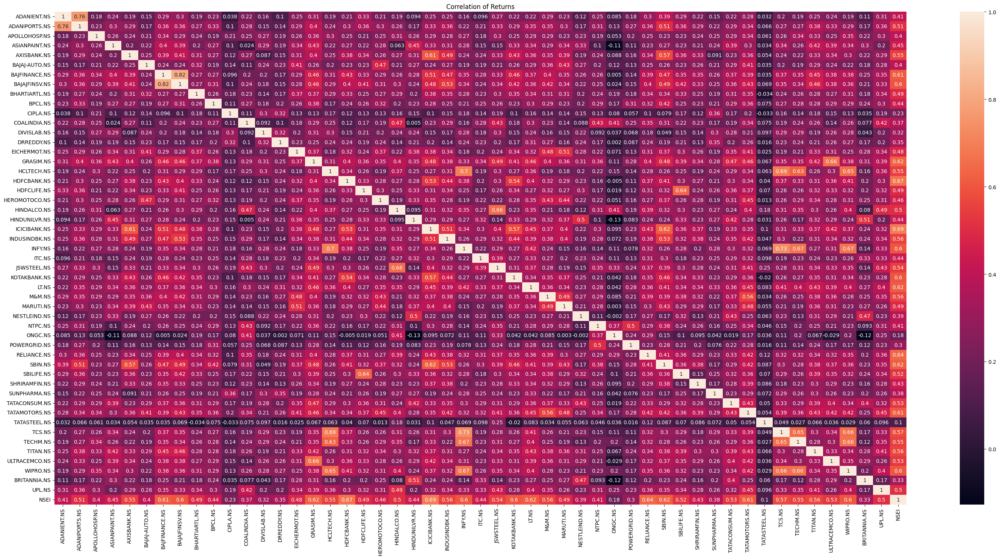

[*********************100%***********************]  51 of 51 completed


,ADANIENT.NS,ADANIPORTS.NS,APOLLOHOSP.NS,ASIANPAINT.NS,AXISBANK.NS,BAJAJ-AUTO.NS,BAJFINANCE.NS,BAJAJFINSV.NS,BHARTIARTL.NS,BPCL.NS,...,TATAMOTORS.NS,TATASTEEL.NS,TCS.NS,TECHM.NS,TITAN.NS,ULTRACEMCO.NS,WIPRO.NS,BRITANNIA.NS,UPL.NS,NSEI
Date,,,,,,,,,,,,,,,,,,,,,
2022-01-03 00:00:00+00:00,1714.013916,723.542847,4939.935547,3337.237305,693.329041,3040.009521,7127.191895,1695.554688,681.297241,171.284393,...,494.527863,48.207249,3584.808105,1622.110474,2490.153809,7599.804688,708.348572,3451.341064,740.169067,17625.699219
2022-01-04 00:00:00+00:00,1715.860474,726.145874,4914.297852,3373.219238,706.073547,3051.187500,7249.012207,1710.946289,687.358276,171.217865,...,486.577271,48.475189,3647.719971,1626.654663,2548.514160,7527.437012,711.108215,3471.280518,737.796143,17805.250000
2022-01-05 00:00:00+00:00,1712.316895,741.518494,4922.859863,3439.039795,723.746582,3115.566650,7572.616211,1796.111938,689.871277,175.099594,...,486.726318,49.690453,3625.371826,1579.167480,2541.755371,7536.488281,703.223389,3491.554443,740.459656,17925.250000
2022-01-06 00:00:00+00:00,1709.971313,726.686096,4914.148926,3427.191895,727.131775,3170.900879,7649.075195,1795.922363,700.120850,175.587585,...,485.831909,49.084930,3575.136475,1537.860229,2561.241699,7338.717773,695.585083,3506.247070,758.135803,17745.900391
2022-01-07 00:00:00+00:00,1695.996826,723.051697,4970.967773,3487.307861,727.430542,3147.060547,7561.313477,1772.996948,694.503357,175.765045,...,487.571106,48.962559,3618.376465,1548.539185,2538.351318,7436.521484,701.252258,3565.636719,764.140808,17812.699219


In [368]:
nsei_stocks=['ADANIENT.NS' , 'ADANIPORTS.NS' , 'APOLLOHOSP.NS' , 'ASIANPAINT.NS' , 'AXISBANK.NS' , 'BAJAJ-AUTO.NS' , 'BAJFINANCE.NS' , 'BAJAJFINSV.NS' , 'BHARTIARTL.NS' , 'BPCL.NS' , 'CIPLA.NS' , 'COALINDIA.NS' , 'DIVISLAB.NS' , 'DRREDDY.NS' , 'EICHERMOT.NS' , 'GRASIM.NS' , 'HCLTECH.NS' , 'HDFCBANK.NS' , 'HDFCLIFE.NS' , 'HEROMOTOCO.NS' , 'HINDALCO.NS' , 'HINDUNILVR.NS' , 'ICICIBANK.NS' , 'INDUSINDBK.NS' , 'INFY.NS' , 'ITC.NS' , 'JSWSTEEL.NS' , 'KOTAKBANK.NS' , 'LT.NS' , 'M&M.NS' , 'MARUTI.NS' , 'NESTLEIND.NS' , 'NTPC.NS' , 'ONGC.NS' , 'POWERGRID.NS' , 'RELIANCE.NS' , 'SBIN.NS' , 'SBILIFE.NS' , 'SHRIRAMFIN.NS' , 'SUNPHARMA.NS' , 'TATACONSUM.NS' , 'TATAMOTORS.NS' , 'TATASTEEL.NS' , 'TCS.NS' , 'TECHM.NS' , 'TITAN.NS' , 'ULTRACEMCO.NS' , 'WIPRO.NS' , 'BRITANNIA.NS' , 'UPL.NS']
df_nsei, df_nsei_returns= get_correlations('NSEI', 'AS', nsei_stocks, start_date, end_date)
w, frontier, port=get_data_rp(nsei_stocks, '^NSEI', "2021-01-01", "2023-12-31")
df_nsei.head()

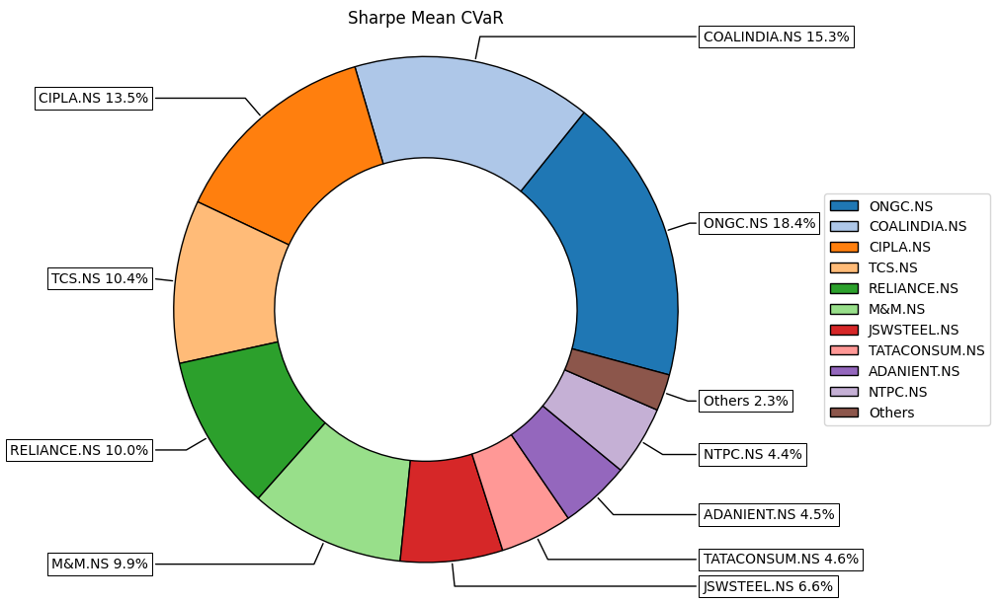

In [369]:
g2=rp.plot_pie(w=w,title="Sharpe Mean CVaR",others=0.05,nrow=25,cmap="tab20",height=6,width=10);

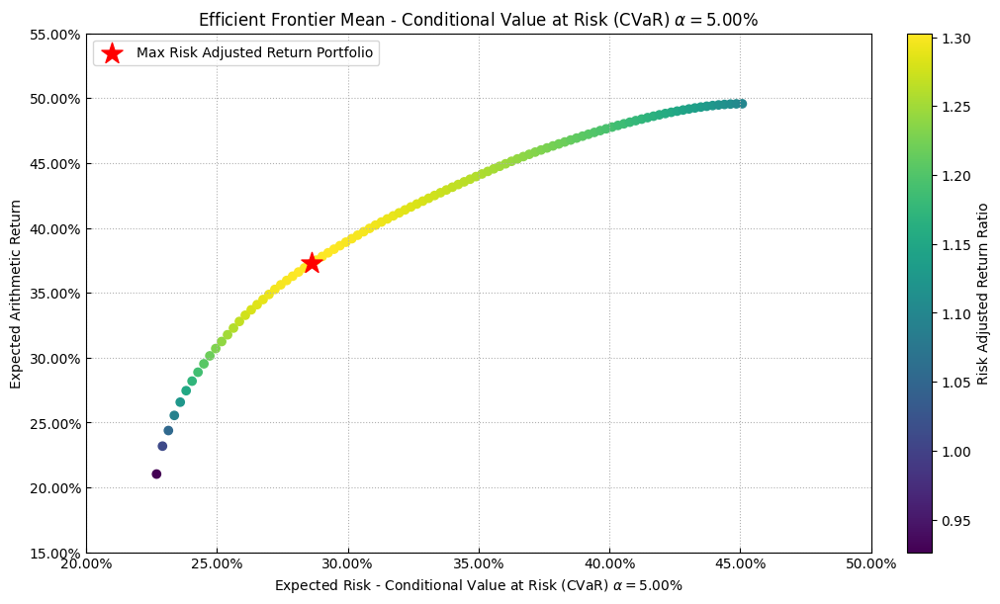

In [370]:
g1 = rp.plot_frontier(w_frontier=frontier,mu=port.mu,cov=port.cov,returns=port.returns,rm="CVaR",rf=0,cmap="viridis",w=w,label="Max Risk Adjusted Return Portfolio",marker="*")


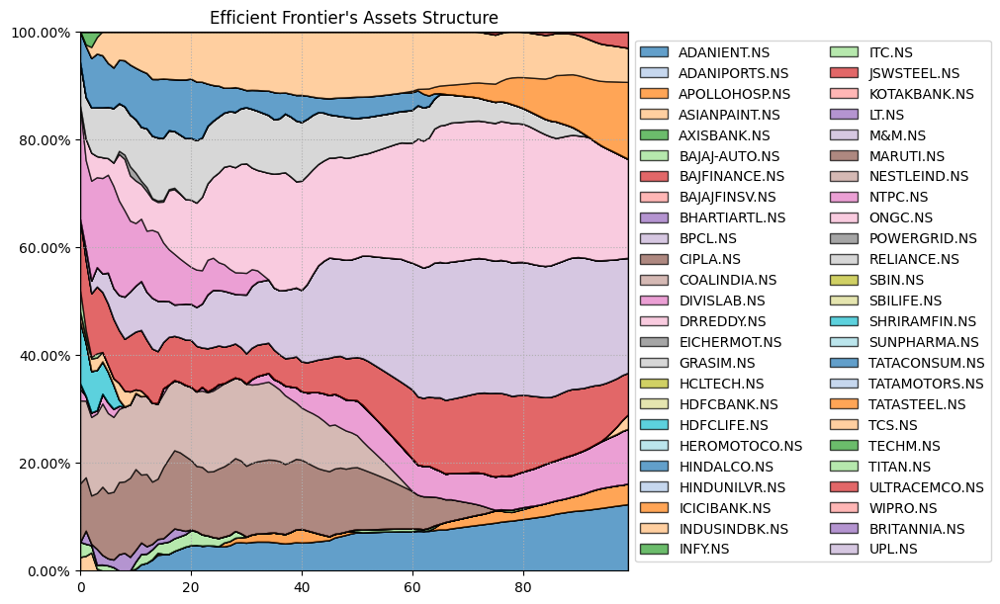

In [371]:
g3 = rp.plot_frontier_area(w_frontier=frontier, cmap="tab20", height=6, width=10, ax=None)

In [372]:
df_nsei_rp=pd.DataFrame(df_nsei_returns.iloc[:, :-1].mul(list(w['weights']), axis=1).sum(axis=1))
df_nsei_rp.rename(columns={0:'NSEI_Replicated_Riskfolio'}, inplace=True)
weights_riskfolio=list(w['weights'])
df_nsei_rp.head()

,NSEI_Replicated_Riskfolio
Date,
2022-01-04 00:00:00+00:00,0.009498
2022-01-05 00:00:00+00:00,0.007130
2022-01-06 00:00:00+00:00,-0.005712
2022-01-07 00:00:00+00:00,0.009975
2022-01-10 00:00:00+00:00,0.009190


### 2nd Method: Give weights with Principal Component Analysis


[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%********

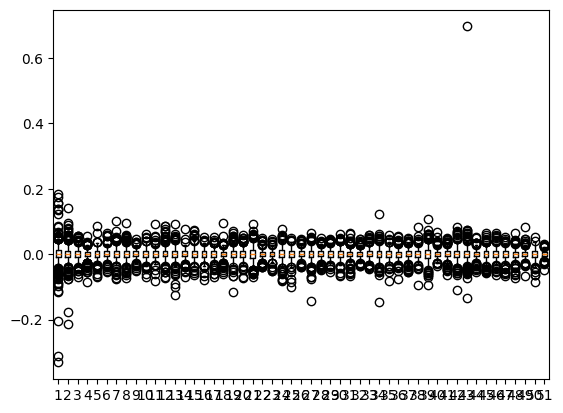

In [373]:
nsei_stocks=['ADANIENT.NS' , 'ADANIPORTS.NS' , 'APOLLOHOSP.NS' , 'ASIANPAINT.NS' , 'AXISBANK.NS' , 'BAJAJ-AUTO.NS' , 'BAJFINANCE.NS' , 'BAJAJFINSV.NS' , 'BHARTIARTL.NS' , 'BPCL.NS' , 'CIPLA.NS' , 'COALINDIA.NS' , 'DIVISLAB.NS' , 'DRREDDY.NS' , 'EICHERMOT.NS' , 'GRASIM.NS' , 'HCLTECH.NS' , 'HDFCBANK.NS' , 'HDFCLIFE.NS' , 'HEROMOTOCO.NS' , 'HINDALCO.NS' , 'HINDUNILVR.NS' , 'ICICIBANK.NS' , 'INDUSINDBK.NS' , 'INFY.NS' , 'ITC.NS' , 'JSWSTEEL.NS' , 'KOTAKBANK.NS' , 'LT.NS' , 'M&M.NS' , 'MARUTI.NS' , 'NESTLEIND.NS' , 'NTPC.NS' , 'ONGC.NS' , 'POWERGRID.NS' , 'RELIANCE.NS' , 'SBIN.NS' , 'SBILIFE.NS' , 'SHRIRAMFIN.NS' , 'SUNPHARMA.NS' , 'TATACONSUM.NS' , 'TATAMOTORS.NS' , 'TATASTEEL.NS' , 'TCS.NS' , 'TECHM.NS' , 'TITAN.NS' , 'ULTRACEMCO.NS' , 'WIPRO.NS' , 'BRITANNIA.NS' , 'UPL.NS', '^NSEI']
num_stocks=len(nsei_stocks)


lista_df, df_nsei, df_nsei_returns=extract_data(nsei_stocks, start_date, end_date )
df_nsei_returns=df_nsei_returns.iloc[1:, :]
df_nsei_returns.fillna(0, inplace=True)
plt.boxplot(df_nsei_returns)
plt.show()

In [374]:
scaler=StandardScaler()
df_nsei_returns.iloc[:, :-1]=df_nsei_returns.iloc[:, :-1].replace(np.inf, np.nan)
df_nsei_returns.iloc[:, :-1]=df_nsei_returns.iloc[:, :-1].replace(-np.inf, np.nan)
df_nsei_returns.iloc[:, :-1]=df_nsei_returns.iloc[:, :-1].fillna(0)
pca = PCA(random_state=42)
pca.fit(df_nsei_returns.iloc[:, :-1])

# Calcular la varianza explicada y los pesos
variance = pca.explained_variance_ratio_
pesos = pca.components_.T @ variance
weights_pca=pesos
df_nsei_returns_replicated=df_nsei_returns.copy()
for i in range(len(pesos)):
  df_nsei_returns_replicated.iloc[:, i]=df_nsei_returns_replicated.iloc[:, i]*pesos[i]
df_nsei_returns_replicated['NSEI_REP_PCA']=df_nsei_returns_replicated.iloc[:,:-1].sum(axis=1)
df_nsei_returns_replicated=df_nsei_returns_replicated[['NSEI_REP_PCA', '^NSEI']]
df_nsei_returns_replicated.head()

,NSEI_REP_PCA,^NSEI
Date,,
2022-01-04 00:00:00+00:00,0.010156,0.010135
2022-01-05 00:00:00+00:00,0.011807,0.006717
2022-01-06 00:00:00+00:00,-0.012217,-0.010056
2022-01-07 00:00:00+00:00,0.008254,0.003757
2022-01-10 00:00:00+00:00,0.017369,0.010643


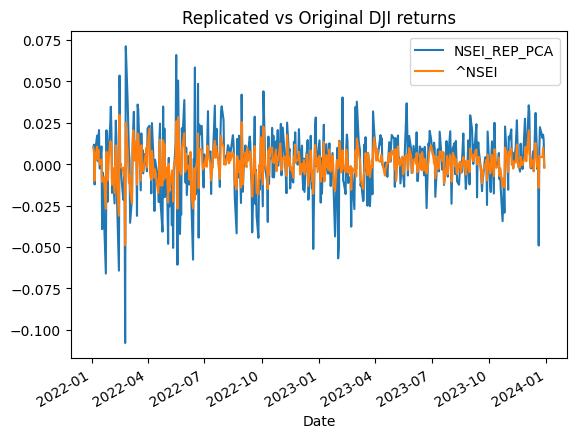

In [375]:
df_nsei_returns_replicated.plot()
plt.title("Replicated vs Original DJI returns")
plt.show();

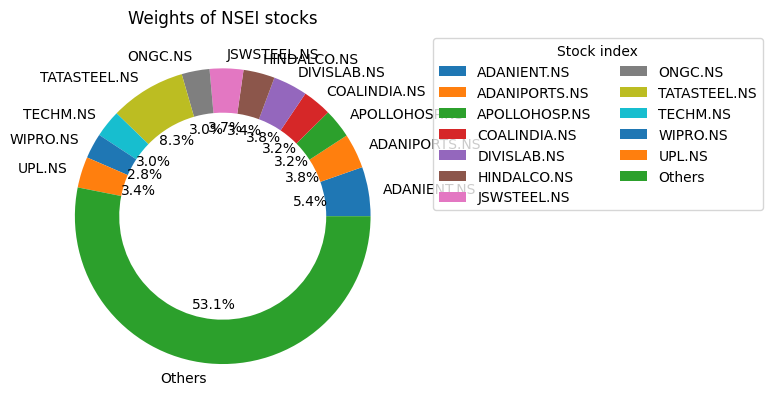

In [376]:
important_pesos=[abs(x) for x in pesos if x>0.05]
important_labels=[stock for stock, x in zip(nsei_stocks, pesos) if x>0.05]
peso_resto=sum([abs(x) for x in pesos if x<0.05])
important_pesos.append(peso_resto)
important_labels.append('Others')
plt.pie(important_pesos, labels=important_labels, autopct='%1.1f%%', wedgeprops=dict(width=0.3))
plt.title('Weights of NSEI stocks')
plt.legend(title='Stock index', bbox_to_anchor=(1.05, 1), loc='upper left', ncol=2)
plt.show()

### 3rd Method: Sparse Method without Montecarlo


In [377]:
nsei_stocks=['ADANIENT.NS' , 'ADANIPORTS.NS' , 'APOLLOHOSP.NS' , 'ASIANPAINT.NS' , 'AXISBANK.NS' , 'BAJAJ-AUTO.NS' , 'BAJFINANCE.NS' , 'BAJAJFINSV.NS' , 'BHARTIARTL.NS' , 'BPCL.NS' , 'CIPLA.NS' , 'COALINDIA.NS' , 'DIVISLAB.NS' , 'DRREDDY.NS' , 'EICHERMOT.NS' , 'GRASIM.NS' , 'HCLTECH.NS' , 'HDFCBANK.NS' , 'HDFCLIFE.NS' , 'HEROMOTOCO.NS' , 'HINDALCO.NS' , 'HINDUNILVR.NS' , 'ICICIBANK.NS' , 'INDUSINDBK.NS' , 'INFY.NS' , 'ITC.NS' , 'JSWSTEEL.NS' , 'KOTAKBANK.NS' , 'LT.NS' , 'M&M.NS' , 'MARUTI.NS' , 'NESTLEIND.NS' , 'NTPC.NS' , 'ONGC.NS' , 'POWERGRID.NS' , 'RELIANCE.NS' , 'SBIN.NS' , 'SBILIFE.NS' , 'SHRIRAMFIN.NS' , 'SUNPHARMA.NS' , 'TATACONSUM.NS' , 'TATAMOTORS.NS' , 'TATASTEEL.NS' , 'TCS.NS' , 'TECHM.NS' , 'TITAN.NS' , 'ULTRACEMCO.NS' , 'WIPRO.NS' , 'BRITANNIA.NS' , 'UPL.NS']
num_stocks=len(nsei_stocks)
lista_df, df_nsei, df_nsei_returns=extract_data(nsei_stocks, start_date, end_date )
lista_df_index, df_nsei_index, df_nsei_index_returns=extract_data(['^NSEI'], start_date, end_date )
df_nsei_index_returns=df_nsei_index_returns[1:]
df_nsei_index_returns.fillna(0, inplace=True)
df_nsei_returns=df_nsei_returns[1:]
df_nsei_returns.fillna(0, inplace=True)
index_returns=df_nsei.sum(axis=1)
index_returns=np.log(index_returns / index_returns.shift(1))
index_returns.dropna(inplace=True)
threshold= 1e-7
r=0.01
opt_value, opt_w, t, tracking_error= sparse_tracking(num_stocks, df_nsei_returns, df_nsei_index_returns['^NSEI'],  np.inf, threshold, r)
stocks_considered=np.array(nsei_stocks)[opt_w > threshold]
print('Found ', len(stocks_considered), ' stocks with weight bigger than threshold: ', stocks_considered)
weights_sparse_withoutMC=opt_w
print("Optimal weights: " ,opt_w)
print("Tracking error: ", (tracking_error)**0.5 )
print("Optimal Solution ", opt_value)

[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%********

Solution found at step 49
Found  29  stocks with weight bigger than threshold:  ['ADANIENT.NS' 'ADANIPORTS.NS' 'BAJAJ-AUTO.NS' 'BPCL.NS' 'CIPLA.NS'
 'COALINDIA.NS' 'DIVISLAB.NS' 'DRREDDY.NS' 'HCLTECH.NS' 'HDFCBANK.NS'
 'HDFCLIFE.NS' 'HINDALCO.NS' 'HINDUNILVR.NS' 'ICICIBANK.NS' 'INFY.NS'
 'ITC.NS' 'M&M.NS' 'NESTLEIND.NS' 'ONGC.NS' 'RELIANCE.NS' 'SUNPHARMA.NS'
 'TATACONSUM.NS' 'TATAMOTORS.NS' 'TCS.NS' 'TECHM.NS' 'TITAN.NS' 'WIPRO.NS'
 'BRITANNIA.NS' 'UPL.NS']
Optimal weights:  [3.94582339e-03 1.51138423e-02 2.77928750e-08 3.82118547e-08
 2.64435936e-09 1.04132803e-02 1.25850615e-08 2.05218254e-08
 2.98255653e-08 5.02148949e-03 2.35636433e-03 3.25924759e-03
 1.18981190e-02 1.95280669e-03 1.26442725e-08 2.25336222e-08
 4.31087066e-02 3.71175466e-02 1.11715165e-02 8.61794283e-09
 8.04078852e-03 1.63612800e-02 5.39548765e-01 5.08392513e-09
 4.12842799e-02 9.62272770e-03 2.03273398e-08 5.40112567e-09
 4.90598453e-08 1.75247478e-03 9.30948154e-09 1.28434144e-02
 2.00955031e-08 1.24226986e-05 1

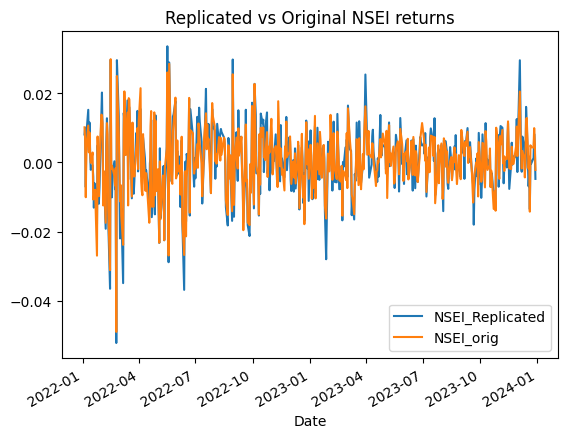

In [378]:
df_nsei_sparse=pd.DataFrame(df_nsei_returns.mul(opt_w, axis=1).sum(axis=1))
df_nsei_sparse.rename(columns={0:'NSEI_Replicated'}, inplace=True)
df_nsei_sparse['NSEI_orig']=df_nsei_index_returns
df_nsei_sparse.head()
df_nsei_sparse.plot()
plt.title("Replicated vs Original NSEI returns")
plt.show();

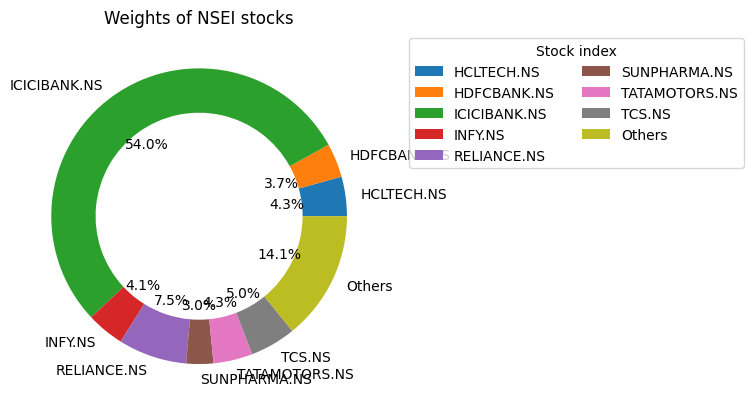

In [379]:
important_pesos=[abs(x) for x in opt_w if x>0.025]
important_labels=[stock for stock, x in zip(nsei_stocks, opt_w) if x>0.025]
peso_resto=sum([abs(x) for x in opt_w if x<0.025])
important_pesos.append(peso_resto)
important_labels.append('Others')
plt.pie(important_pesos, labels=important_labels, autopct='%1.1f%%', wedgeprops=dict(width=0.3))
plt.title('Weights of NSEI stocks')
plt.legend(title='Stock index', bbox_to_anchor=(1.05, 1), loc='upper left', ncol=2)
plt.show()

### 4th Method: Allocation using Non-Negative Least Squares (NNLS) Optimization


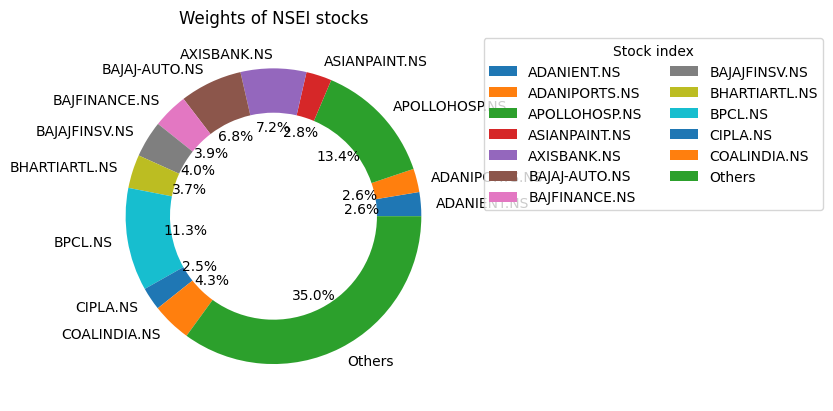

In [380]:
df_nsei.fillna(0, inplace=True)
result = nnls(df_nsei_returns, list(df_nsei_index_returns['^NSEI']))
weights = result[0]
weights_nnls=weights
factor=result[1]
weights_plotting=[abs(x) for x in weights_nnls if x>0.025]
important_labels=[stock for stock, x in zip(nsei_stocks, weights_plotting) if x>0.025]
peso_resto=sum([abs(x) for x in weights_nnls if x<0.025])
weights_plotting.append(peso_resto)
important_labels.append('Others')
plt.pie(weights_plotting, labels=important_labels, autopct='%1.1f%%', wedgeprops=dict(width=0.3))
plt.title('Weights of NSEI stocks')
plt.legend(title='Stock index', bbox_to_anchor=(1.05, 1), loc='upper left', ncol=2)
plt.show()

In [381]:
df_nsei_nnls=pd.DataFrame(df_nsei_returns.mul(weights, axis=1).sum(axis=1))
df_nsei_nnls.rename(columns={0:'NSEI_NNLS'}, inplace=True)
df_nsei_nnls['NSEI_orig']=df_nsei_index_returns
df_nsei_nnls.head()

,NSEI_NNLS,NSEI_orig
Date,,
2022-01-04 00:00:00+00:00,0.010109,0.010135
2022-01-05 00:00:00+00:00,0.008955,0.006717
2022-01-06 00:00:00+00:00,-0.009339,-0.010056
2022-01-07 00:00:00+00:00,0.004608,0.003757
2022-01-10 00:00:00+00:00,0.010039,0.010643


## Comparison of several methods


### Histogram of daily returns


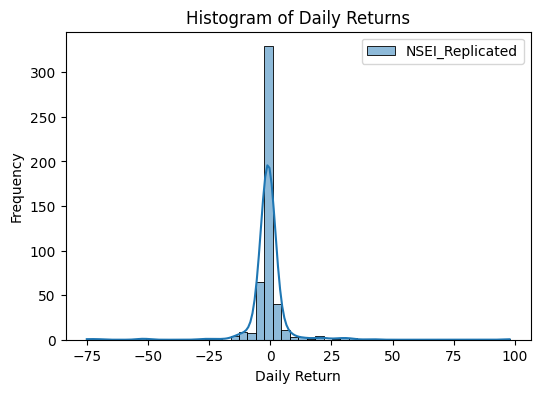

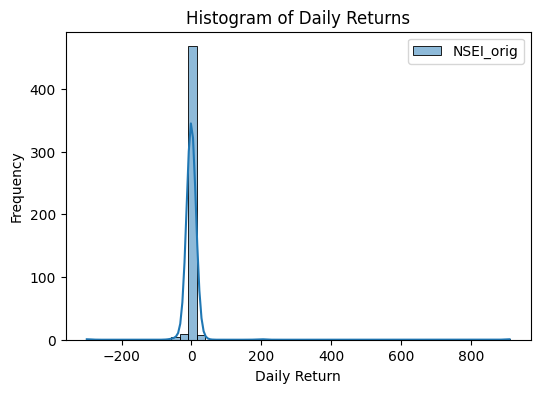

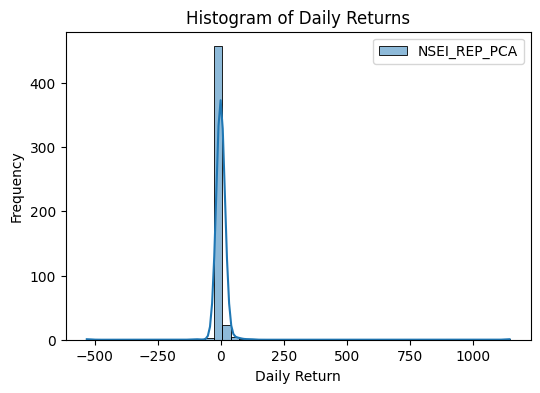

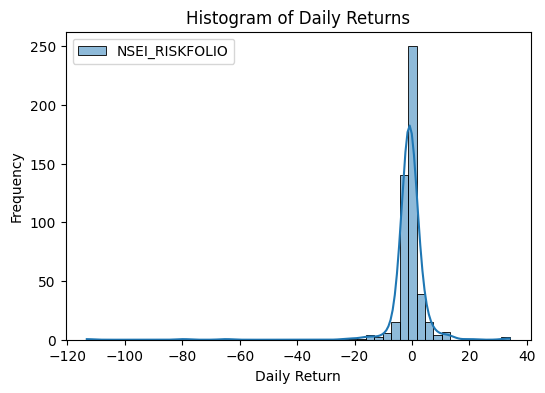

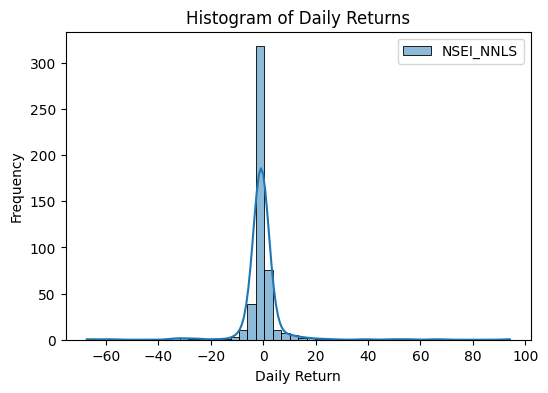

In [382]:
df_nsei_comp=df_nsei_sparse
df_nsei_comp['NSEI_REP_PCA']=df_nsei_returns_replicated[['NSEI_REP_PCA']]
df_nsei_comp['NSEI_RISKFOLIO']=df_nsei_rp
df_nsei_comp['NSEI_NNLS']=df_nsei_nnls[['NSEI_NNLS']]

# Plot individual histograms for daily returns

for symbol in list(df_nsei_comp.columns):
    plt.figure(figsize=(6, 4))
    returns = df_nsei_comp[symbol].pct_change().dropna()
    sn.histplot(returns, bins=50, kde=True, label=symbol)
    plt.title('Histogram of Daily Returns')
    plt.xlabel('Daily Return')
    plt.ylabel('Frequency')
    plt.legend()
    plt.show()

### Difference of returns


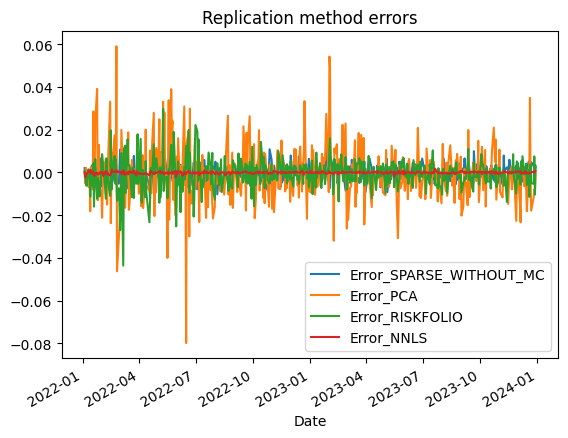

In [383]:
#Let's calculate difference between them
df_nsei_comp['Error_SPARSE_WITHOUT_MC']=df_nsei_comp['NSEI_orig']-df_nsei_comp['NSEI_Replicated']
df_nsei_comp['Error_PCA']=df_nsei_comp['NSEI_orig']-df_nsei_comp['NSEI_REP_PCA']
df_nsei_comp['Error_RISKFOLIO']=df_nsei_comp['NSEI_orig']-df_nsei_comp['NSEI_RISKFOLIO']
df_nsei_comp['Error_NNLS']=df_nsei_comp['NSEI_orig']-df_nsei_comp['NSEI_NNLS']

df_nsei_comp[['Error_SPARSE_WITHOUT_MC', 'Error_PCA', 'Error_RISKFOLIO', 'Error_NNLS']].plot()
plt.title("Replication method errors")
plt.show();

### Tracking errors


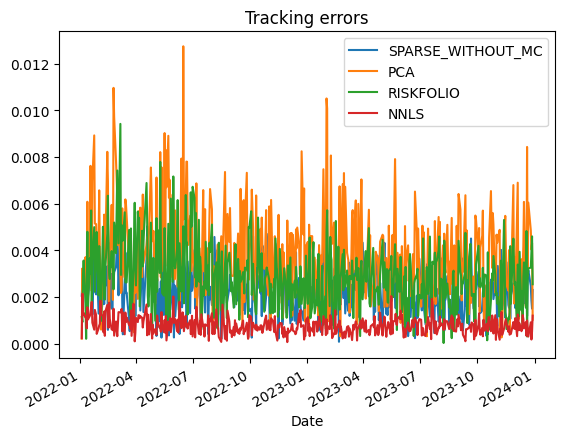

In [384]:
df_tracking_error=pd.DataFrame()
df_tracking_error['SPARSE_WITHOUT_MC']=(df_nsei_comp['NSEI_orig']-df_nsei_comp['NSEI_Replicated']).apply(lambda x: np.sqrt(abs(x)/(df_nsei_comp['NSEI_orig'].shape[0]-1)))
df_tracking_error['PCA']=(df_nsei_comp['NSEI_orig']-df_nsei_comp['NSEI_REP_PCA']).apply(lambda x: np.sqrt(abs(x)/(df_nsei_comp['NSEI_orig'].shape[0]-1)))
df_tracking_error['RISKFOLIO']=(df_nsei_comp['NSEI_orig']-df_nsei_comp['NSEI_RISKFOLIO']).apply(lambda x: np.sqrt(abs(x)/(df_nsei_comp['NSEI_orig'].shape[0]-1)))
df_tracking_error['NNLS']=(df_nsei_comp['NSEI_orig']-df_nsei_comp['NSEI_NNLS']).apply(lambda x: np.sqrt(abs(x)/(df_nsei_comp['NSEI_orig'].shape[0]-1)))
df_tracking_error.plot()
plt.title("Tracking errors")
plt.show();

In [385]:
df_tracking_error.mean()

,0
SPARSE_WITHOUT_MC,0.002275
PCA,0.003821
RISKFOLIO,0.002859
NNLS,0.000772


### Tracking differences


-5.976990032017868e-05
-0.0009181169131619641
-0.0007814589321518274
-8.033373531040641e-05


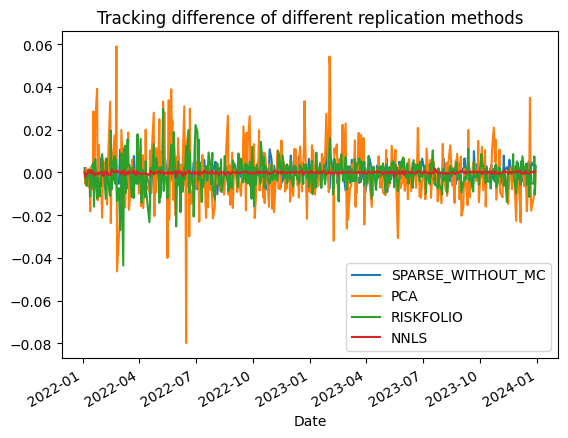

In [386]:
df_tracking_difference=pd.DataFrame()
df_tracking_difference['SPARSE_WITHOUT_MC']=(df_nsei_comp['NSEI_orig']-df_nsei_comp['NSEI_Replicated'])
df_tracking_difference['PCA']=(df_nsei_comp['NSEI_orig']-df_nsei_comp['NSEI_REP_PCA'])
df_tracking_difference['RISKFOLIO']=(df_nsei_comp['NSEI_orig']-df_nsei_comp['NSEI_RISKFOLIO'])
df_tracking_difference['NNLS']=(df_nsei_comp['NSEI_orig']-df_nsei_comp['NSEI_NNLS'])
print(df_tracking_difference['SPARSE_WITHOUT_MC'].mean())
print(df_tracking_difference['PCA'].mean())
print(df_tracking_difference['RISKFOLIO'].mean())
print(df_tracking_difference['NNLS'].mean())
df_tracking_difference.plot()
plt.title("Tracking difference of different replication methods")
plt.show();

In [387]:
df_tracking_difference.mean()

,0
SPARSE_WITHOUT_MC,-0.000060
PCA,-0.000918
RISKFOLIO,-0.000781
NNLS,-0.000080



### Total Performance


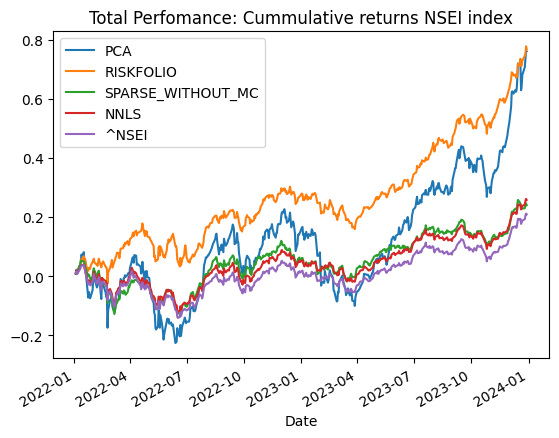

In [388]:
df_cummreturn=pd.DataFrame()
df_cummreturn['PCA']=(1 + df_nsei_comp['NSEI_REP_PCA'].fillna(0)).cumprod() - 1
df_cummreturn['RISKFOLIO']=(1 + df_nsei_comp['NSEI_RISKFOLIO'].fillna(0)).cumprod() - 1
df_cummreturn['SPARSE_WITHOUT_MC']=(1 + df_nsei_comp['NSEI_Replicated'].fillna(0)).cumprod() - 1
df_cummreturn['NNLS']=(1 + df_nsei_comp['NSEI_NNLS'].fillna(0)).cumprod() - 1
df_cummreturn['^NSEI']=(1 + df_nsei_comp['NSEI_orig'].fillna(0)).cumprod() - 1
df_cummreturn.plot()
plt.title("Total Perfomance: Cummulative returns NSEI index")
plt.show();

In [389]:
df_cummreturn.mean()

,0
PCA,0.117835
RISKFOLIO,0.265349
SPARSE_WITHOUT_MC,0.050886
NNLS,0.043081
^NSEI,0.011567


### Sharpe index


Sharpe Ratios: 
Original index:  -0.515950625289047
Replication with PCA index:  -0.18657116117277742
Replication with Riskfolio index:  -0.38706807876522564
Replication with Sparse without MonteCarlo index:  -0.4624177594811159
Replication with NNLS index:  -0.507913258659083


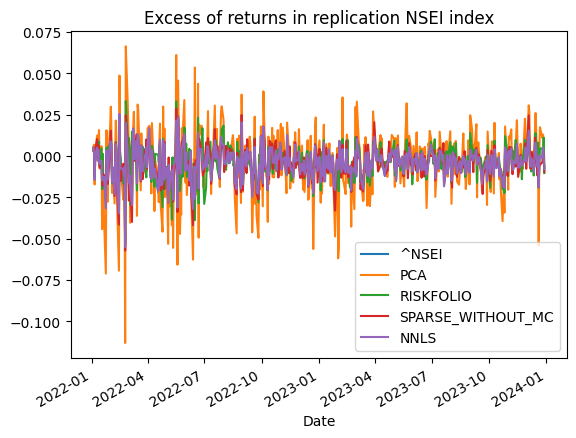

In [390]:
# Suppose risk free rate for example 0.5%
risk_free_rate=0.5/100
excess_return=pd.DataFrame()
excess_return['^NSEI']=df_nsei_comp['NSEI_orig']-risk_free_rate
excess_return['PCA']=df_nsei_comp['NSEI_REP_PCA']-risk_free_rate
excess_return['RISKFOLIO']=df_nsei_comp['NSEI_RISKFOLIO']-risk_free_rate
excess_return['SPARSE_WITHOUT_MC']=df_nsei_comp['NSEI_Replicated']-risk_free_rate
excess_return['NNLS']=df_nsei_comp['NSEI_NNLS']-risk_free_rate
sharpe_ratio_orig=np.mean(excess_return['^NSEI'])/np.std(excess_return['^NSEI'])
sharpe_ratio_pca=np.mean(excess_return['PCA'])/np.std(excess_return['PCA'])
sharpe_ratio_riskfolio=np.mean(excess_return['RISKFOLIO'])/np.std(excess_return['RISKFOLIO'])
sharpe_ratio_sparse_without_mc=np.mean(excess_return['SPARSE_WITHOUT_MC'])/np.std(excess_return['SPARSE_WITHOUT_MC'])
sharpe_ratio_nnls=np.mean(excess_return['NNLS'])/np.std(excess_return['NNLS'])
print('Sharpe Ratios: ')
print('Original index: ', sharpe_ratio_orig)
print('Replication with PCA index: ', sharpe_ratio_pca)
print('Replication with Riskfolio index: ', sharpe_ratio_riskfolio)
print('Replication with Sparse without MonteCarlo index: ', sharpe_ratio_sparse_without_mc)
print('Replication with NNLS index: ', sharpe_ratio_nnls)
excess_return.plot()
plt.title("Excess of returns in replication NSEI index")
plt.show();


### Comparison of prices: Costs


In [391]:
df_prices=pd.DataFrame()
df_prices['SPARSE_WITHOUT_MC']=pd.DataFrame(df_nsei.mul(weights_sparse_withoutMC, axis=1).sum(axis=1))
df_prices['PCA']=pd.DataFrame(df_nsei.mul(weights_pca, axis=1).sum(axis=1))
df_prices['RISKFOLIO']=pd.DataFrame(df_nsei.mul(weights_riskfolio, axis=1).sum(axis=1))
df_prices['NNLS']=pd.DataFrame(df_nsei.mul(weights_nnls, axis=1).sum(axis=1))
df_prices['^NSEI']=df_nsei_index

df_prices.head()

,SPARSE_WITHOUT_MC,PCA,RISKFOLIO,NNLS,^NSEI
Date,,,,,
2022-01-03 00:00:00+00:00,1092.870687,2885.302131,971.371158,1691.857560,17625.699219
2022-01-04 00:00:00+00:00,1102.883673,2896.989915,980.280375,1708.111218,17805.250000
2022-01-05 00:00:00+00:00,1108.823517,2911.763793,982.069340,1726.907412,17925.250000
2022-01-06 00:00:00+00:00,1098.846767,2894.762317,972.445331,1713.282150,17745.900391
2022-01-07 00:00:00+00:00,1107.483880,2905.447125,977.062247,1720.190905,17812.699219


In [392]:
df_prices.describe()

,SPARSE_WITHOUT_MC,PCA,RISKFOLIO,NNLS,^NSEI
count,493.000000,493.000000,493.000000,493.000000,493.000000
mean,1129.642736,2923.061603,1069.834320,1722.566862,18067.974881
std,81.641394,254.273185,91.804644,127.589532,1283.072497
min,955.749250,2412.616106,898.199306,1439.173463,15293.500000
25%,1075.198172,2725.477918,991.032469,1646.208450,17245.650391
50%,1122.422826,2902.744668,1062.402821,1704.245458,17893.449219
75%,1188.340771,3096.081855,1138.950975,1822.358505,18972.099609
max,1348.564347,3666.940660,1337.328490,2073.989703,21778.699219


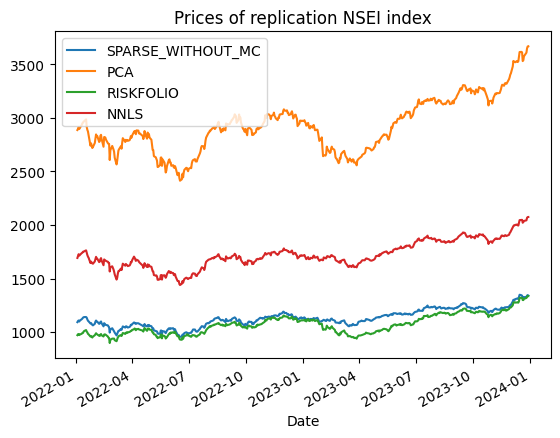

In [393]:
df_prices[['SPARSE_WITHOUT_MC', 'PCA', 'RISKFOLIO', 'NNLS']].plot()
plt.title("Prices of replication NSEI index")
plt.show();

In [394]:
df_prices.mean()

,0
SPARSE_WITHOUT_MC,1129.642736
PCA,2923.061603
RISKFOLIO,1069.834320
NNLS,1722.566862
^NSEI,18067.974881


### Liquidity

In [395]:
df_volumen=extract_liq(nsei_stocks, start_date, end_date)
df_volumen_index=yf.download('^NSEI', start=start_date, end=end_date)['Volume']
df_liq=pd.DataFrame()
df_liq['SPARSE_WITHOUT_MC']=pd.DataFrame(df_volumen.mul(weights_sparse_withoutMC, axis=1).sum(axis=1))
df_liq['PCA']=pd.DataFrame(df_volumen.mul(weights_pca, axis=1).sum(axis=1))
df_liq['RISKFOLIO']=pd.DataFrame(df_volumen.mul(weights_riskfolio, axis=1).sum(axis=1))
df_liq['NNLS']=pd.DataFrame(df_volumen.mul(weights_nnls, axis=1).sum(axis=1))
df_liq['^NSEI']=df_volumen_index
df_liq.head()

[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%********

,SPARSE_WITHOUT_MC,PCA,RISKFOLIO,NNLS,^NSEI
Date,,,,,
2022-01-03 00:00:00+00:00,8.065271e+06,1.370775e+07,7.080311e+06,4.737410e+06,200500
2022-01-04 00:00:00+00:00,9.495531e+06,1.872974e+07,8.621361e+06,6.386304e+06,247400
2022-01-05 00:00:00+00:00,1.353466e+07,1.866935e+07,6.789873e+06,7.581553e+06,251500
2022-01-06 00:00:00+00:00,1.019141e+07,1.747518e+07,6.525408e+06,6.936524e+06,236500
2022-01-07 00:00:00+00:00,9.458098e+06,1.568130e+07,1.023813e+07,6.668186e+06,239300


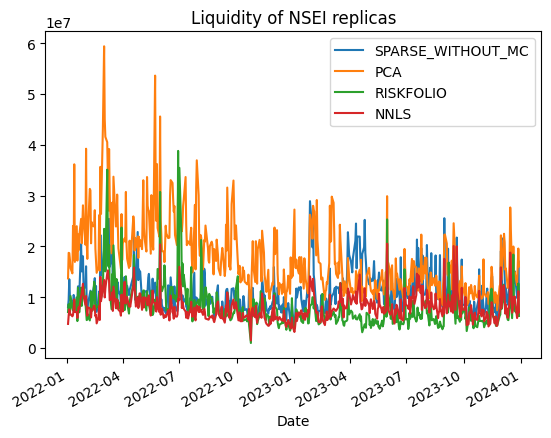

In [396]:
df_liq[['SPARSE_WITHOUT_MC', 'PCA', 'RISKFOLIO', 'NNLS']].plot()
plt.title("Liquidity of NSEI replicas")
plt.show();

In [397]:
df_liq.mean()

,0
SPARSE_WITHOUT_MC,1.125015e+07
PCA,1.789008e+07
RISKFOLIO,8.079605e+06
NNLS,7.983475e+06
^NSEI,2.709227e+05


# Converting into pdf

In [398]:
!jupyter nbconvert --to html /content/MscFE_Capstone_Project.ipynb

[NbConvertApp] WARNING | pattern '/content/MscFE_Capstone_Project.ipynb' matched no files
This application is used to convert notebook files (*.ipynb)
        to various other formats.


Options
The options below are convenience aliases to configurable class-options,
as listed in the "Equivalent to" description-line of the aliases.
To see all configurable class-options for some <cmd>, use:
    <cmd> --help-all

--debug
    set log level to logging.DEBUG (maximize logging output)
    Equivalent to: [--Application.log_level=10]
--show-config
    Show the application's configuration (human-readable format)
    Equivalent to: [--Application.show_config=True]
--show-config-json
    Show the application's configuration (json format)
    Equivalent to: [--Application.show_config_json=True]
--generate-config
    generate default config file
    Equivalent to: [--JupyterApp.generate_config=True]
-y
    Answer yes to any questions instead of prompting.
    Equivalent to: [--JupyterApp.answer_yes

In [399]:
!pip install pandoc

  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 128.0/128.0 kB 5.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 49.6/49.6 kB 3.5 MB/s eta 0:00:00
  Created wheel for pandoc: filename=pandoc-2.4-py3-none-any.whl size=34792 sha256=1e2824876a142ba18ec0576a22f59670576ae43d89da9e63187778968187d18f
  Stored in directory: /root/.cache/pip/wheels/14/79/8c/5d7a023cc8df1aa0381c1739d69da18ae7f90c08b2dc9a1bf5
Successfully built pandoc


In [400]:
!jupyter nbconvert --to pdf /content/MscFE_Capstone_Project.ipynb

[NbConvertApp] WARNING | pattern '/content/MscFE_Capstone_Project.ipynb' matched no files
This application is used to convert notebook files (*.ipynb)
        to various other formats.


Options
The options below are convenience aliases to configurable class-options,
as listed in the "Equivalent to" description-line of the aliases.
To see all configurable class-options for some <cmd>, use:
    <cmd> --help-all

--debug
    set log level to logging.DEBUG (maximize logging output)
    Equivalent to: [--Application.log_level=10]
--show-config
    Show the application's configuration (human-readable format)
    Equivalent to: [--Application.show_config=True]
--show-config-json
    Show the application's configuration (json format)
    Equivalent to: [--Application.show_config_json=True]
--generate-config
    generate default config file
    Equivalent to: [--JupyterApp.generate_config=True]
-y
    Answer yes to any questions instead of prompting.
    Equivalent to: [--JupyterApp.answer_yes

In [401]:
pip install  pandoc
